<a href="https://colab.research.google.com/github/wongwenhui262/HTX/blob/main/Online_Peer_Help_Giving_Interactions.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import files
uploaded=files.upload()


In [ ]:
!pip install dalex
!pip install researchpy
!pip install matplotlib


import pandas as pd
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.svm import SVC
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import make_column_transformer
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import train_test_split

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import dalex as dx
import matplotlib
import matplotlib.ticker as mtick
import matplotlib.pyplot as plt

import seaborn as sns
%matplotlib inline
import scipy.stats as ss

import numpy as np


import pandas as pd

import researchpy as rpy


import matplotlib.pyplot as plt


from scipy import stats
from scipy.stats.contingency import expected_freq

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 9.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for dalex: filename=dalex-1.7.0-py3-none-any.whl size=1042471 sha256=58a2a7749a6460baaf7c9a0aed3f29f7d09e69cb4db19960db17ed22044ef0e0
  Stored in directory: /root/.cache/pip/wheels/e2/38/c1/25a95206a4873a287d776fc8e77aa7d93971acc643ecb3db38
Successfully built dalex


In [ ]:
uploaded

{'ForumMessages2.csv': b'Id,ForumTopicId,PostUserId,PostDate,ReplyToForumMessageId,Message,,,,,,,,,,\r\n1,1,478,4/28/2010 23:13,,"In response to a comment on the No Free Hunch Blog here and on my website here ... I\'m listing a few ideas that may give you a head-start on how to get started: There are a whole lotta ways to do this sort of prediction, since I come from a machine-learning background I\'ll describe it from that perspective:  So in my mind I need to extract a set of features (observations) from each sequences, then train a SVM, logistic-regression, decision-forest, or ensemble classifier to learn which features are important.  Each of those classifiers have advantages and disadvantages that are very well documented ... a safari through Wikipedia should give you a pretty good idea.  The hardest part is deciding which features are worth (or even possible) to put into your model: I know people who use k-mers"" as their features ... this involves finding and counting all of the

In [ ]:
df=pd.read_csv("ForumMessages2.csv",encoding= 'unicode_escape')

In [ ]:
df

,Id,ForumTopicId,PostUserId,PostDate,ReplyToForumMessageId,Message,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,Unnamed: 10,Unnamed: 11,Unnamed: 12,Unnamed: 13,Unnamed: 14,Unnamed: 15
0,1.0,1.0,478.0,4/28/2010 23:13,NaN,In response to a comment on the No Free Hunch ...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2.0,2.0,606.0,4/29/2010 15:48,NaN,"Hi, I'm interested in participating in the con...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3.0,2.0,478.0,4/29/2010 15:48,NaN,"Tanya, Good to hear from you. Since we plan t...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4.0,2.0,368.0,4/29/2010 15:48,NaN,"Hi Tanya, Kaggle will maintain a rating syste...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5.0,3.0,634.0,4/30/2010 14:32,NaN,"Hi, I just read in csv files and I've got a qu...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1240,1934.0,310.0,1335.0,3/1/2011 0:40,NaN,Here we combine a logistic regression model wi...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1241,1935.0,303.0,5395.0,2/21/2011 14:45,NaN,<P>Your classifier&nbsp;output&nbsp;values (sa...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1242,1936.0,322.0,1335.0,3/4/2011 10:44,NaN,"<a href=""http://cran.r-project.org/web/package...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1243,1937.0,327.0,2521.0,3/8/2011 6:59,NaN,Rosanne jumped out to an impressive lead with ...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
%matplotlib inline
import networkx as nx
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np
import warnings
warnings.filterwarnings('ignore')
from collections import Counter
import sys
import os
from __future__ import division
plt.rcParams["figure.figsize"] = (20,10)
from itertools import chain
import tqdm as tqdm


warnings.filterwarnings('ignore')
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:80% !important; }</style>"))

# NLTK libraries
import nltk
nltk.download('stopwords')
nltk.download('punkt')
nltk.download('averaged_perceptron_tagger')
nltk.download('wordnet')
nltk.download('omw-1.4')
from nltk.corpus import stopwords
from nltk import FreqDist
from nltk.tokenize import word_tokenize
from nltk.stem.wordnet import WordNetLemmatizer
from nltk.corpus import wordnet

#Modelling
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix, classification_report, roc_auc_score


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...


In [ ]:

from google.colab import files
uploaded=files.upload()

In [ ]:
df3=pd.read_csv("coursea_discussion_forum.csv",encoding= 'unicode_escape')

In [ ]:
df3

,Thread,Post_user,Post_replies_ID,Unnamed: 3
0,1.0,Dr Lalit Mehra,Alexis,NaN
1,NaN,Dr Lalit Mehra,Octavia Nyamekye Ocran,NaN
2,NaN,Dr Lalit Mehra,Viviana Jacqueline Huerta Castro,NaN
3,NaN,Dr Lalit Mehra,Sagar Siripuram\nDiksha Mishra,NaN
4,NaN,Dr Lalit Mehra,Prabhroop Kaur,NaN
...,...,...,...,...
98,NaN,Dr Y White-Morey,Divij Gupta,NaN
99,NaN,Dr Y White-Morey,lisa pereira,NaN
100,NaN,lisa pereira,Dr Y White-Morey,NaN
101,NaN,Dr Y White-Morey,Ayush Patnaik,NaN


In [ ]:
G2 = nx.from_pandas_edgelist(df3,
                            source='Post_user',
                            target='Post_replies_ID',

                            create_using=nx.DiGraph())

In [ ]:
G2

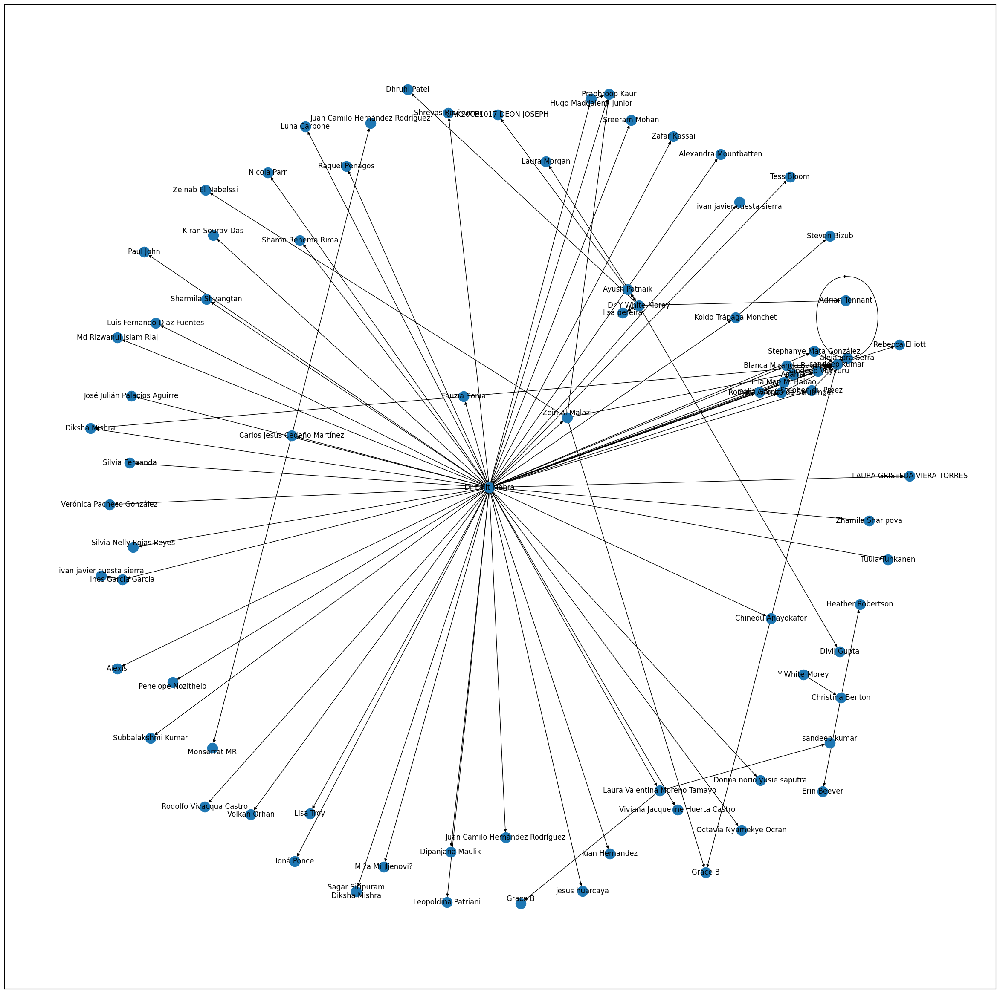

In [ ]:
#nx.draw_networkx(G2)
# larger figure size
plt.figure(3,figsize=(30,30))

nx.draw_networkx(G2)
plt.show()

In [ ]:
G2.out_degree

OutDegreeView({'Dr Lalit Mehra': 59, 'Alexis': 0, 'Octavia Nyamekye Ocran': 0, 'Viviana Jacqueline Huerta Castro': 0, 'Sagar Siripuram\nDiksha Mishra': 0, 'Prabhroop Kaur': 0, '\nPenelope Nozithelo': 0, '\nHugo Maddalena Junior': 1, 'Laura Valentina Moreno Tamayo': 2, 'Kiran Sourav Das\n': 0, 'José Julián Palacios Aguirre': 0, 'sandeep kumar': 1, 'Zein Al Malazi\n': 4, 'Fauzia Sonia': 2, 'Chinedu Anayokafor': 2, 'Stephen du Preez': 1, 'alejandra Serra': 2, 'Ella Mae M. Babao': 1, 'Stephanye Mata González': 1, 'Blanca Miranda Bautista': 1, 'Romina Alfonzo de Strubinger': 1, 'Dalia García': 1, 'Aparna': 1, 'Koldo Trápaga Monchet': 1, '\nSandeep Vuyyuru\n': 1, 'Md Rizwanul Islam Riaj': 0, 'Ines Garcia Garcia': 1, 'Mi?a Mi\x9aljenovi?': 0, 'Donna norio yusie saputra': 0, 'Carlos Jesús Cedeño Martínez': 2, 'Sílvia Fernanda': 0, 'Sharmila Shyangtan': 0, 'LAURA GRISELDA VIERA TORRES': 0, 'Rodolfo Vivacqua Castro': 0, 'Sreeram Mohan': 0, 'Lisa Troy': 0, 'Dipanjana Maulik': 0, 'Volkan Orhan': 0

In [ ]:
G2sub = G2.edge_subgraph([(e[0],e[1]) for e in G2.edges(data=True)])
G2sub

(array([78.,  2.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.]),
 array([ 1. ,  6.8, 12.6, 18.4, 24.2, 30. , 35.8, 41.6, 47.4, 53.2, 59. ]),
 <BarContainer object of 10 artists>)

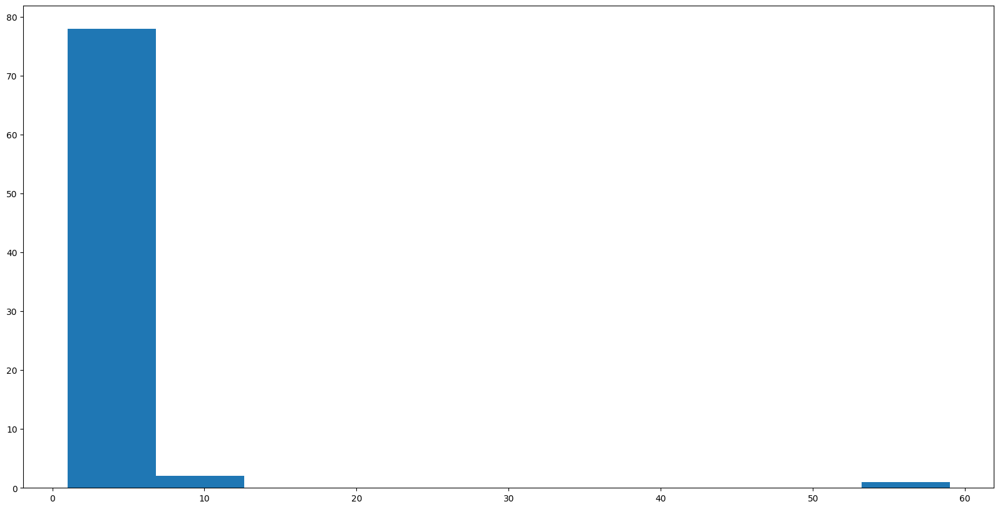

In [ ]:
plt.hist(dict(G2sub.degree()).values())

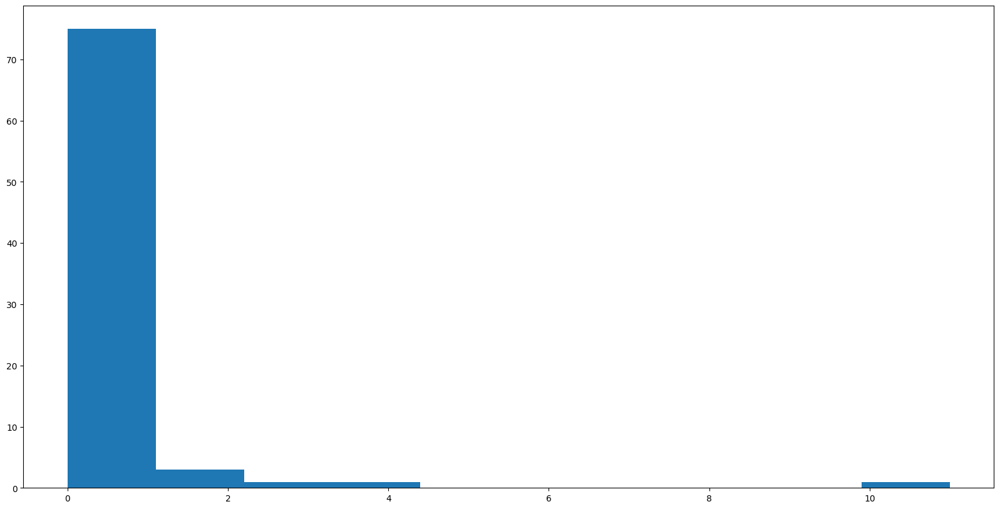

In [ ]:
h = plt.hist(dict(G2.in_degree).values())

In [ ]:
deg_cen_points = dict(G2.in_degree)
{k:deg_cen_points[k] for k in deg_cen_points if deg_cen_points[k]==max(deg_cen_points.values())}

{'sandeep kumar': 11}

In [ ]:
between = dict(nx.betweenness_centrality(G2,weight='points'))
{k:between[k] for k in between if between[k]==max(between.values())}

{'sandeep kumar': 0.002056962025316456}

In [ ]:

from google.colab import files
uploaded=files.upload()

TypeError: 'NoneType' object is not subscriptable

In [ ]:
df4=pd.read_csv("coursea_discussion_forum_sustainability2.csv",encoding= 'unicode_escape')

In [ ]:
df4

,Thread,Post_user,Post_replies_ID
0,1.0,Vivian Le,Aleyda Urrutia Ibarguen
1,NaN,Vivian Le,\nshiv shankar\n
2,NaN,Vivian Le,Bishesh Subedi\n
3,NaN,Vivian Le,Krishn Mathur\n
4,NaN,Vivian Le,Monica Morales\n
5,NaN,Vivian Le,Deepu Kv
6,NaN,Deepu Kv,Aleyda Urrutia Ibarguen
7,NaN,Vivian Le,Muchamad Raihan Nafis
8,NaN,Vivian Le,Liza Mung'atia
9,NaN,Vivian Le,Menka Ahlawat


In [ ]:
G4 = nx.from_pandas_edgelist(df4,
                            source='Post_user',
                            target='Post_replies_ID',

                            create_using=nx.DiGraph())

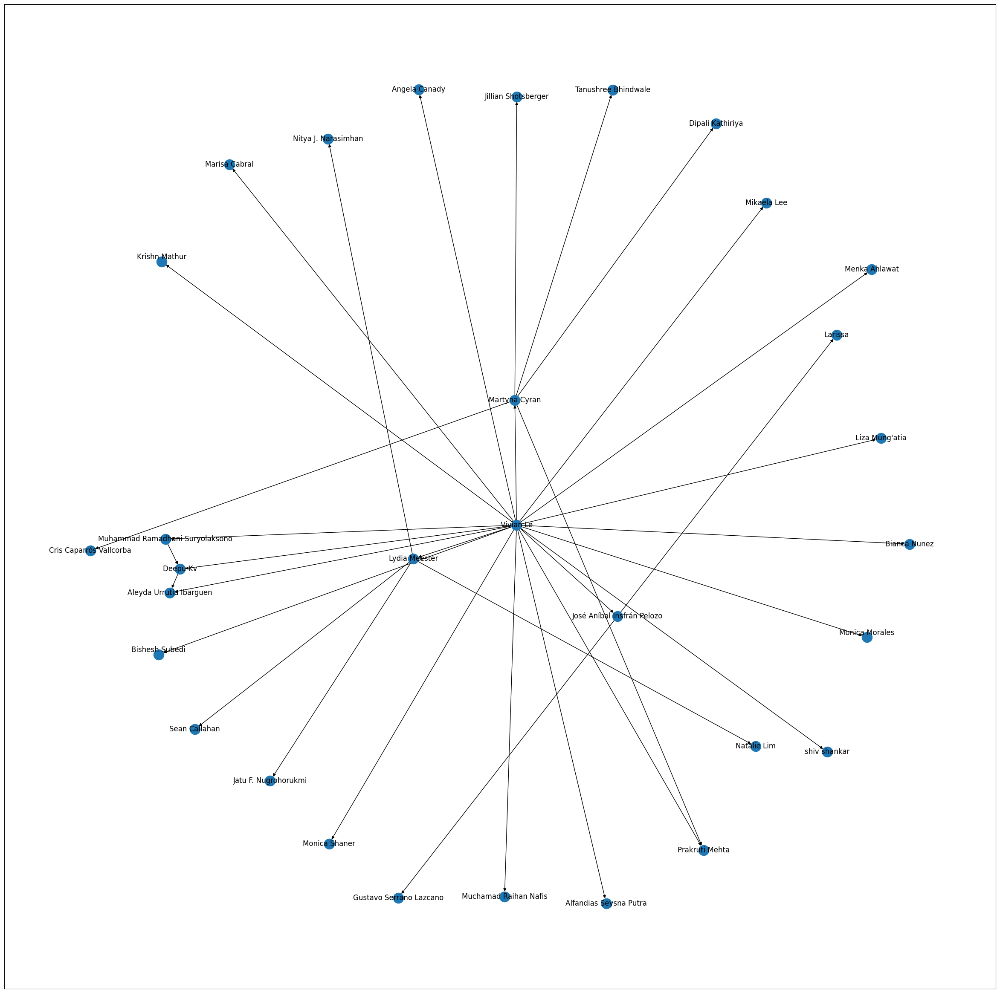

In [ ]:
plt.figure(3,figsize=(30,30))

nx.draw_networkx(G4)
plt.show()

In [ ]:
G4.out_degree

OutDegreeView({'Vivian Le': 20, 'Aleyda Urrutia Ibarguen': 0, '\nshiv shankar\n': 0, 'Bishesh Subedi\n': 0, 'Krishn Mathur\n': 0, 'Monica Morales\n': 0, 'Deepu Kv': 1, 'Muchamad Raihan Nafis': 0, "Liza Mung'atia": 0, 'Menka Ahlawat': 0, 'Marisa Cabral': 0, 'Angela Canady': 0, 'Muhammad Ramadhani Suryolaksono': 1, 'Lydia Meester': 4, 'Sean Callahan': 0, 'Nitya J. Narasimhan': 0, 'Natalie Lim': 0, 'Jatu F. Nugrohorukmi': 0, 'José Aníbal Insfrán Pelozo': 2, 'Larissa': 0, 'Gustavo Serrano Lazcano': 0, 'Prakruti Mehta': 0, 'Alfandias Seysna Putra': 0, 'Monica Shaner': 0, 'Mikaela Lee': 0, 'Bianca Nunez': 0, 'Martyna Cyran': 5, 'Jillian Shotsberger': 0, 'Dipali Kathiriya': 0, 'Cris Caparrós Vallcorba': 0, 'Tanushree Bhindwale': 0})

In [ ]:
G4sub = G4.edge_subgraph([(e[0],e[1]) for e in G4.edges(data=True)])
G4sub

(array([26.,  2.,  2.,  0.,  0.,  0.,  0.,  0.,  0.,  1.]),
 array([ 1. ,  2.9,  4.8,  6.7,  8.6, 10.5, 12.4, 14.3, 16.2, 18.1, 20. ]),
 <BarContainer object of 10 artists>)

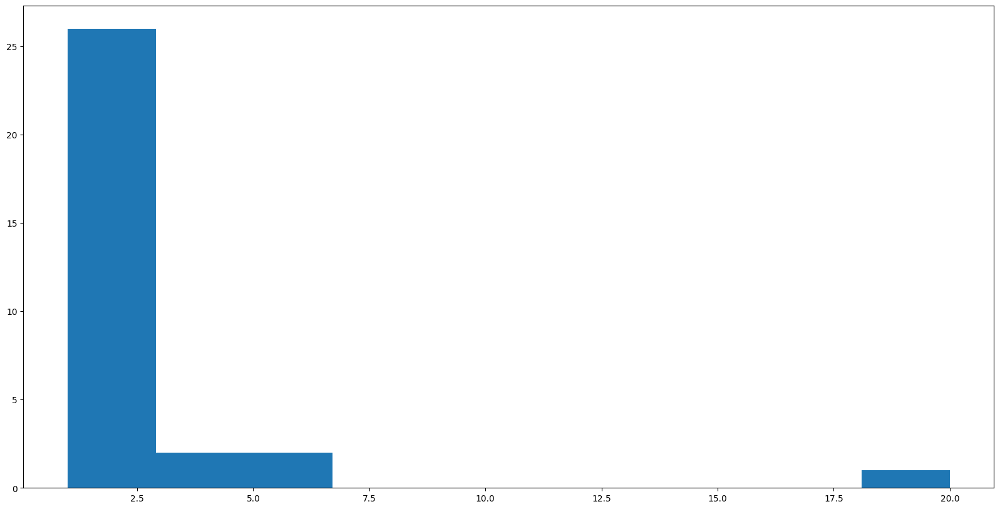

In [ ]:
plt.hist(dict(G4sub.degree()).values())

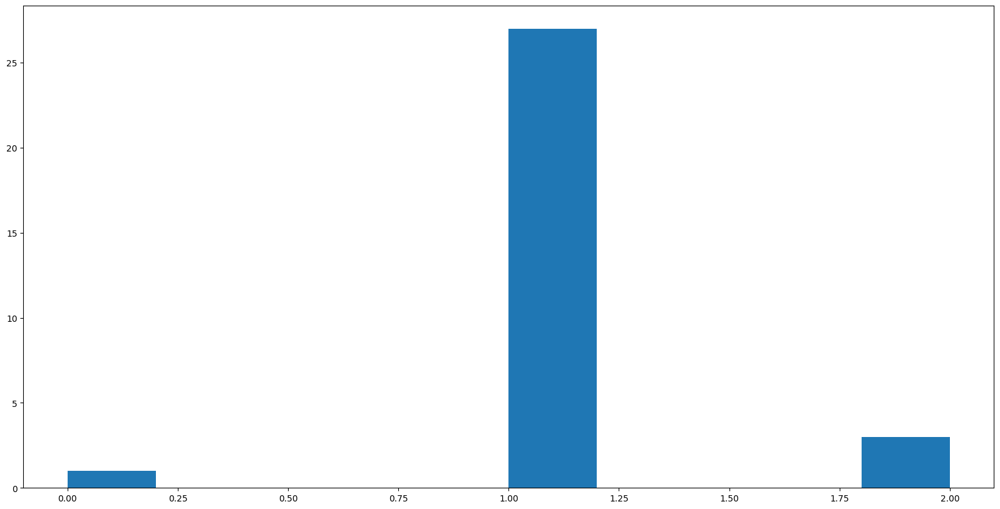

In [ ]:
h = plt.hist(dict(G4.in_degree).values())

In [ ]:
deg_cen_points = dict(G4.in_degree)
{k:deg_cen_points[k] for k in deg_cen_points if deg_cen_points[k]==max(deg_cen_points.values())}

{'Aleyda Urrutia Ibarguen': 2, 'Deepu Kv': 2, 'Prakruti Mehta': 2}

In [ ]:
between = dict(nx.betweenness_centrality(G4,weight='points'))
{k:between[k] for k in between if between[k]==max(between.values())}

{'Lydia Meester': 0.004597701149425287, 'Martyna Cyran': 0.004597701149425287}

In [ ]:
from google.colab import files
uploaded=files.upload()

Saving coursea_discussion_forum_sustainability3.csv to coursea_discussion_forum_sustainability3.csv


In [ ]:
df5=pd.read_csv("coursea_discussion_forum_sustainability3.csv",encoding= 'unicode_escape')

In [ ]:
df5

,Thread,Post_user,Post_replies_ID
0,1.0,Abhay Gaur,Aarón Montaño
1,NaN,Abhay Gaur,Jackrlyn Gamarra\n
2,NaN,Abhay Gaur,Sean Bishop
3,NaN,Abhay Gaur,Renee Ngo
4,NaN,Renee Ngo,Monica M. Weller
5,NaN,Abhay Gaur,Aditya kumar
6,NaN,Abhay Gaur,Marcelo De Stefano
7,NaN,Abhay Gaur,Penelope Nozithelo
8,NaN,Abhay Gaur,Mark-Anthony Williams
9,NaN,Abhay Gaur,Ni Made Dwi Dharmiyanti


In [ ]:
G5 = nx.from_pandas_edgelist(df5,
                            source='Post_user',
                            target='Post_replies_ID',

                            create_using=nx.DiGraph())

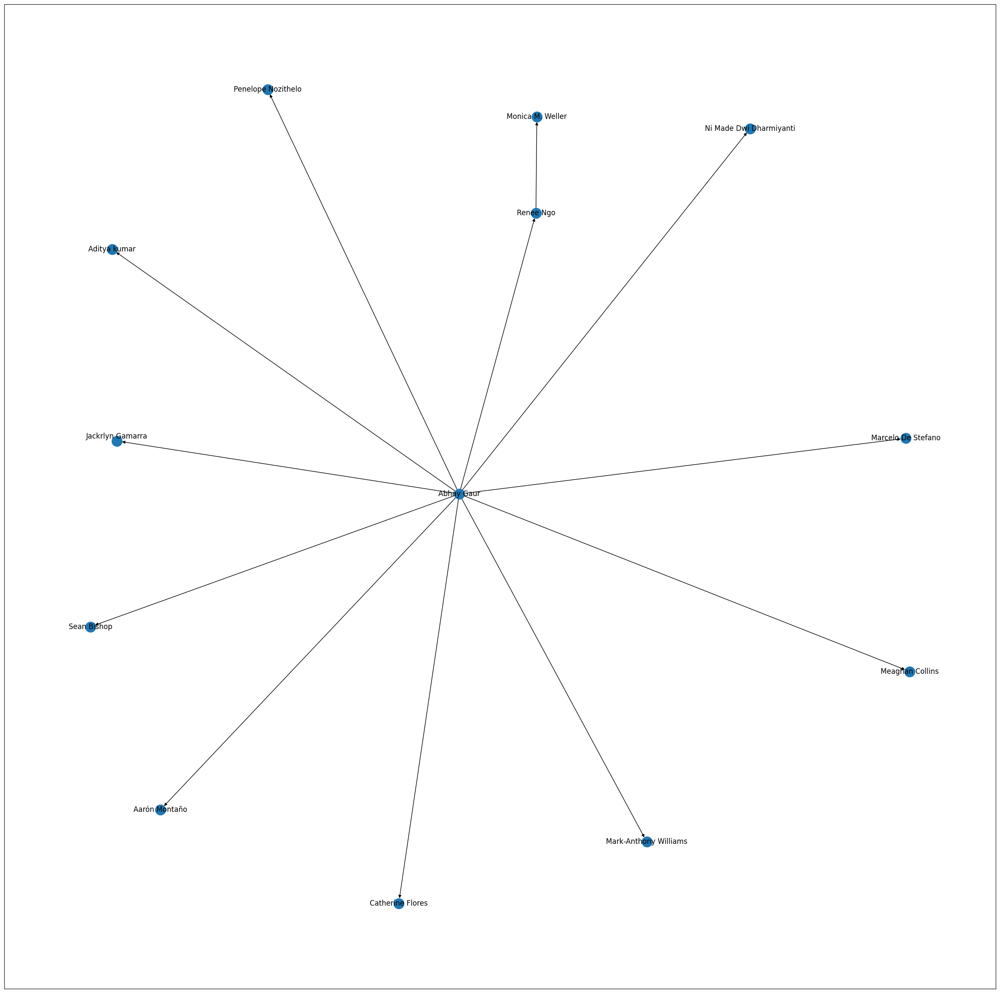

In [ ]:
#nx.draw_networkx(G2)
# larger figure size
plt.figure(3,figsize=(30,30))

nx.draw_networkx(G5)
plt.show()

In [ ]:
G5.out_degree

OutDegreeView({'Abhay Gaur': 11, 'Aarón Montaño': 0, 'Jackrlyn Gamarra\n': 0, 'Sean Bishop': 0, 'Renee Ngo': 1, 'Monica M. Weller': 0, 'Aditya kumar': 0, 'Marcelo De Stefano': 0, 'Penelope Nozithelo': 0, 'Mark-Anthony Williams': 0, 'Ni Made Dwi Dharmiyanti': 0, 'Catherine Flores': 0, 'Meaghan Collins': 0})

In [ ]:
G5sub = G5.edge_subgraph([(e[0],e[1]) for e in G5.edges(data=True)])
G5sub

(array([11.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.]),
 array([ 1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10., 11.]),
 <BarContainer object of 10 artists>)

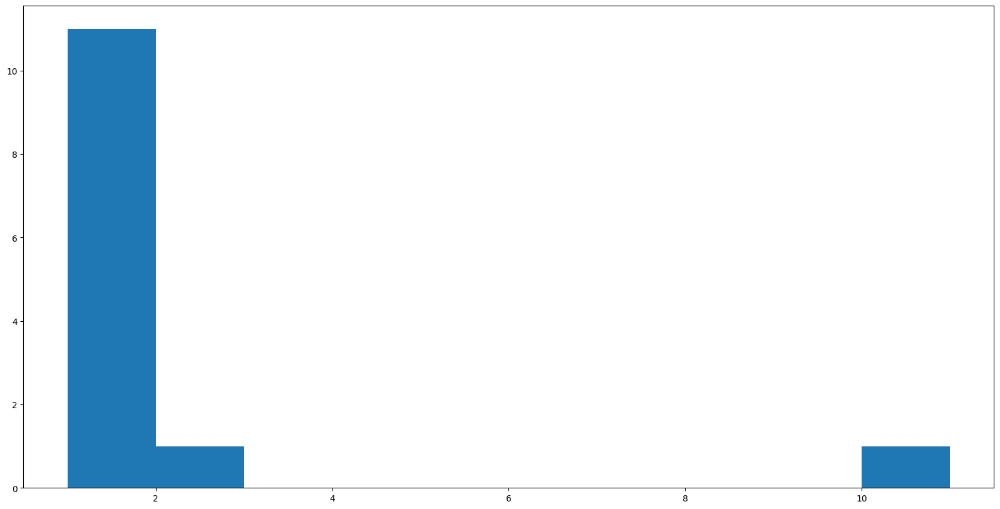

In [ ]:
plt.hist(dict(G5sub.degree()).values())

In [ ]:
deg_cen_points = dict(G5.in_degree)
{k:deg_cen_points[k] for k in deg_cen_points if deg_cen_points[k]==max(deg_cen_points.values())}

{'Aarón Montaño': 1,
 'Jackrlyn Gamarra\n': 1,
 'Sean Bishop': 1,
 'Renee Ngo': 1,
 'Monica M. Weller': 1,
 'Aditya kumar': 1,
 'Marcelo De Stefano': 1,
 'Penelope Nozithelo': 1,
 'Mark-Anthony Williams': 1,
 'Ni Made Dwi Dharmiyanti': 1,
 'Catherine Flores': 1,
 'Meaghan Collins': 1}

In [ ]:
between = dict(nx.betweenness_centrality(G5,weight='points'))
{k:between[k] for k in between if between[k]==max(between.values())}

{'Renee Ngo': 0.007575757575757576}

In [ ]:
from google.colab import files
uploaded=files.upload()

In [ ]:
df6=pd.read_csv("Comparative_Advantage_of_Your_Local_Area_November_27_2023.csv",encoding= 'unicode_escape')

In [ ]:
df6

,Thread,Post_user,Post_replies_ID,Forum_Sentiment
0,1.0,Rebecca stein\n,Piero Gigante Bianchini,Think of two goods that your country or region...
1,1.0,Rebecca stein\n,rizwan hassan,Surgical instruments Sports Goods
2,1.0,Rebecca stein\n,Nouran Khalid mohamed elhassan ahmed\n,My country gains alot fron trade and it doesn...
3,1.0,Rebecca stein\n,Rutger Verbiest,Cars and Grain
4,1.0,Rebecca stein\n,Javad Mohammadi,"In Afghanistan, we make or use two main goods:..."
...,...,...,...,...
62,1.0,Rebecca stein\n,SRIKA S\n,The two goods which are included here are rice...
63,1.0,Rebecca stein\n,vaishnav vedanaparthi,Hi how are you
64,1.0,Rebecca stein\n,\nAlthaf kouser yousuff,India exports rice and imports fabric. India...
65,1.0,Rebecca stein\n,João Pedro Maricato Domingues,Let's consider a country that produces two goo...


In [ ]:
import networkx as nx

G6 = nx.from_pandas_edgelist(df6,
                            source='Post_user',
                            target='Post_replies_ID',

                            create_using=nx.DiGraph())

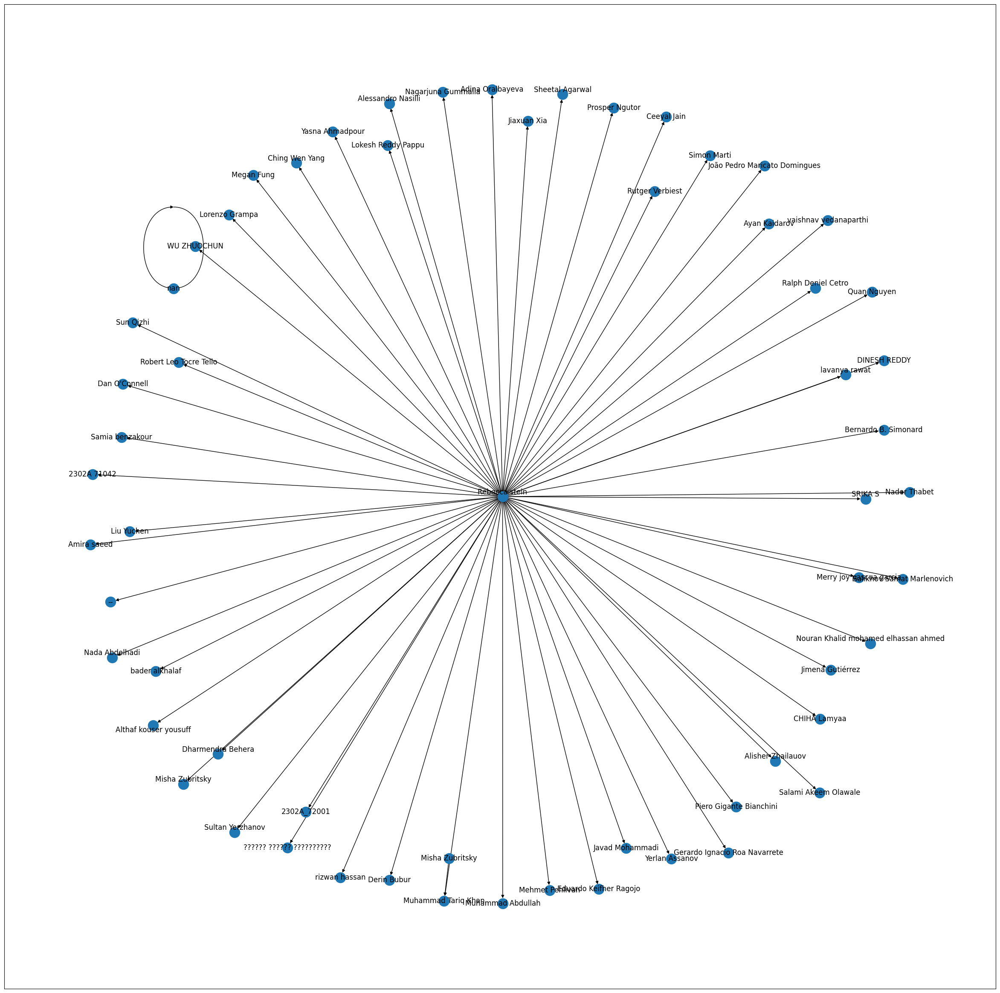

In [ ]:
plt.figure(3,figsize=(30,30))

nx.draw_networkx(G6)
plt.show()

In [ ]:
G6.out_degree

OutDegreeView({'Rebecca stein\n': 58, 'Piero Gigante Bianchini': 0, 'rizwan hassan': 0, 'Nouran Khalid mohamed elhassan ahmed\n': 0, 'Rutger Verbiest': 0, 'Javad Mohammadi': 0, 'Salami Akeem Olawale': 0, 'CHIHA Lamyaa': 0, nan: 1, 'Yasna Ahmadpour': 0, 'Ceeyal Jain': 0, 'Simon Marti': 0, 'Muhammad Abdullah': 0, 'Quan Nguyen': 0, 'Sheetal Agarwal\n': 0, 'Dharmendra Behera\n': 0, 'Merry joy pascua garcia': 0, 'Adina Oralbayeva': 0, 'Robert Leo Tocre Tello': 0, '--': 0, 'Ching Wen Yang\n': 0, 'Bernardo B. Simonard': 0, '?????? ?????? ??????????': 0, 'Megan Fung': 0, 'Salikhov Samat Marlenovich': 0, 'DINESH REDDY': 0, 'Lorenzo Grampa': 0, 'Gerardo Ignacio Roa Navarrete': 0, 'Ralph Deniel Cetro\n': 0, 'Yerlan Assanov': 0, 'bader alkhalaf': 0, 'Alessandro Nasilli\n': 0, 'Ayan Kaidarov': 0, 'Jimena Gutiérrez': 0, 'Prosper Ngutor': 0, 'Eduardo Keifher Ragojo': 0, '2302A_72001': 0, 'lavanya rawat\n': 0, 'Muhammad Tariq Khan': 0, 'Misha Zubritsky\n': 0, 'Misha Zubritsky': 1, 'WU ZHUOCHUN': 0, '2

In [ ]:
G6sub = G6.edge_subgraph([(e[0],e[1]) for e in G6.edges(data=True)])
G6sub

(array([60.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.]),
 array([ 1. ,  6.7, 12.4, 18.1, 23.8, 29.5, 35.2, 40.9, 46.6, 52.3, 58. ]),
 <BarContainer object of 10 artists>)

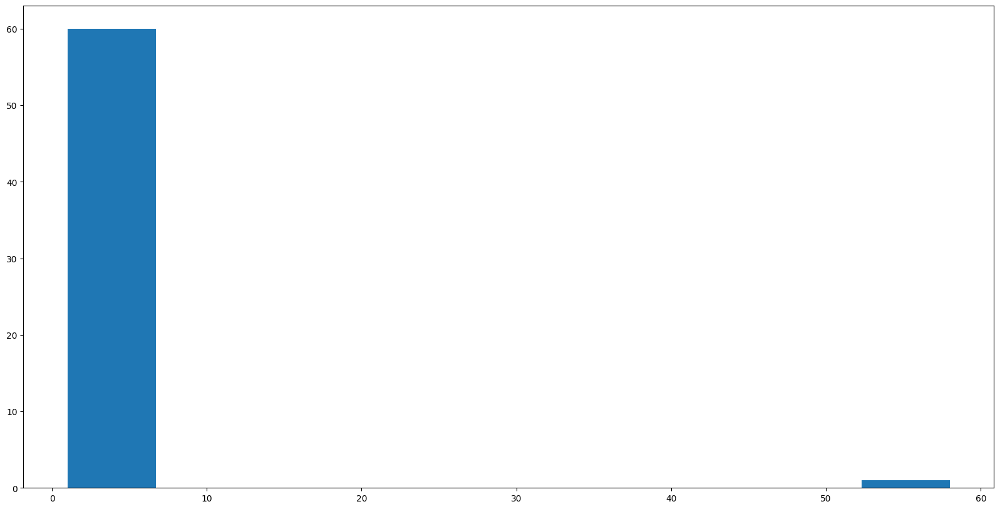

In [ ]:
plt.hist(dict(G6sub.degree()).values())

In [ ]:

import nltk
nltk.download('stopwords')

from wordcloud import WordCloud

# Generate word cloud
def generate_word_cloud(Text):
    wordcloud = WordCloud(
        background_color='white',
        width = 1000,
        height = 500).generate(str(Text))
    fig = plt.figure(
        figsize = (10, 6),
        facecolor = 'k',
        edgecolor = 'k')
    plt.imshow(wordcloud, interpolation = 'bilinear')
    plt.axis('off')
    plt.tight_layout(pad=0)
    plt.show()

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [ ]:
df6.head()

,Thread,Post_user,Post_replies_ID,Forum_Sentiment
0,1.0,Rebecca stein\n,Piero Gigante Bianchini,Think of two goods that your country or region...
1,1.0,Rebecca stein\n,rizwan hassan,Surgical instruments Sports Goods
2,1.0,Rebecca stein\n,Nouran Khalid mohamed elhassan ahmed\n,My country gains alot fron trade and it doesn...
3,1.0,Rebecca stein\n,Rutger Verbiest,Cars and Grain
4,1.0,Rebecca stein\n,Javad Mohammadi,"In Afghanistan, we make or use two main goods:..."


In [ ]:

# check null values again before dropping them
df6.isnull().sum()

Thread             4
Post_user          8
Post_replies_ID    8
Forum_Sentiment    8
dtype: int64

In [ ]:

# Null values are dropped
df6.dropna(inplace=True)
df6.isnull().sum()

Thread             0
Post_user          0
Post_replies_ID    0
Forum_Sentiment    0
dtype: int64

In [ ]:
df6.head()

,Thread,Post_user,Post_replies_ID,Forum_Sentiment
0,1.0,Rebecca stein\n,Piero Gigante Bianchini,Think of two goods that your country or region...
1,1.0,Rebecca stein\n,rizwan hassan,Surgical instruments Sports Goods
2,1.0,Rebecca stein\n,Nouran Khalid mohamed elhassan ahmed\n,My country gains alot fron trade and it doesn...
3,1.0,Rebecca stein\n,Rutger Verbiest,Cars and Grain
4,1.0,Rebecca stein\n,Javad Mohammadi,"In Afghanistan, we make or use two main goods:..."


In [ ]:
'''function to clean the text and remove all the unnecessary elements.'''
import re
import string

def clean_text(series):
    # Convert the series to lowercase
    series = series.str.lower()

    # Remove leading and trailing whitespaces
    series = series.str.strip()

    # Remove square brackets and their contents
    series = series.str.replace(r'\[\s*\w*\s*\]', '', regex=True)

    # Remove punctuation
    series = series.str.translate(str.maketrans('', '', string.punctuation))

    # Remove words with digits
    series = series.str.replace(r'\S*\d\S*', '', regex=True)

    return series

In [ ]:
#Calling the function to clean the dataset

#df6 = df6.values.tolist()
df6 = pd.DataFrame(df6)

df6['partially_cleaned_text'] = clean_text(df6['Forum_Sentiment'])

NameError: name 'df6' is not defined

In [ ]:
df6

,Thread,Post_user,Post_replies_ID,Forum_Sentiment,partially_cleaned_text
0,1.0,Rebecca stein\n,Piero Gigante Bianchini,Think of two goods that your country or region...,think of two goods that your country or region...
1,1.0,Rebecca stein\n,rizwan hassan,Surgical instruments Sports Goods,surgical instruments sports goods
2,1.0,Rebecca stein\n,Nouran Khalid mohamed elhassan ahmed\n,My country gains alot fron trade and it doesn...,my country gains alot fron trade and it doesn...
3,1.0,Rebecca stein\n,Rutger Verbiest,Cars and Grain,cars and grain
4,1.0,Rebecca stein\n,Javad Mohammadi,"In Afghanistan, we make or use two main goods:...",in afghanistan we make or use two main goods c...
5,1.0,Rebecca stein\n,Salami Akeem Olawale,Crude oil and wheat\n\n,crude oil and wheat
6,1.0,Rebecca stein\n,CHIHA Lamyaa,"Morocco exports phosphates, leveraging its com...",morocco exports phosphates leveraging its comp...
8,1.0,Rebecca stein\n,Yasna Ahmadpour,my country is known for exporting oil and natu...,my country is known for exporting oil and natu...
9,1.0,Rebecca stein\n,Ceeyal Jain,India grows rice and fabric. India exports ric...,india grows rice and fabric india exports rice...
10,1.0,Rebecca stein\n,Simon Marti,My country produces and exports beer and impo...,my country produces and exports beer and impo...


In [ ]:
# This is a helper function to map NTLK position tags
def get_wordnet_pos(tag):
    if tag.startswith('J'):
        return wordnet.ADJ
    elif tag.startswith('V'):
        return wordnet.VERB
    elif tag.startswith('N'):
        return wordnet.NOUN
    elif tag.startswith('R'):
        return wordnet.ADV
    else:
        return wordnet.NOUN

In [ ]:
stop_words = set(stopwords.words('english'))

def remove_stopword(text):
    words = [word for word in text.split() if word.isalpha() and word not in stop_words]
    return " ".join(words)

In [ ]:
def lemma_text(text):
    # Assuming text is a string
    words = text.split()
    # Exclude single-letter words
    words = [word for word in words if len(word) > 3]
    # Lemmatize each word
    lemmatizer = WordNetLemmatizer()
    words = [lemmatizer.lemmatize(word) for word in words]
    # Join the words back into a string
    return ' '.join(words)

In [ ]:

# Assuming 'partially_clean_text' is the column you want to process
df6['fully_cleaned_text'] = df6['partially_cleaned_text'].apply(lemma_text)

NameError: name 'df6' is not defined

In [ ]:
df6

,Thread,Post_user,Post_replies_ID,Forum_Sentiment,partially_cleaned_text,fully_cleaned_text
0,1.0,Rebecca stein\n,Piero Gigante Bianchini,Think of two goods that your country or region...,think of two goods that your country or region...,think two good country region make us export i...
1,1.0,Rebecca stein\n,rizwan hassan,Surgical instruments Sports Goods,surgical instruments sports goods,surgical instrument sport good
2,1.0,Rebecca stein\n,Nouran Khalid mohamed elhassan ahmed\n,My country gains alot fron trade and it doesn...,my country gains alot fron trade and it doesn...,country gain alot fron trade loses
3,1.0,Rebecca stein\n,Rutger Verbiest,Cars and Grain,cars and grain,car grain
4,1.0,Rebecca stein\n,Javad Mohammadi,"In Afghanistan, we make or use two main goods:...",in afghanistan we make or use two main goods c...,afghanistan make use two main good carpet frui...
5,1.0,Rebecca stein\n,Salami Akeem Olawale,Crude oil and wheat\n\n,crude oil and wheat,crude oil wheat
6,1.0,Rebecca stein\n,CHIHA Lamyaa,"Morocco exports phosphates, leveraging its com...",morocco exports phosphates leveraging its comp...,morocco export phosphates leverage comparative...
8,1.0,Rebecca stein\n,Yasna Ahmadpour,my country is known for exporting oil and natu...,my country is known for exporting oil and natu...,country know export oil natural gas key good i...
9,1.0,Rebecca stein\n,Ceeyal Jain,India grows rice and fabric. India exports ric...,india grows rice and fabric india exports rice...,india grow rice fabric india export rice due c...
10,1.0,Rebecca stein\n,Simon Marti,My country produces and exports beer and impo...,my country produces and exports beer and impo...,country produce export beer import wine compar...


In [ ]:
score_vec=df6['fully_cleaned_text']

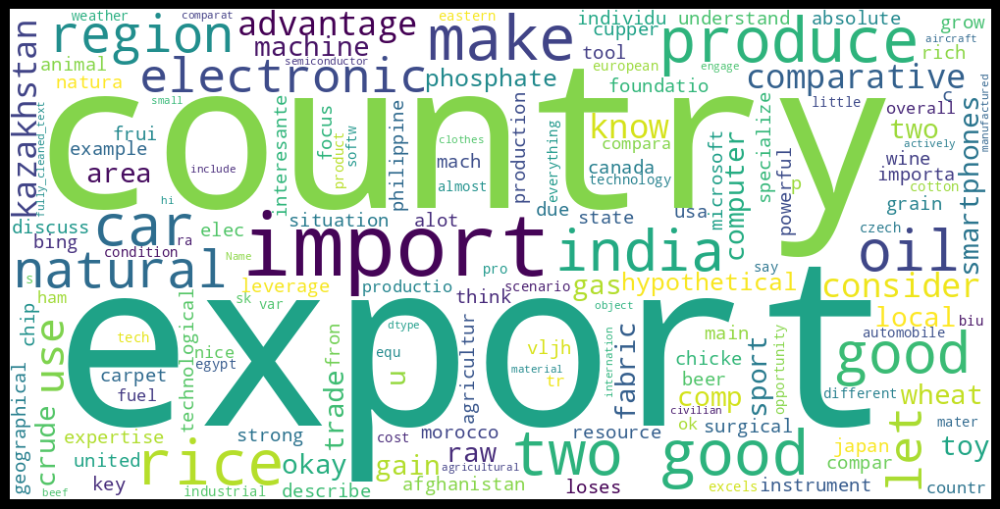

In [ ]:
generate_word_cloud(score_vec)

In [ ]:
import string

def getMostCommonWords(reviews, n_most_common):
    # flatten review column into a list of words, and set each to lowercase
    flattened_reviews = [word for review in reviews for word in \
                         review.lower().split()]

                           # remove punctuation from reviews
    flattened_reviews = [''.join(char for char in review if \
                                 char not in string.punctuation) for \
                         review in flattened_reviews]


    # remove any empty strings that were created by this process
    flattened_reviews = [review for review in flattened_reviews if review]

    return Counter(flattened_reviews).most_common(n_most_common)

In [ ]:

getMostCommonWords(df6['fully_cleaned_text'],10)

[('country', 123),
 ('good', 74),
 ('trade', 72),
 ('import', 71),
 ('export', 70),
 ('advantage', 68),
 ('produce', 63),
 ('comparative', 62),
 ('industry', 41),
 ('production', 37)]

In [ ]:
#function to collect the n-gram frequency of words
def get_top_n_ngram( corpus, n_gram_range ,n=None):
    vec = CountVectorizer(ngram_range=(n_gram_range, n_gram_range), stop_words='english').fit(corpus)
    bag_of_words = vec.transform(corpus)
    #print(bag_of_words)
    sum_words = bag_of_words.sum(axis=0)
    print("--1",sum_words)
    for word, idx in vec.vocabulary_.items():
        #print(word)
        #print(idx)
        break
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    #print("-31",words_freq)
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]

In [ ]:
#Print the top 10 words in the bigram frequency
common_words = get_top_n_ngram(df6['fully_cleaned_text'], 2, 10)
pd.DataFrame(common_words)

NameError: name 'df6' is not defined

In [ ]:
from google.colab import files
uploaded=files.upload()

Saving Order Goods by Decreasing Elasticity - April 17, 2023.csv to Order Goods by Decreasing Elasticity - April 17, 2023.csv


In [ ]:
df7=pd.read_csv("Order Goods by Decreasing Elasticity - April 17, 2023.csv",encoding= 'unicode_escape')

In [ ]:
df7

,Thread,Post_user,Post_replies_ID,Forum_Sentiment
0,1,Rebecca stein,Lev Anderson\n,Optional
1,1,Rebecca stein,Rajveer Agrawal,The four goods that I will use to illustrate d...
2,1,Rebecca stein,Patel Rohan,Elasticity of demand refers to the degree to w...
3,1,Rebecca stein,Prajwal Gaikwad\n,"clothes, phones, watches, wine"
4,1,Rebecca stein,Brandon Knapp,"Elastic demand include food, clothing, collect..."
5,1,Rebecca stein,Thilaka Bhaskaran\n,optional
6,1,Rebecca stein,Lemuel Hornsby Odoi,"Bread, sugar, milk, soda"
7,1,Rebecca stein,Podolyaka Sofia,"I can think of, ordered according to decreasin..."
8,1,Rebecca stein,shreshtha singh,One possible order of goods in decreasing orde...
9,1,Rebecca stein,Lakshay Kathuria,Goods that are considered essential have a low...


In [ ]:
import networkx as nx

G7 = nx.from_pandas_edgelist(df7,
                            source='Post_user',
                            target='Post_replies_ID',

                            create_using=nx.DiGraph())

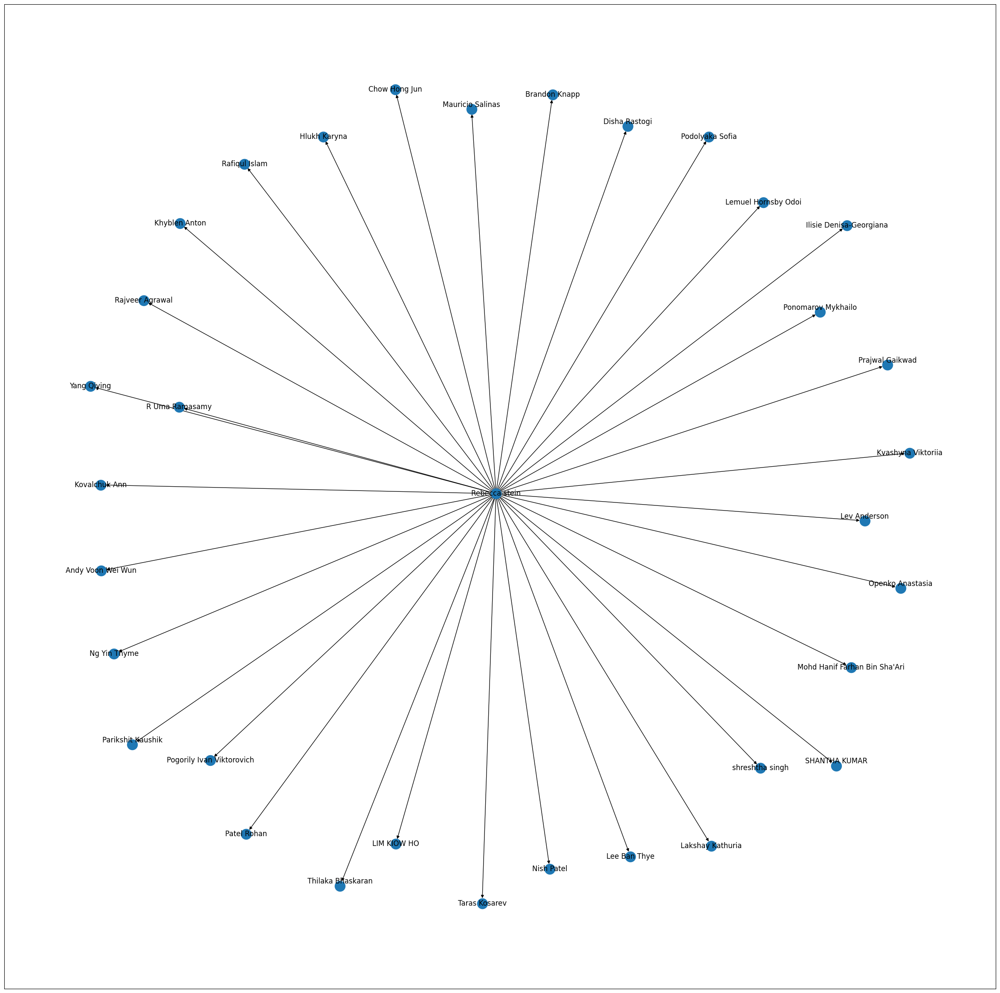

In [ ]:
#nx.draw_networkx(G2)
# larger figure size
plt.figure(3,figsize=(30,30))

nx.draw_networkx(G7)
plt.show()

In [ ]:
G7.out_degree

OutDegreeView({'Rebecca stein': 33, 'Lev Anderson\n': 0, 'Rajveer Agrawal': 0, 'Patel Rohan': 0, 'Prajwal Gaikwad\n': 0, 'Brandon Knapp': 0, 'Thilaka Bhaskaran\n': 0, 'Lemuel Hornsby Odoi': 0, 'Podolyaka Sofia': 0, 'shreshtha singh': 0, 'Lakshay Kathuria': 0, 'Khyblen Anton': 0, 'Andy Voon Wei Wun': 0, 'Rafiqul Islam': 0, 'LIM KIOW HO': 0, 'Mauricio Salinas\n': 0, 'Parikshit Kaushik\n': 0, 'Lee Ban Thye': 0, 'Disha Rastogi\n': 0, 'Ng Yin Thyme': 0, 'Taras Kosarev': 0, 'Chow Hong Jun': 0, 'Pogorily Ivan Viktorovich': 0, 'Nish Patel': 0, "Mohd Hanif Farhan Bin Sha'Ari": 0, 'R Uma Ramasamy': 0, 'Ponomarov Mykhailo\n': 0, 'Kvashyna Viktoriia': 0, 'Hlukh Karyna': 0, 'Openko Anastasia\n': 0, 'SHANTHA KUMAR\n': 0, 'Yang Qiying': 0, 'Ilisie Denisa-Georgiana': 0, '\nKovalchuk Ann\n': 0})

In [ ]:
G7sub = G7.edge_subgraph([(e[0],e[1]) for e in G7.edges(data=True)])
G7sub

(array([33.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.]),
 array([ 1. ,  4.2,  7.4, 10.6, 13.8, 17. , 20.2, 23.4, 26.6, 29.8, 33. ]),
 <BarContainer object of 10 artists>)

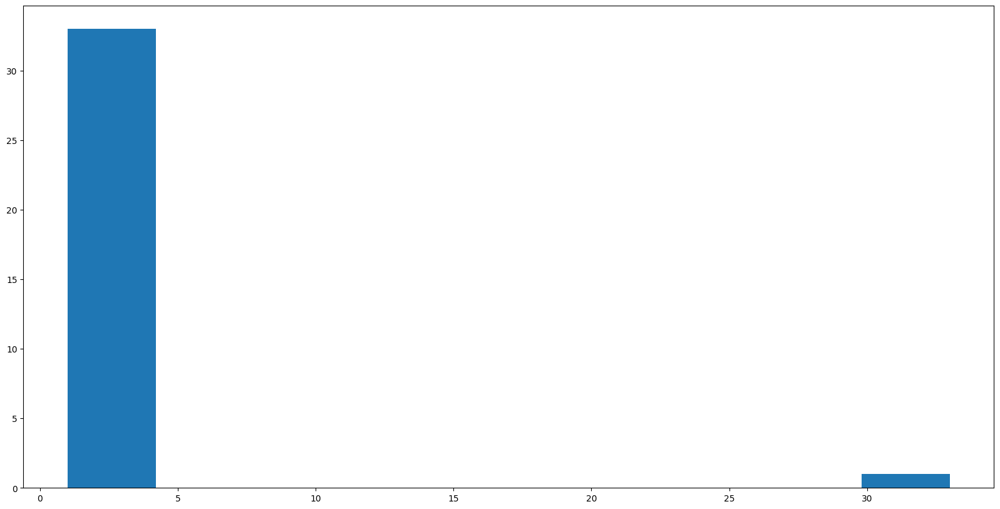

In [ ]:
plt.hist(dict(G7sub.degree()).values())

In [ ]:

import nltk
nltk.download('stopwords')

from wordcloud import WordCloud


# Generate word cloud
def generate_word_cloud(Text):
    wordcloud = WordCloud(
        background_color='white',
        width = 1000,
        height = 500).generate(str(Text))
    fig = plt.figure(
        figsize = (10, 6),
        facecolor = 'k',
        edgecolor = 'k')
    plt.imshow(wordcloud, interpolation = 'bilinear')
    plt.axis('off')
    plt.tight_layout(pad=0)
    plt.show()

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [ ]:
df7

,Thread,Post_user,Post_replies_ID,Forum_Sentiment
0,1,Rebecca stein,Lev Anderson\n,Optional
1,1,Rebecca stein,Rajveer Agrawal,The four goods that I will use to illustrate d...
2,1,Rebecca stein,Patel Rohan,Elasticity of demand refers to the degree to w...
3,1,Rebecca stein,Prajwal Gaikwad\n,"clothes, phones, watches, wine"
4,1,Rebecca stein,Brandon Knapp,"Elastic demand include food, clothing, collect..."
5,1,Rebecca stein,Thilaka Bhaskaran\n,optional
6,1,Rebecca stein,Lemuel Hornsby Odoi,"Bread, sugar, milk, soda"
7,1,Rebecca stein,Podolyaka Sofia,"I can think of, ordered according to decreasin..."
8,1,Rebecca stein,shreshtha singh,One possible order of goods in decreasing orde...
9,1,Rebecca stein,Lakshay Kathuria,Goods that are considered essential have a low...


In [ ]:
# check null values again before dropping them
df7.isnull().sum()

Thread             0
Post_user          0
Post_replies_ID    0
Forum_Sentiment    1
dtype: int64

In [ ]:
# Null values are dropped
df7.dropna(inplace=True)
df7.isnull().sum()

Thread             0
Post_user          0
Post_replies_ID    0
Forum_Sentiment    0
dtype: int64

In [ ]:
'''function to clean the text and remove all the unnecessary elements.'''
import re
import string

def clean_text(series):
    # Convert the series to lowercase
    series = series.str.lower()

    # Remove leading and trailing whitespaces
    series = series.str.strip()

    # Remove square brackets and their contents
    series = series.str.replace(r'\[\s*\w*\s*\]', '', regex=True)

    # Remove punctuation
    series = series.str.translate(str.maketrans('', '', string.punctuation))

    # Remove words with digits
    series = series.str.replace(r'\S*\d\S*', '', regex=True)

    return series

In [ ]:
#Calling the function to clean the dataset

#df6 = df6.values.tolist()
df7= pd.DataFrame(df7)

df7['partially_cleaned_text'] = clean_text(df7['Forum_Sentiment'])

In [ ]:
df7

,Thread,Post_user,Post_replies_ID,Forum_Sentiment,partially_cleaned_text
0,1,Rebecca stein,Lev Anderson\n,Optional,optional
1,1,Rebecca stein,Rajveer Agrawal,The four goods that I will use to illustrate d...,the four goods that i will use to illustrate d...
2,1,Rebecca stein,Patel Rohan,Elasticity of demand refers to the degree to w...,elasticity of demand refers to the degree to w...
3,1,Rebecca stein,Prajwal Gaikwad\n,"clothes, phones, watches, wine",clothes phones watches wine
4,1,Rebecca stein,Brandon Knapp,"Elastic demand include food, clothing, collect...",elastic demand include food clothing collectib...
5,1,Rebecca stein,Thilaka Bhaskaran\n,optional,optional
6,1,Rebecca stein,Lemuel Hornsby Odoi,"Bread, sugar, milk, soda",bread sugar milk soda
7,1,Rebecca stein,Podolyaka Sofia,"I can think of, ordered according to decreasin...",i can think of ordered according to decreasing...
8,1,Rebecca stein,shreshtha singh,One possible order of goods in decreasing orde...,one possible order of goods in decreasing orde...
9,1,Rebecca stein,Lakshay Kathuria,Goods that are considered essential have a low...,goods that are considered essential have a low...


In [ ]:
# This is a helper function to map NTLK position tags
def get_wordnet_pos(tag):
    if tag.startswith('J'):
        return wordnet.ADJ
    elif tag.startswith('V'):
        return wordnet.VERB
    elif tag.startswith('N'):
        return wordnet.NOUN
    elif tag.startswith('R'):
        return wordnet.ADV
    else:
        return wordnet.NOUN

In [ ]:
stop_words = set(stopwords.words('english'))

def remove_stopword(text):
    words = [word for word in text.split() if word.isalpha() and word not in stop_words]
    return " ".join(words)

In [ ]:
def lemma_text(text):
    # Assuming text is a string
    words = text.split()
    # Exclude single-letter words
    words = [word for word in words if len(word) > 3]
    # Lemmatize each word
    lemmatizer = WordNetLemmatizer()
    words = [lemmatizer.lemmatize(word) for word in words]
    # Join the words back into a string
    return ' '.join(words)

In [ ]:
# Assuming 'partially_clean_text' is the column you want to process
df7['fully_cleaned_text'] = df7['partially_cleaned_text'].apply(lemma_text)

In [ ]:
df7

,Thread,Post_user,Post_replies_ID,Forum_Sentiment,partially_cleaned_text,fully_cleaned_text
0,1,Rebecca stein,Lev Anderson\n,Optional,optional,optional
1,1,Rebecca stein,Rajveer Agrawal,The four goods that I will use to illustrate d...,the four goods that i will use to illustrate d...,four good use illustrate decreasing elasticity...
2,1,Rebecca stein,Patel Rohan,Elasticity of demand refers to the degree to w...,elasticity of demand refers to the degree to w...,elasticity demand refers degree quantity deman...
3,1,Rebecca stein,Prajwal Gaikwad\n,"clothes, phones, watches, wine",clothes phones watches wine,clothes phone watch wine
4,1,Rebecca stein,Brandon Knapp,"Elastic demand include food, clothing, collect...",elastic demand include food clothing collectib...,elastic demand include food clothing collectib...
5,1,Rebecca stein,Thilaka Bhaskaran\n,optional,optional,optional
6,1,Rebecca stein,Lemuel Hornsby Odoi,"Bread, sugar, milk, soda",bread sugar milk soda,bread sugar milk soda
7,1,Rebecca stein,Podolyaka Sofia,"I can think of, ordered according to decreasin...",i can think of ordered according to decreasing...,think order accord decrease elasticity luxury ...
8,1,Rebecca stein,shreshtha singh,One possible order of goods in decreasing orde...,one possible order of goods in decreasing orde...,one possible order good decrease order elastic...
9,1,Rebecca stein,Lakshay Kathuria,Goods that are considered essential have a low...,goods that are considered essential have a low...,good consider essential low elasticity demand ...


In [ ]:
score_vec7=df7['fully_cleaned_text']

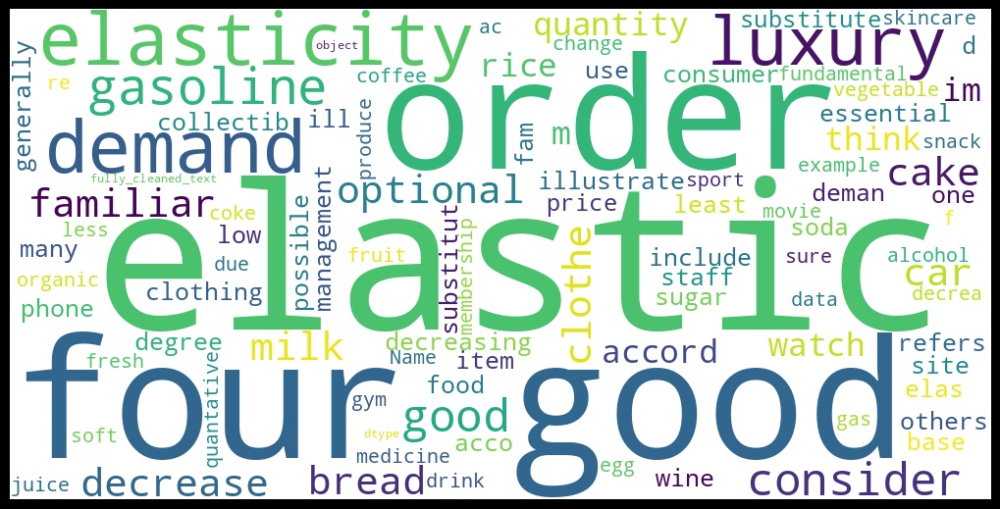

In [ ]:
generate_word_cloud(score_vec7)

In [ ]:
getMostCommonWords(df7['fully_cleaned_text'],10)

[('demand', 119),
 ('price', 100),
 ('consumer', 61),
 ('good', 55),
 ('elastic', 54),
 ('change', 50),
 ('luxury', 44),
 ('gasoline', 42),
 ('order', 39),
 ('elasticity', 38)]

[('demand', 119),
 ('price', 100),
 ('consumer', 61),
 ('good', 55),
 ('elastic', 54),
 ('change', 50),
 ('luxury', 44),
 ('gasoline', 42),
 ('order', 39),
 ('elasticity', 38)]

In [ ]:
#Print the top 10 words in the bigram frequency
common_words = get_top_n_ngram(df7['fully_cleaned_text'], 2, 10)
pd.DataFrame(common_words)

--1 [[1 1 1 ... 1 1 1]]


,0,1
0,elastic demand,30
1,change price,21
2,elasticity demand,20
3,quantity demand,20
4,price change,17
5,luxury car,17
6,demand good,16
7,confirm refute,16
8,increase consumer,14
9,movie ticket,13


In [ ]:
from google.colab import files
uploaded=files.upload()

Saving Model the Supply & Demand of a Good or Service - October 30, 2023.csv to Model the Supply & Demand of a Good or Service - October 30, 2023 (2).csv


In [ ]:
df8=pd.read_csv("Model the Supply & Demand of a Good or Service - October 30, 2023 (2).csv",encoding= 'unicode_escape')

In [ ]:
df8

,Thread,Post_user,Post_replies_ID,Text,Included or Excluded from Analysis?,Interaction Type,Interaction Category,Relationship Type
0,1,Rebecca stein,NaN,Is there a good or service that you are famili...,Included,Response,Response to Construct Knowledge,Instructor-> Community
1,2,Rebecca stein,Mason Gao\n,h,Excluded,Response,Unclear Response,Learner->Instructor
2,3,Rebecca stein,Yong Jing Yin,"In Malaysia, the current equilibrium price for...",Included,Response,Response to Construct Knowledge,Instructor->Learner
3,4,Rebecca stein,AARYAN AGRAHARI,"Certainly, let's consider a familiar good like...",Included,Response,Response to Construct Knowledge,Instructor->Learner
4,5,Rebecca stein,Ramyashree Lokesh,no,Excluded,Response,Unclear Response,Learner->Instructor
...,...,...,...,...,...,...,...,...
58,59,Rebecca stein,SEYA RAJESH KENKRE,thanks,Included,Response,Acknowledgement,Learner->Instructor
59,60,Rebecca stein,Kurnool Aiman rahim,Oppositional,Excluded,Response,Unclear Response,Unclear
60,61,Rebecca stein,Mai Anh,Service: Art commissions\nThe current equilibr...,Included,Response,Response to Construct Knowledge,Instructor-> Community
61,62,Rebecca stein,juan gutierrezloria,microchips will become more expensive if taiwa...,Included,Response\n\n,Response to Construct Knowledge,Instructor-> Community


In [ ]:
import networkx as nx

G8 = nx.from_pandas_edgelist(df8,
                            source='Post_user',
                            target='Post_replies_ID',

                            create_using=nx.DiGraph())

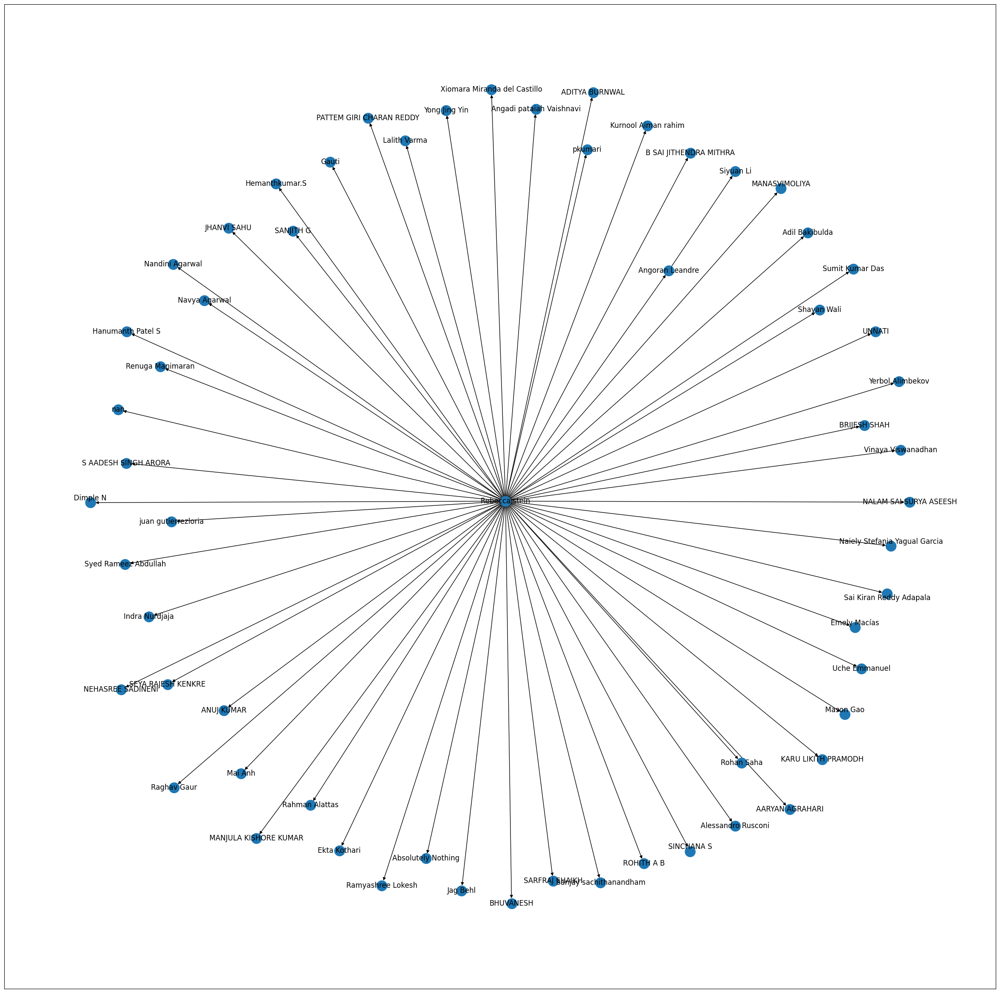

In [ ]:
#nx.draw_networkx(G8)
# larger figure size
plt.figure(3,figsize=(30,30))

nx.draw_networkx(G8)
plt.show()

In [ ]:
G8.out_degree

OutDegreeView({'Rebecca stein': 56, nan: 0, 'Mason Gao\n': 0, 'Yong Jing Yin': 0, 'AARYAN AGRAHARI': 0, 'Ramyashree Lokesh': 0, 'Lalith Varma': 0, 'Yerbol Alimbekov': 1, 'KARU LIKITH PRAMODH': 1, 'Lalith Varma\n': 1, 'Sumit Kumar Das': 0, 'Rohan Saha': 0, 'Hemanthkumar.S': 0, 'Renuga Manimaran': 0, 'Rahman Alattas': 0, 'Gauti': 0, 'SARFRAJ SHAIKH': 0, 'Adil Bakibulda': 0, 'Shayan Wali': 0, 'SINCHANA S\n': 0, 'Naiely Stefania Yagual Garcia\n': 0, 'Emely Macías\n': 0, 'Nandini Agarwal': 0, 'Navya Agarwal': 0, 'NALAM SAI SURYA ASEESH': 0, 'Alessandro Rusconi': 0, 'PATTEM GIRI CHARAN REDDY': 0, 'ADITYA BURNWAL': 0, 'Angadi pataiah Vaishnavi': 0, 'MANASVIMOLIYA\n': 0, 'BHUVANESH': 0, 'Sanjay sachithanandham': 0, 'ROHITH A B': 0, 'Uche Emmanuel': 0, 'JHANVI SAHU': 0, '\nSai Kiran Reddy Adapala': 0, 'NEHASREE SADINENI': 0, 'Indra Nurdjaja': 0, 'BRIJESH SHAH': 0, 'MANJULA KISHORE KUMAR': 0, 'Vinaya Viswanadhan': 0, 'SANJITH G': 0, 'UNNATI': 0, '\nAbsolutely Nothing\n': 0, 'Dimple N\n': 0, 'Han

In [ ]:
G8sub = G8.edge_subgraph([(e[0],e[1]) for e in G8.edges(data=True)])
G8sub

(array([59.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.]),
 array([ 1. ,  6.7, 12.4, 18.1, 23.8, 29.5, 35.2, 40.9, 46.6, 52.3, 58. ]),
 <BarContainer object of 10 artists>)

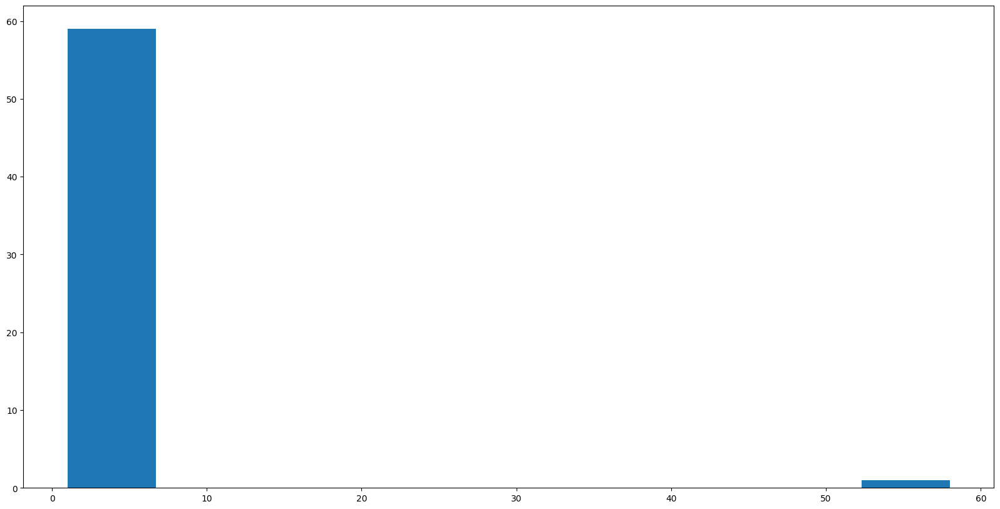

In [ ]:
plt.hist(dict(G8sub.degree()).values())

In [ ]:
# check null values again before dropping them
df8.isnull().sum()

Thread                                 0
Post_user                              0
Post_replies_ID                        1
Text                                   0
Included or Excluded from Analysis?    0
Interaction Type                       0
Interaction Category                   0
Relationship Type                      0
dtype: int64

In [ ]:
'''function to clean the text and remove all the unnecessary elements.'''
import re
import string

def clean_text(series):
    # Convert the series to lowercase
    series = series.str.lower()

    # Remove leading and trailing whitespaces
    series = series.str.strip()

    # Remove square brackets and their contents
    series = series.str.replace(r'\[\s*\w*\s*\]', '', regex=True)

    # Remove punctuation
    series = series.str.translate(str.maketrans('', '', string.punctuation))

    # Remove words with digits
    series = series.str.replace(r'\S*\d\S*', '', regex=True)

    return series

In [ ]:
#Calling the function to clean the dataset

#df6 = df6.values.tolist()
df8= pd.DataFrame(df8)

df8['partially_cleaned_text'] = clean_text(df8['Text'])

In [ ]:
df8

,Thread,Post_user,Post_replies_ID,Text,Included or Excluded from Analysis?,Interaction Type,Interaction Category,Relationship Type,partially_cleaned_text
0,1,Rebecca stein,NaN,Is there a good or service that you are famili...,Included,Response,Response to Construct Knowledge,Instructor-> Community,is there a good or service that you are famili...
1,2,Rebecca stein,Mason Gao\n,h,Excluded,Response,Unclear Response,Learner->Instructor,h
2,3,Rebecca stein,Yong Jing Yin,"In Malaysia, the current equilibrium price for...",Included,Response,Response to Construct Knowledge,Instructor->Learner,in malaysia the current equilibrium price for ...
3,4,Rebecca stein,AARYAN AGRAHARI,"Certainly, let's consider a familiar good like...",Included,Response,Response to Construct Knowledge,Instructor->Learner,certainly lets consider a familiar good like c...
4,5,Rebecca stein,Ramyashree Lokesh,no,Excluded,Response,Unclear Response,Learner->Instructor,no
...,...,...,...,...,...,...,...,...,...
58,59,Rebecca stein,SEYA RAJESH KENKRE,thanks,Included,Response,Acknowledgement,Learner->Instructor,thanks
59,60,Rebecca stein,Kurnool Aiman rahim,Oppositional,Excluded,Response,Unclear Response,Unclear,oppositional
60,61,Rebecca stein,Mai Anh,Service: Art commissions\nThe current equilibr...,Included,Response,Response to Construct Knowledge,Instructor-> Community,service art commissions\nthe current equilibri...
61,62,Rebecca stein,juan gutierrezloria,microchips will become more expensive if taiwa...,Included,Response\n\n,Response to Construct Knowledge,Instructor-> Community,microchips will become more expensive if taiwa...


In [ ]:
# Assuming 'partially_clean_text' is the column you want to process
df8['fully_cleaned_text'] = df8['partially_cleaned_text'].apply(lemma_text)

In [ ]:
score_vec8=df8['fully_cleaned_text']

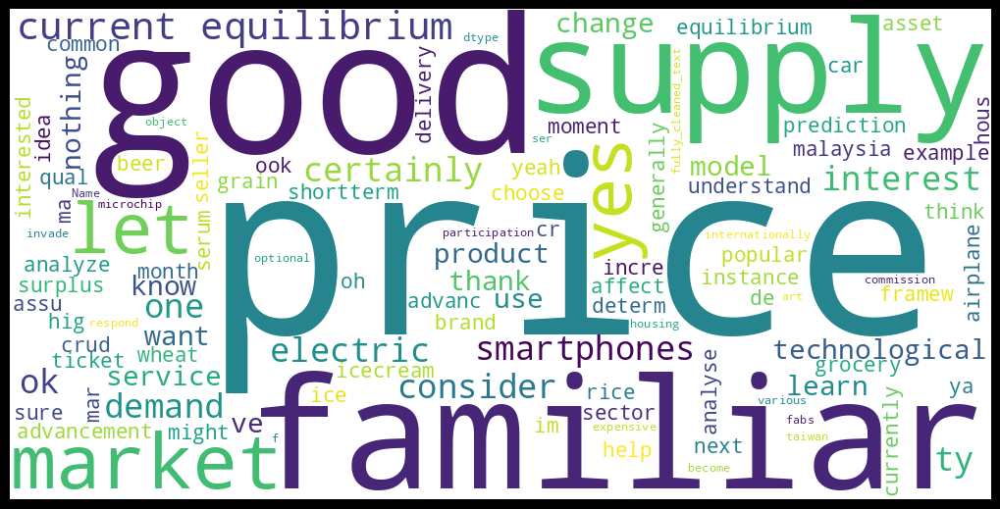

In [ ]:
generate_word_cloud(score_vec8)

In [ ]:
getMostCommonWords(df8['fully_cleaned_text'],10)

NameError: name 'getMostCommonWords' is not defined

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
import pandas as pd
import matplotlib.pyplot as plt
import nltk
from nltk.corpus import stopwords

nltk.download("stopwords")

def Gram_Analysis(Corpus, Gram, N, Stopwords):
    # Vectorizer
    Vectorizer = CountVectorizer(stop_words=list(Stopwords), ngram_range=(Gram, Gram))

    # N-Grams Matrix
    ngrams = Vectorizer.fit_transform(Corpus)

    # N-Grams Frequency
    Count = ngrams.sum(axis=0)

    # List of Words
    words = [(word, Count[0, idx]) for word, idx in Vectorizer.vocabulary_.items()]

    # Remove repetitive words within each trigram
    unique_words = set()
    filtered_words = []
    for word, count in words:
        trigram_words = word.split()
        if all(w not in unique_words for w in trigram_words):
            filtered_words.append((word, count))
            unique_words.update(trigram_words)

    # Sort Descending With Key = Count
    filtered_words = sorted(filtered_words, key=lambda x: x[1], reverse=True)

    return filtered_words[:N]


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [ ]:
# Example usage
Stopwords = set(stopwords.words("english")) - set(["not"])
words = Gram_Analysis(df8["fully_cleaned_text"], 1, 10, Stopwords)

# Visualization
Trigram = pd.DataFrame(words, columns=["Words", "Counts"])
Trigram.groupby("Words").sum()["Counts"].sort_values().plot(
    kind="barh", color="green", figsize=(10, 5)
)
plt.title(
    "Bigram Of Common Words",
    loc="center",
    fontsize=15,
    color="blue",
    pad=25,
)
plt.xlabel("Total Counts", color="magenta", fontsize=10, labelpad=15)
plt.xticks(rotation=0)
plt.ylabel("Top Words", color="cyan", fontsize=10, labelpad=15)
plt.show()


NameError: name 'df8' is not defined

In [ ]:
#Print the top 10 words in the bigram frequency
common_words8_2 = get_top_n_ngram(df8['fully_cleaned_text'], 2, 10)
pd.DataFrame(common_words8_2)

NameError: name 'get_top_n_ngram' is not defined

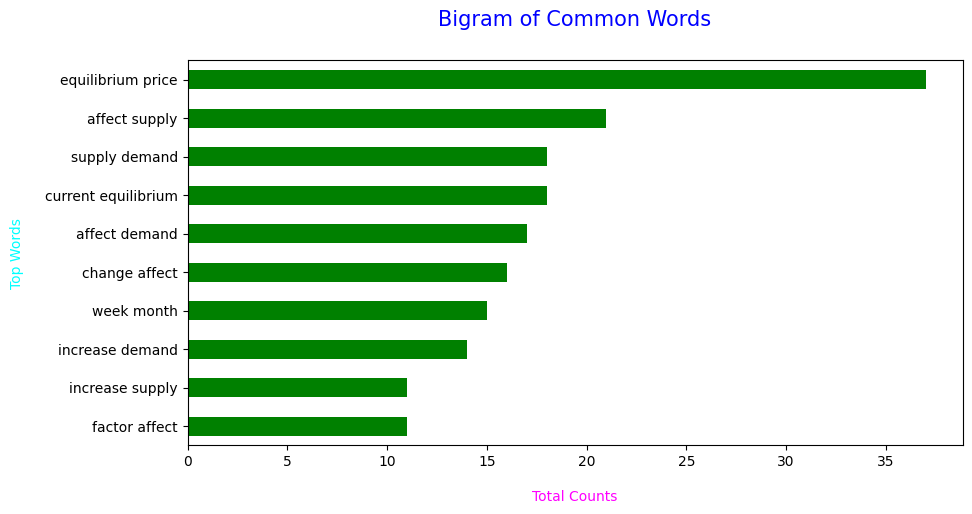

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

# Assuming common_words is a list of tuples, convert it to a DataFrame
common_words_df = pd.DataFrame(common_words8_2, columns=['Words', 'Counts'])

# Now you can use groupby on the DataFrame
common_words_df.groupby("Words").sum()["Counts"].sort_values().plot(
    kind="barh", color="green", figsize=(10, 5)
)
plt.title("Bigram of Common Words", loc="center", fontsize=15, color="blue", pad=25)
plt.xlabel("Total Counts", color="magenta", fontsize=10, labelpad=15)
plt.xticks(rotation=0)
plt.ylabel("Top Words", color="cyan", fontsize=10, labelpad=15)
plt.show()


In [ ]:
#Print the top 10 words in the bigram frequency
common_words8_3 = get_top_n_ngram(df8['fully_cleaned_text'], 3, 10)
pd.DataFrame(common_words8_3)

NameError: name 'get_top_n_ngram' is not defined

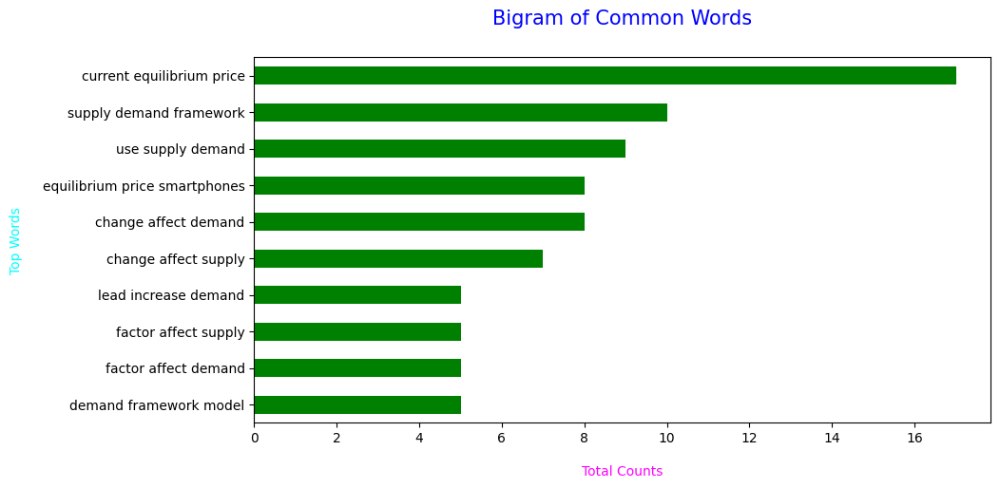

In [ ]:
# Assuming common_words is a list of tuples, convert it to a DataFrame
common_words_df = pd.DataFrame(common_words8_3, columns=['Words', 'Counts'])

# Now you can use groupby on the DataFrame
common_words_df.groupby("Words").sum()["Counts"].sort_values().plot(
    kind="barh", color="green", figsize=(10, 5)
)
plt.title("Bigram of Common Words", loc="center", fontsize=15, color="blue", pad=25)
plt.xlabel("Total Counts", color="magenta", fontsize=10, labelpad=15)
plt.xticks(rotation=0)
plt.ylabel("Top Words", color="cyan", fontsize=10, labelpad=15)
plt.show()

In [ ]:
#Print the top 10 words in the bigram frequency
common_words8_4 = get_top_n_ngram(df8['fully_cleaned_text'], 4, 10)
pd.DataFrame(common_words8_4)

--1 [[1 1 1 ... 1 1 1]]


,0,1
0,use supply demand framework,9
1,supply demand framework model,5
2,demand framework model market,4
3,framework model market current,4
4,market current equilibrium price,4
5,determine intersection supply demand,4
6,result high equilibrium price,4
7,good service familiar want,3
8,service familiar want learn,3
9,familiar want learn use,3


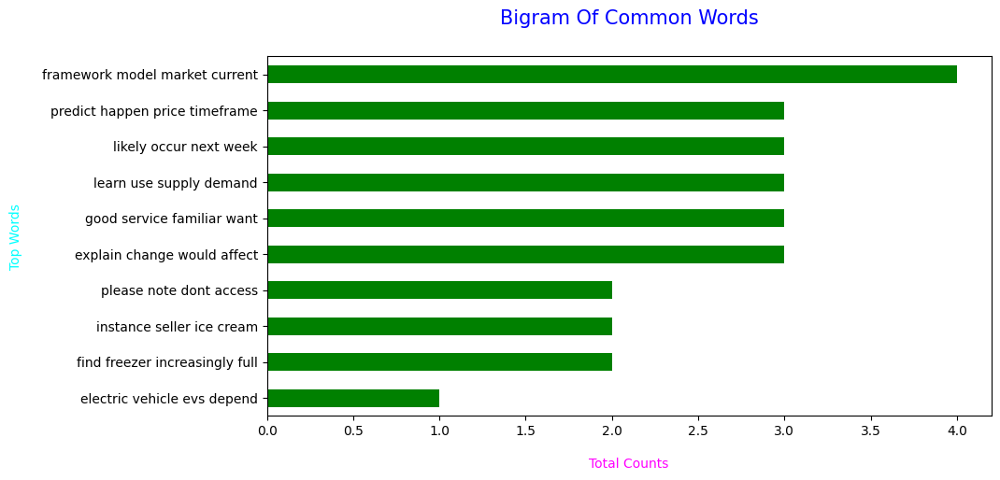

In [ ]:
# Example usage
Stopwords = set(stopwords.words("english")) - set(["not"])
words = Gram_Analysis(df8["fully_cleaned_text"], 4, 10, Stopwords)

# Visualization
Trigram = pd.DataFrame(words, columns=["Words", "Counts"])
Trigram.groupby("Words").sum()["Counts"].sort_values().plot(
    kind="barh", color="green", figsize=(10, 5)
)
plt.title(
    "Bigram Of Common Words",
    loc="center",
    fontsize=15,
    color="blue",
    pad=25,
)
plt.xlabel("Total Counts", color="magenta", fontsize=10, labelpad=15)
plt.xticks(rotation=0)
plt.ylabel("Top Words", color="cyan", fontsize=10, labelpad=15)
plt.show()

In [ ]:
#Print the top 10 words in the bigram frequency
common_words8_5 = get_top_n_ngram(df8['fully_cleaned_text'], 5, 10)
pd.DataFrame(common_words8_5)

--1 [[1 1 1 ... 1 1 1]]


,0,1
0,use supply demand framework model,5
1,supply demand framework model market,4
2,demand framework model market current,4
3,good service familiar want learn,3
4,service familiar want learn use,3
5,familiar want learn use supply,3
6,want learn use supply demand,3
7,learn use supply demand framework,3
8,framework model market current equilibrium,3
9,model market current equilibrium price,3


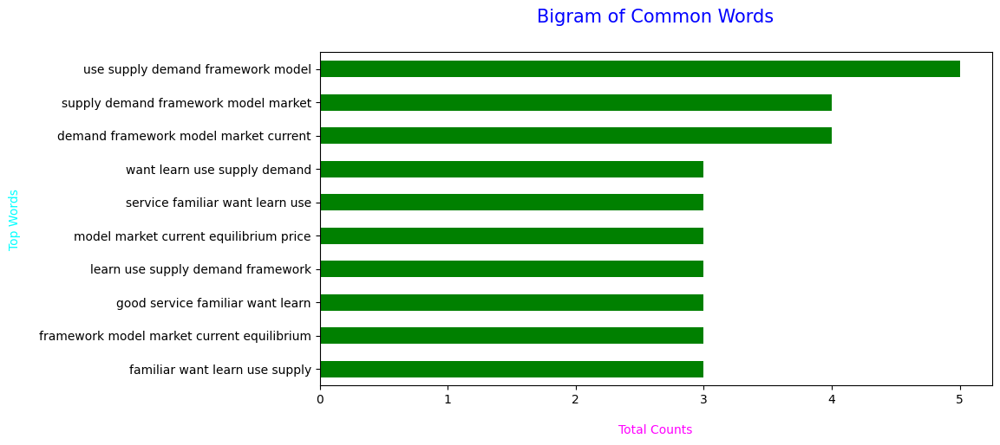

In [ ]:
# Assuming common_words is a list of tuples, convert it to a DataFrame
common_words_df = pd.DataFrame(common_words8_5, columns=['Words', 'Counts'])

# Now you can use groupby on the DataFrame
common_words_df.groupby("Words").sum()["Counts"].sort_values().plot(
    kind="barh", color="green", figsize=(10, 5)
)
plt.title("Bigram of Common Words", loc="center", fontsize=15, color="blue", pad=25)
plt.xlabel("Total Counts", color="magenta", fontsize=10, labelpad=15)
plt.xticks(rotation=0)
plt.ylabel("Top Words", color="cyan", fontsize=10, labelpad=15)
plt.show()

In [ ]:
#df8 = df8[df8['Interaction Category'] != 'Unclear Response'] & df8['Interaction Category'] != Request to Construct Knowledge ]]

#df8

# List of categories to exclude
exclude_categories = ['Unclear Response', 'Request to Construct Knowledge','Share Knowledge','Unclear Request']

# Filtering the DataFrame
df8 = df8[~df8['Interaction Category'].isin(exclude_categories)]

In [ ]:
Encoder = LabelEncoder()
df8["Interaction Category"] = Encoder.fit_transform(df8["Interaction Category"])


df8["Interaction Category"].value_counts()


NameError: name 'df8' is not defined

In [ ]:
#LSTM
#Read the data

dfreviews8_LSTM=df8[['fully_cleaned_text','Interaction Category']]
dfreviews8_LSTM.head()

,fully_cleaned_text,Interaction Category
0,good service familiar want learn use supply de...,2
2,malaysia current equilibrium price electric ve...,2
3,certainly let consider familiar good like crud...,2
5,ty,0
6,ty,0


In [ ]:
from keras import mixed_precision
import warnings
warnings.filterwarnings('ignore')

policy = mixed_precision.Policy('mixed_float16')
mixed_precision.set_global_policy(policy)

In [ ]:
dfreviews8_LSTM['fully_cleaned_text'] = dfreviews8_LSTM['fully_cleaned_text'].apply(lambda x: ' '.join([word for word in x]))
train, test= train_test_split(dfreviews8_LSTM, test_size=0.5, shuffle=True,  random_state=42)
print(train.shape)
print(test.shape)

(23, 2)
(23, 2)


In [ ]:
#neutral_review = train['Interaction Category'] == 0
#neutral_reviewnum_to_oversample = (train['Interaction Category'] == 1).sum() - neutral_review.sum()
#df_neutral_oversample = train[neutral_review].sample(n=neutral_reviewnum_to_oversample, replace=True, random_state=42)


#df_train_oversample = pd.concat([train, df_neutral_oversample])
#df_train_oversample['Interaction Category'].value_counts()

df_train_oversample=train

In [ ]:
X = df_train_oversample['fully_cleaned_text']
y = df_train_oversample['Interaction Category']

from sklearn.model_selection import StratifiedKFold

stratified_kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

for train_index, val_index in stratified_kfold.split(X, y):
    X_train_lstm, X_val_lstm = X.iloc[train_index], X.iloc[val_index]
    y_train_lstm, y_val_lstm = y.iloc[train_index], y.iloc[val_index]


In [ ]:
y.value_counts()

0    8
2    6
3    5
4    3
1    1
Name: Interaction Category, dtype: int64

In [ ]:
#LSTM Model
from keras.preprocessing.text import Tokenizer
from keras.layers import LSTM, Dense, Embedding, Bidirectional


vocab_size = 10000
oov_tok = ""
tokenizer = Tokenizer(num_words=vocab_size, oov_token=oov_tok)

In [ ]:
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences

# Assuming X_train_lstm is a pandas Series containing your text data

# Tokenize the text
tokenizer = Tokenizer(num_words=vocab_size, oov_token=oov_tok)
tokenizer.fit_on_texts(X_train_lstm)

# Convert text to sequences
train_sequences = tokenizer.texts_to_sequences(X_train_lstm)

# Check for any None values in train_sequences
print(any(seq is None for seq in train_sequences))

# Check lengths of sequences in train_sequences
sequence_lengths = [len(seq) for seq in train_sequences]
print(sequence_lengths)

# Find the index of the sequence with None value
none_index = next((i for i, seq in enumerate(train_sequences) if seq is None), None)
print("Index with None value:", none_index)

# Check the content of the first sequence
print("First sequence:", train_sequences[0])

# Continue with padding if everything seems fine


NameError: name 'vocab_size' is not defined

In [ ]:
from keras.utils import pad_sequences
from keras import mixed_precision
import warnings
warnings.filterwarnings('ignore')

# Continue with padding if everything seems fine
sequence_length = 200
train_padded = pad_sequences(train_sequences, maxlen=sequence_length, padding='post', truncating='post')

In [ ]:

# pre-processing on the test data
test_sequences = tokenizer.texts_to_sequences(X_val_lstm)
test_padded = pad_sequences(test_sequences, maxlen=sequence_length, padding='post', truncating='post')


In [ ]:
import keras
from keras.preprocessing import sequence
from keras.models import Sequential
from keras import layers
from keras.optimizers import Adam
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from tqdm import tqdm_notebook as tqdm
from keras.utils import pad_sequences
from keras import mixed_precision
import warnings
warnings.filterwarnings('ignore')


CLASSES = [0,1,2,3,4,5]
model = Sequential()

# Firstly, we will add an embedding layer which will convert each word into a dense vector of embedding dimensions.
embedding_dim = 16
model.add(Embedding(vocab_size, embedding_dim, input_length=sequence_length))
lstm_out = 32

# Specify the Bidirectional() layer and the LSTM layer with a specified unit size
model.add(Bidirectional(LSTM(lstm_out)))

# Add a fully connected layer having 10 units and ‘relu’ activation
model.add(Dense(len(CLASSES), activation='relu'))

# Add an output layer having only 6 units and 'softmax' activation.
model.add(Dense(6, activation='softmax'))


In [ ]:
print(model.summary())

Model: "sequential_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_9 (Embedding)     (None, 200, 16)           160000    
                                                                 
 bidirectional_9 (Bidirecti  (None, 64)                12544     
 onal)                                                           
                                                                 
 dense_18 (Dense)            (None, 6)                 390       
                                                                 
 dense_19 (Dense)            (None, 6)                 42        
                                                                 
Total params: 172976 (675.69 KB)
Trainable params: 172976 (675.69 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
None


In [ ]:
model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

In [ ]:
# Assuming label_encoder is your LabelEncoder instance
print(label_encoder.classes_)

[0 1 2 3 4 6]


In [ ]:
print(set(y_train_lstm))

{0, 1, 2, 3, 4}


In [ ]:
history = model.fit(train_padded, y_train_lstm, epochs=10, validation_data=(test_padded, y_val_lstm), shuffle=True, batch_size = 64)

Epoch 1/10
1/1 [==============================] - 5s 5s/step - loss: 1.7930 - accuracy: 0.1579 - val_loss: 1.7900 - val_accuracy: 0.2500
Epoch 2/10
1/1 [==============================] - 1s 721ms/step - loss: 1.7881 - accuracy: 0.3684 - val_loss: 1.7891 - val_accuracy: 0.2500
Epoch 3/10
1/1 [==============================] - 1s 624ms/step - loss: 1.7842 - accuracy: 0.5263 - val_loss: 1.7881 - val_accuracy: 0.2500
Epoch 4/10
1/1 [==============================] - 1s 625ms/step - loss: 1.7812 - accuracy: 0.5263 - val_loss: 1.7881 - val_accuracy: 0.2500
Epoch 5/10
1/1 [==============================] - 1s 627ms/step - loss: 1.7783 - accuracy: 0.5789 - val_loss: 1.7871 - val_accuracy: 0.2500
Epoch 6/10
1/1 [==============================] - 1s 618ms/step - loss: 1.7744 - accuracy: 0.5263 - val_loss: 1.7871 - val_accuracy: 0.2500
Epoch 7/10
1/1 [==============================] - 1s 630ms/step - loss: 1.7715 - accuracy: 0.6316 - val_loss: 1.7881 - val_accuracy: 0.2500
Epoch 8/10
1/1 [=======

In [ ]:

# Train metrics per epoch
metrics_df = pd.DataFrame(history.history)
print(metrics_df)


       loss  accuracy  val_loss  val_accuracy
0  1.792969  0.157895  1.790039          0.25
1  1.788086  0.368421  1.789062          0.25
2  1.784180  0.526316  1.788086          0.25
3  1.781250  0.526316  1.788086          0.25
4  1.778320  0.578947  1.787109          0.25
5  1.774414  0.526316  1.787109          0.25
6  1.771484  0.631579  1.788086          0.25
7  1.766602  0.631579  1.788086          0.25
8  1.762695  0.631579  1.788086          0.50
9  1.759766  0.684211  1.788086          0.50


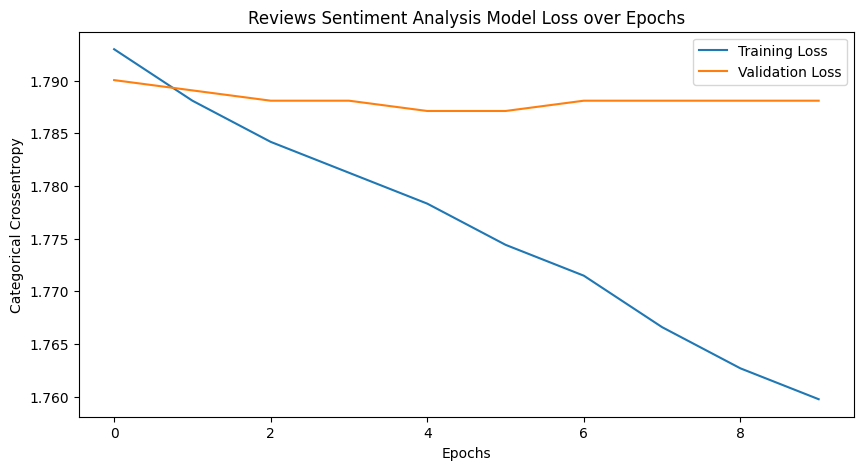

In [ ]:
# Plot loss
plt.figure(figsize=(10,5))
plt.plot(metrics_df.index, metrics_df.loss)
plt.plot(metrics_df.index, metrics_df.val_loss)
plt.title('Reviews Sentiment Analysis Model Loss over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Categorical Crossentropy')
plt.legend(['Training Loss', 'Validation Loss'])
plt.show()

<Axes: ylabel='count'>

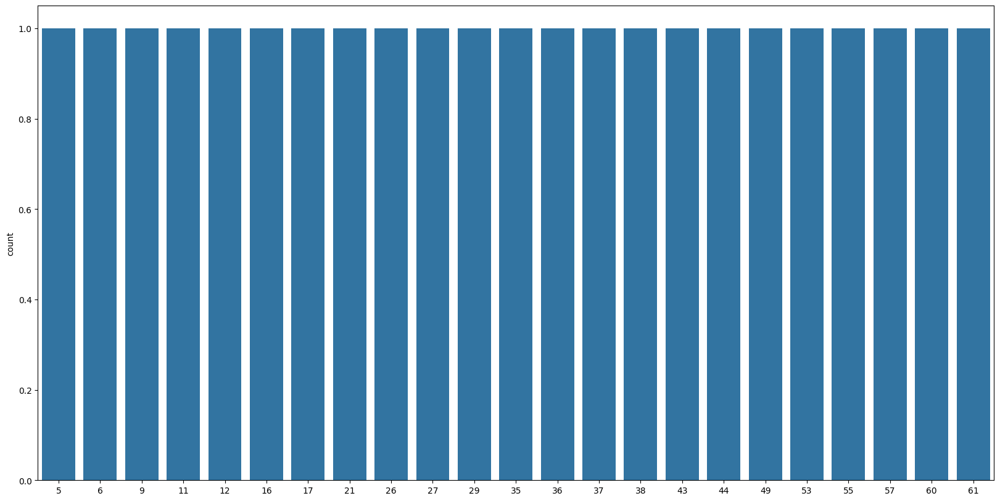

In [ ]:
# Prepare test dataset
X_test = test['fully_cleaned_text']
y_test = test['Interaction Category']


# Test data distribution for different sentiment types
sns.countplot(test['Interaction Category'])

In [ ]:
# Get predictions on test dataset
Y_pred = model.predict(test_padded, batch_size = 64)

1/1 [==============================] - 1s 1s/step


In [ ]:
y_pred

array([2, 0, 2, 0])

In [ ]:
y_test

55    4
36    3
37    2
61    2
49    0
57    1
6     0
16    0
11    4
5     0
9     0
35    4
44    0
29    1
27    0
17    0
60    2
21    2
12    4
26    4
53    0
43    0
38    1
Name: Interaction Category, dtype: int64

In [ ]:
y_test = y_test.reset_index(drop=True)

# preprocess test data
test_sequences = tokenizer.texts_to_sequences(X_test)
test_padded = pad_sequences(test_sequences, maxlen=sequence_length, padding='post', truncating='post')

# ensure shapes match
print(test_padded.shape)
print(y_test.shape)

# Now, make predictions
Y_pred = model.predict(test_padded, batch_size=64)
y_pred = np.argmax(Y_pred, axis=1)

# Continue with evaluation
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')

print('Accuracy: {:.2f}%'.format(accuracy))
print('Precision: {:.2f}%'.format(precision))
print('Recall: {:.2f}%'.format(recall))
print('F1 score: {:.2f}%'.format(f1))


(23, 200)
(23,)
1/1 [==============================] - 0s 370ms/step
Accuracy: 0.57%
Precision: 0.41%
Recall: 0.57%
F1 score: 0.48%


In [ ]:
dfResults = pd.DataFrame(columns=['Model','Accuracy', 'Precision','Recall','F1 score','Confusion matrix'])
dfResults

,Model,Accuracy,Precision,Recall,F1 score,Confusion matrix


In [ ]:
# Evaluate the model performance on test dataset
from sklearn.metrics import confusion_matrix, precision_score, accuracy_score, recall_score, f1_score, roc_auc_score ,classification_report, RocCurveDisplay

y_pred = np.argmax(Y_pred, axis=1)
accuracy = accuracy_score(y_test, y_pred)
# print('Accuracy: {:.2f}%'.format(accuracy))
precision = precision_score(y_test, y_pred,average='weighted')
print('Precision: {:.2f}%'.format(precision))
recall = recall_score(y_test, y_pred, average='weighted')
print('Recall: {:.2f}%'.format( recall))
f1 = f1_score(y_test, y_pred,average='weighted')
print('F1 score: {:.2f}%'.format( f1))
print('Accuracy: {:.2f}%'.format(accuracy))
# print(classification_report(df_test['true'], df_test['pred']))


Precision: 0.41%
Recall: 0.57%
F1 score: 0.48%
Accuracy: 0.57%


In [ ]:
# confusion matrix
matrix = confusion_matrix(y_test, y_pred)
print("Confusion metrics \n",matrix)
print('**********************************************************')
print('*****************  Classification Report  ****************')
print('**********************************************************')
print(classification_report(y_test,y_pred))


Confusion metrics 
 [[10  0  0  0  0]
 [ 2  0  0  1  0]
 [ 0  0  3  1  0]
 [ 0  0  1  0  0]
 [ 2  0  1  2  0]]
**********************************************************
*****************  Classification Report  ****************
**********************************************************
              precision    recall  f1-score   support

           0       0.71      1.00      0.83        10
           1       0.00      0.00      0.00         3
           2       0.60      0.75      0.67         4
           3       0.00      0.00      0.00         1
           4       0.00      0.00      0.00         5

    accuracy                           0.57        23
   macro avg       0.26      0.35      0.30        23
weighted avg       0.41      0.57      0.48        23



In [ ]:
# Display the records for all the calssifiers
dfResults.head()

,Model,Accuracy,Precision,Recall,F1 score,Confusion matrix


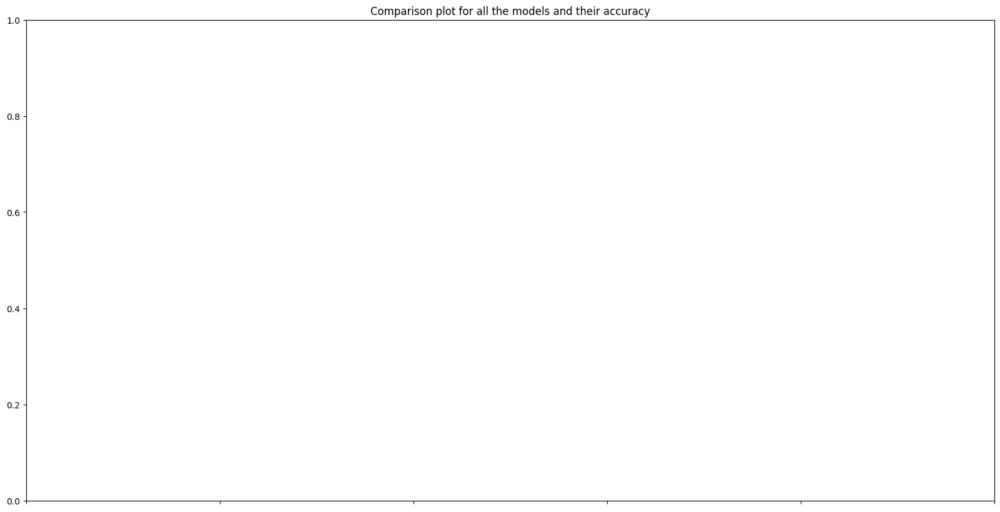

In [ ]:
# Visualize the matrics for all the models
plt.figure(figsize=(20,10))
ax= sns.barplot(x = dfResults.Model,y = dfResults.Accuracy, data=dfResults)

ax.set_xticklabels(dfResults.Model,rotation = 75)
ax.set_title('Comparison plot for all the models and their accuracy')
plt.show()

In [ ]:
from google.colab import files
uploaded=files.upload()

Saving Kiasu_Parent.csv to Kiasu_Parent.csv


In [ ]:
df9=pd.read_csv("Kiasu_Parent.csv",encoding= 'unicode_escape')

In [ ]:
df9

,Thread,Post_user,Post_replies_ID,Forum_Sentiment,Included or Excluded from Analysis?,Interaction Type,Interaction Category,Relationship Type,user_sentiment
0,Are All Primary Schools The Same?,qms,osakachan,MOE believes that all schools are the same. Pa...,Included,Response,Response to share knowledge,Learner -> Learner,Negative
1,Are All Primary Schools The Same?,tankee,osakachan,"maybe government, e.g. MP should start to send...",Included,Response,Response to share knowledge,Learner -> Learner,Negative
2,Are All Primary Schools The Same?,qms,RRMummy,do you agree on the MOE's believe?\n\nI'm doub...,Included,Request,Request to share knowledge,Learner -> Community,Negative
3,Are All Primary Schools The Same?,osakachan,tankee,"You mean they don't\n\nactually, depends on wh...",Included,Response,Response to share knowledge,Learner -> Learner,Negative
4,Are All Primary Schools The Same?,RRMummy,tankee,"Personally, I do believe that all government p...",Included,Response,Response to share knowledge,Learner -> Learner\n\n,Positive
...,...,...,...,...,...,...,...,...,...
74,Are All Primary Schools The Same?,zac's mum,slmkhoo,Glad your son (and you) have discovered what w...,Included,Response,Response to share knowledge,Learner -> Learner\n\n,Positive
75,Are All Primary Schools The Same?,bbbay,Imp75,Actually I resonate with your colleague too. I...,Included,Response,Response to share knowledge,Learner -> Learner\n\n,Positive
76,Are All Primary Schools The Same?,ChiefKiasu,Not_Kiasu,I saw an online article that many parents want...,Included,Request,Request to share knowledge,Learner -> Community,Neutral
77,Are All Primary Schools The Same?,Not_Kiasu,ChiefKiasu,This is an interesting afterthought. So it see...,Included,Request,Request to share knowledge,Learner -> Community,Neutral


In [ ]:
G9 = nx.from_pandas_edgelist(df9,
                            source='Post_user',
                            target='Post_replies_ID',

                            create_using=nx.DiGraph())

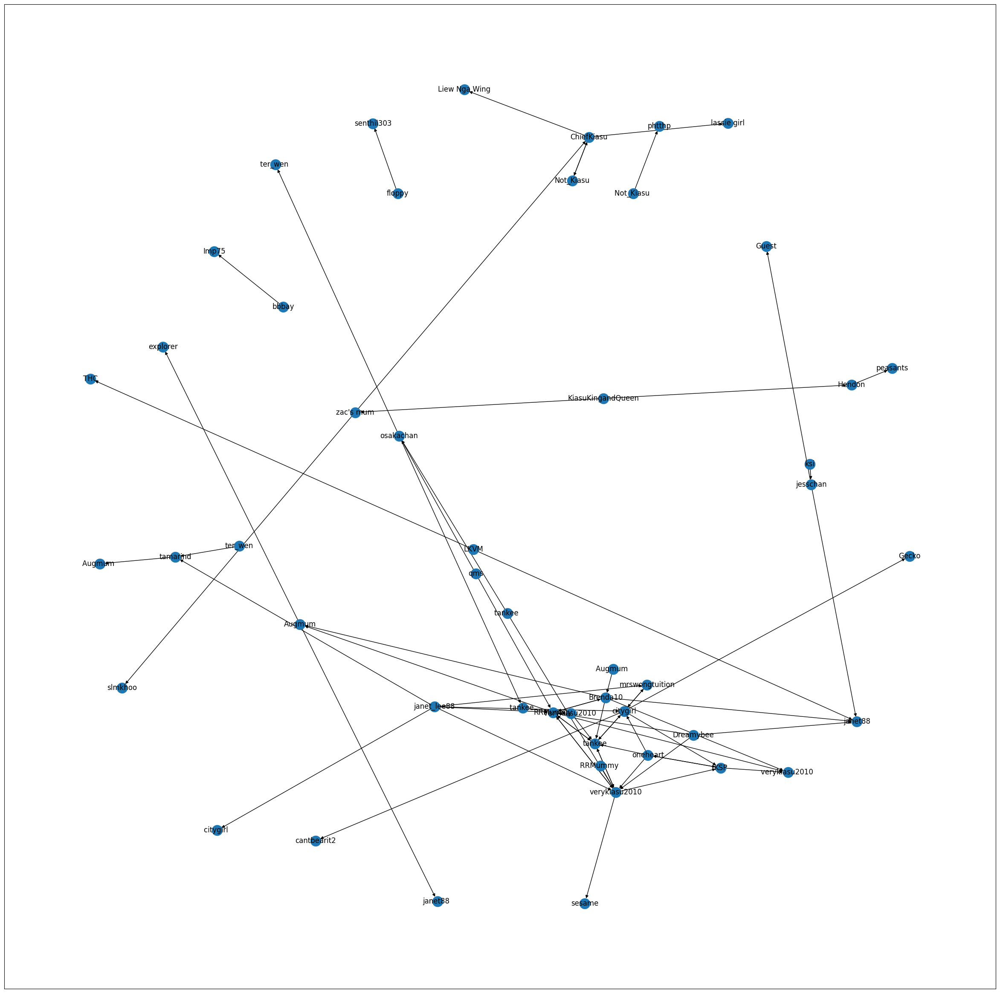

In [ ]:
#nx.draw_networkx(G9)
# larger figure size
plt.figure(3,figsize=(30,30))

nx.draw_networkx(G9)
plt.show()

In [ ]:
G9.out_degree

OutDegreeView({'qms': 2, 'osakachan': 2, 'tankee\xa0': 2, 'RRMummy': 6, 'tankee ': 1, 'tankee': 3, 'verykiasu2010': 4, 'RRMummy\xa0': 1, 'verykiasu2010\xa0': 1, 'verykiasu2010 ': 0, 'KSP': 2, 'oneheart': 4, 'Augmum': 2, 'Brenda10': 5, 'Augmum\xa0': 1, 'citygirl': 5, 'mrswongtuition': 1, 'janet_lee88': 6, 'tamarind': 1, 'Gecko': 0, 'Augmum ': 0, 'explorer': 0, 'ksi': 1, 'jesschan': 2, 'ter_wen ': 0, 'Guest': 0, 'cantbearit2': 0, 'janet88': 0, 'ter_wen': 1, 'citygirl ': 0, 'Dreamybee': 3, 'sesame': 0, 'janet88\xa0': 0, 'LKVM': 2, 'THC': 0, 'KiasuKingandQueen': 2, 'Hendon': 1, "zac's mum": 2, 'floppy': 1, 'senthil303': 0, 'peasants': 0, 'Not_Kiasu ': 1, 'phtthp': 0, 'ChiefKiasu': 3, 'lassie girl': 0, 'slmkhoo': 0, 'bbbay': 1, 'Imp75': 0, 'Not_Kiasu': 1, 'Liew Nga Wing': 0})

In [ ]:
G9sub = G9.edge_subgraph([(e[0],e[1]) for e in G9.edges(data=True)])
G9sub

(array([32.,  6.,  3.,  3.,  1.,  1.,  2.,  0.,  1.,  1.]),
 array([ 1. ,  2.2,  3.4,  4.6,  5.8,  7. ,  8.2,  9.4, 10.6, 11.8, 13. ]),
 <BarContainer object of 10 artists>)

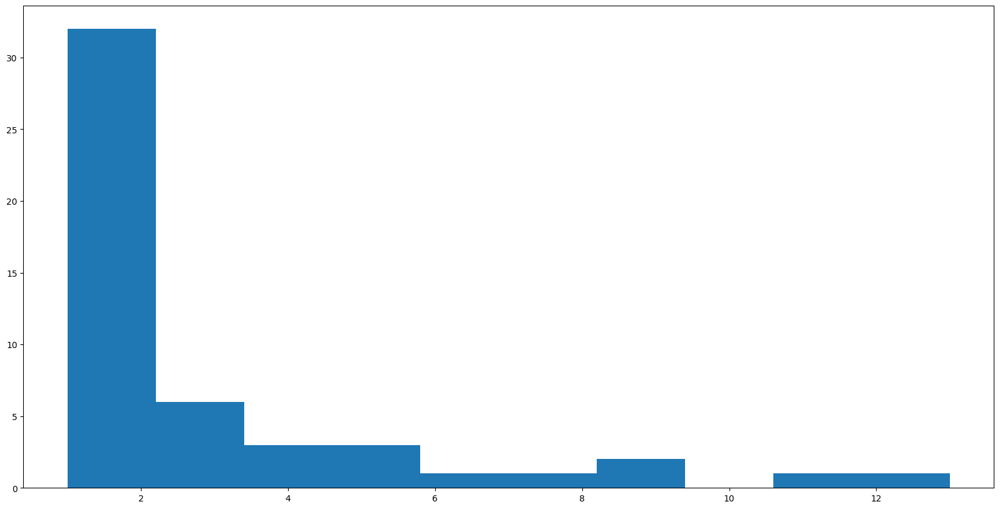

In [ ]:
plt.hist(dict(G9sub.degree()).values())

In [ ]:

import nltk
nltk.download('stopwords')

from wordcloud import WordCloud

# Generate word cloud
def generate_word_cloud(Text):
    wordcloud = WordCloud(
        background_color='white',
        width = 1000,
        height = 500).generate(str(Text))
    fig = plt.figure(
        figsize = (10, 6),
        facecolor = 'k',
        edgecolor = 'k')
    plt.imshow(wordcloud, interpolation = 'bilinear')
    plt.axis('off')
    plt.tight_layout(pad=0)
    plt.show()

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [ ]:
# check null values again before dropping them
df9.isnull().sum()


Thread                                 0
Post_user                              0
Post_replies_ID                        0
Forum_Sentiment                        0
Included or Excluded from Analysis?    0
Interaction Type                       0
Interaction Category                   0
Relationship Type                      0
user_sentiment                         0
dtype: int64

In [ ]:
'''function to clean the text and remove all the unnecessary elements.'''
import re
import string

def clean_text(series):
    # Convert the series to lowercase
    series = series.str.lower()

    # Remove leading and trailing whitespaces
    series = series.str.strip()

    # Remove square brackets and their contents
    series = series.str.replace(r'\[\s*\w*\s*\]', '', regex=True)

    # Remove punctuation
    series = series.str.translate(str.maketrans('', '', string.punctuation))

    # Remove words with digits
    series = series.str.replace(r'\S*\d\S*', '', regex=True)

    return series

In [ ]:
#Calling the function to clean the dataset

#df6 = df6.values.tolist()
df9= pd.DataFrame(df9)

df9['partially_cleaned_text'] = clean_text(df9['Forum_Sentiment'])

NameError: name 'df9' is not defined

In [ ]:
# Assuming 'partially_clean_text' is the column you want to process
df9['fully_cleaned_text'] = df9['partially_cleaned_text'].apply(lemma_text)

NameError: name 'df9' is not defined

In [ ]:
score_vec9=df9['fully_cleaned_text']

NameError: name 'df9' is not defined

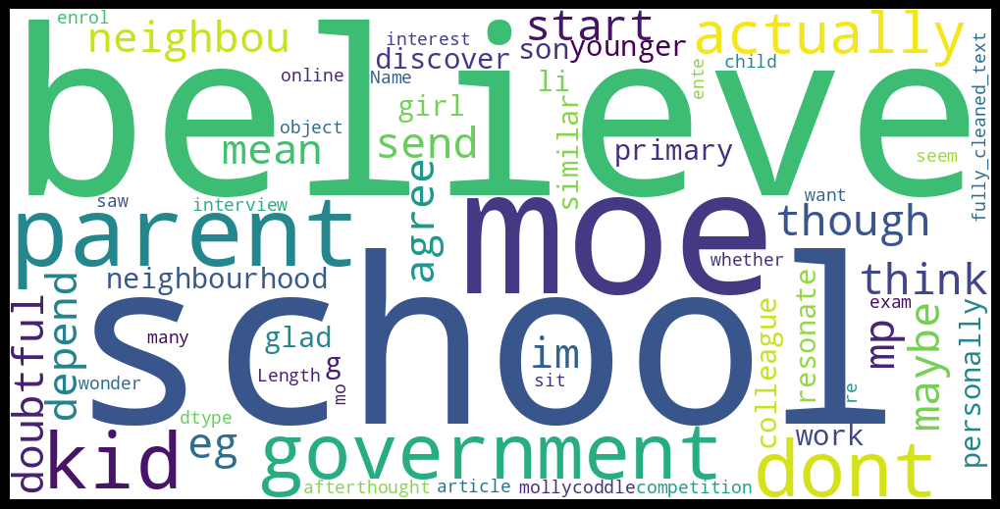

In [ ]:
generate_word_cloud(score_vec9)

In [ ]:
#Print the top 10 words generated

common_words9_1=getMostCommonWords(df9['fully_cleaned_text'],10)

common_words9_1

[('school', 112),
 ('parent', 37),
 ('kid', 37),
 ('good', 26),
 ('child', 21),
 ('teacher', 16),
 ('well', 16),
 ('also', 16),
 ('think', 15),
 ('use', 15)]

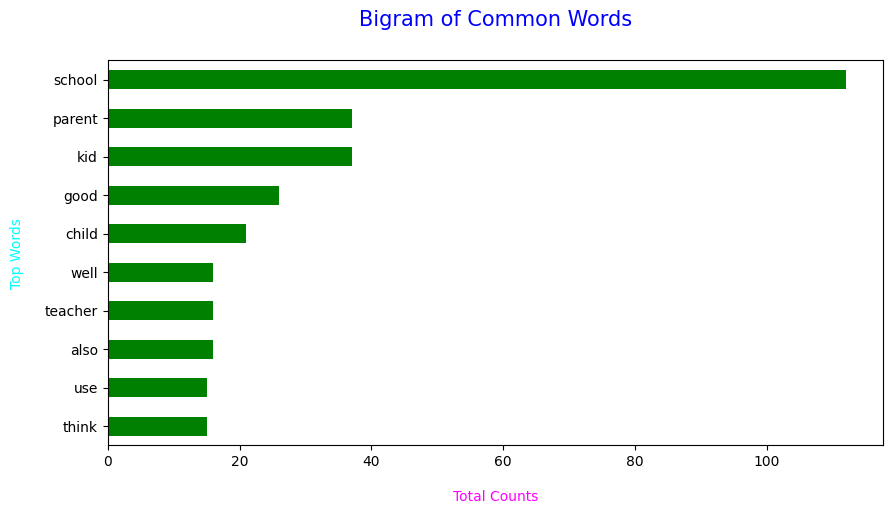

In [ ]:
# Assuming common_words is a list of tuples, convert it to a DataFrame
common_words_df = pd.DataFrame(common_words9_1, columns=['Words', 'Counts'])

# Now you can use groupby on the DataFrame
common_words_df.groupby("Words").sum()["Counts"].sort_values().plot(
    kind="barh", color="green", figsize=(10, 5)
)
plt.title("Bigram of Common Words", loc="center", fontsize=15, color="blue", pad=25)
plt.xlabel("Total Counts", color="magenta", fontsize=10, labelpad=15)
plt.xticks(rotation=0)
plt.ylabel("Top Words", color="cyan", fontsize=10, labelpad=15)
plt.show()


In [ ]:

#Print the top 10 words in the bigram frequency
common_words9_2 = get_top_n_ngram(df9['fully_cleaned_text'], 2, 10)
pd.DataFrame(common_words9_2)

--1 [[1 1 1 ... 1 1 1]]


,0,1
0,primary school,12
1,good school,10
2,neighbourhood school,8
3,text book,7
4,school use,6
5,school good,5
6,enrichment class,5
7,secondary school,5
8,brand school,4
9,school parent,3


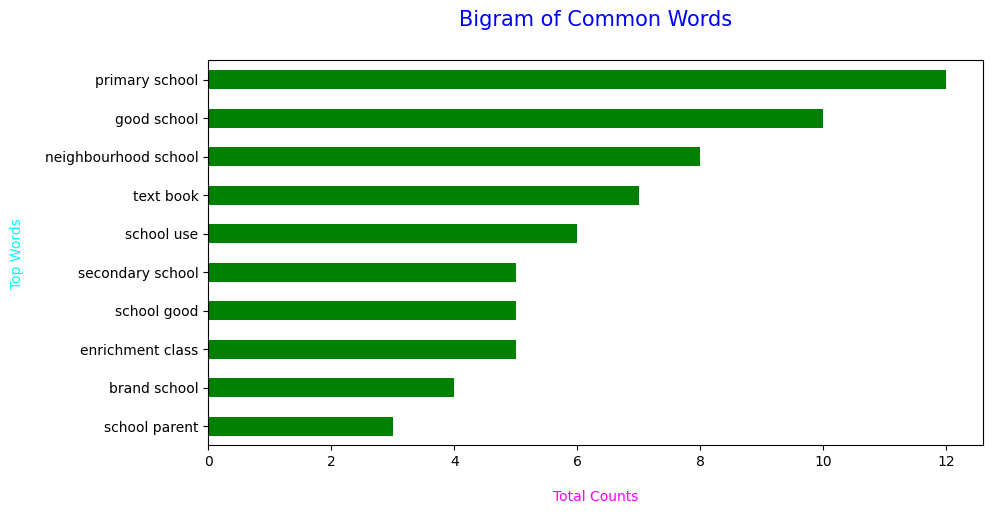

In [ ]:

import matplotlib.pyplot as plt
import pandas as pd

# Assuming common_words is a list of tuples, convert it to a DataFrame
common_words_df = pd.DataFrame(common_words9_2, columns=['Words', 'Counts'])

# Now you can use groupby on the DataFrame
common_words_df.groupby("Words").sum()["Counts"].sort_values().plot(
    kind="barh", color="green", figsize=(10, 5)
)
plt.title("Bigram of Common Words", loc="center", fontsize=15, color="blue", pad=25)
plt.xlabel("Total Counts", color="magenta", fontsize=10, labelpad=15)
plt.xticks(rotation=0)
plt.ylabel("Top Words", color="cyan", fontsize=10, labelpad=15)
plt.show()


In [ ]:

#Print the top 10 words in the bigram frequency
common_words9_3 = get_top_n_ngram(df9['fully_cleaned_text'], 3, 10)
pd.DataFrame(common_words9_3)

--1 [[1 1 1 ... 1 1 1]]


,0,1
0,school good school,3
1,cck hdb estate,2
2,school like chs,2
3,school brand school,2
4,neighbourhood school kid,2
5,school beg differ,2
6,maximum class size,2
7,parent want child,2
8,moe believe school,1
9,believe school parent,1


In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
import pandas as pd
import matplotlib.pyplot as plt
import nltk
from nltk.corpus import stopwords

nltk.download("stopwords")

def Gram_Analysis(Corpus, Gram, N, Stopwords):
    # Vectorizer
    Vectorizer = CountVectorizer(stop_words=list(Stopwords), ngram_range=(Gram, Gram))

    # N-Grams Matrix
    ngrams = Vectorizer.fit_transform(Corpus)

    # N-Grams Frequency
    Count = ngrams.sum(axis=0)

    # List of Words
    words = [(word, Count[0, idx]) for word, idx in Vectorizer.vocabulary_.items()]

    # Remove repetitive words within each trigram
    unique_words = set()
    filtered_words = []
    for word, count in words:
        trigram_words = word.split()
        if all(w not in unique_words for w in trigram_words):
            filtered_words.append((word, count))
            unique_words.update(trigram_words)

    # Sort Descending With Key = Count
    filtered_words = sorted(filtered_words, key=lambda x: x[1], reverse=True)

    return filtered_words[:N]



[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [ ]:
# Example usage
Stopwords = set(stopwords.words("english")) - set(["not"])
words = Gram_Analysis(df9["fully_cleaned_text"], 3, 10, Stopwords)

# Visualization
Trigram = pd.DataFrame(words, columns=["Words", "Counts"])
Trigram.groupby("Words").sum()["Counts"].sort_values().plot(
    kind="barh", color="green", figsize=(10, 5)
)
plt.title(
    "Bigram of Common Words",
    loc="center",
    fontsize=15,
    color="blue",
    pad=25,
)
plt.xlabel("Total Counts", color="magenta", fontsize=10, labelpad=15)
plt.xticks(rotation=0)
plt.ylabel("Top Words", color="cyan", fontsize=10, labelpad=15)
plt.show()

NameError: name 'df9' is not defined

In [ ]:

#Print the top 10 words in the bigram frequency
common_words9_6 = get_top_n_ngram(df9['fully_cleaned_text'], 6, 10)
pd.DataFrame(common_words9_6)

--1 [[1 1 1 ... 1 1 1]]


,0,1
0,maybe government mp start send kid,1
1,government mp start send kid neighbourhood,1
2,mp start send kid neighbourhood school,1
3,start send kid neighbourhood school convince,1
4,send kid neighbourhood school convince school,1
5,mean dont actually depend school neighbourhood,1
6,personally believe government primary school good,1
7,believe government primary school good school,1
8,government primary school good school follow,1
9,primary school good school follow syllabus,1


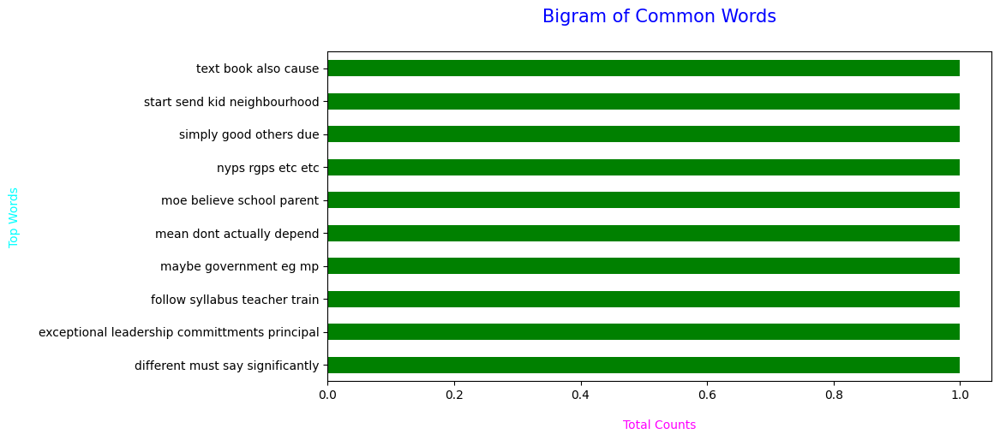

In [ ]:
# Example usage
Stopwords = set(stopwords.words("english")) - set(["not"])
words = Gram_Analysis(df9["fully_cleaned_text"], 4, 10, Stopwords)

# Visualization
Trigram = pd.DataFrame(words, columns=["Words", "Counts"])
Trigram.groupby("Words").sum()["Counts"].sort_values().plot(
    kind="barh", color="green", figsize=(10, 5)
)
plt.title(
    "Bigram of Common Words",
    loc="center",
    fontsize=15,
    color="blue",
    pad=25,
)
plt.xlabel("Total Counts", color="magenta", fontsize=10, labelpad=15)
plt.xticks(rotation=0)
plt.ylabel("Top Words", color="cyan", fontsize=10, labelpad=15)
plt.show()


In [ ]:
#Feature Enginnering
# Label Encoding
from sklearn.preprocessing import LabelEncoder

# TF-IDF Vectorizer
from sklearn.feature_extraction.text import TfidfVectorizer

# Resampling
from imblearn.over_sampling import SMOTE
from collections import Counter

# Splitting Dataset
from sklearn.model_selection import train_test_split

In [ ]:
df9 = df9.loc[(df9["Interaction Category"] != 'Acknowledgement') & (df9["Interaction Category"] !='Unclear request')]

In [ ]:
Encoder = LabelEncoder()
df9["Interaction Category"] = Encoder.fit_transform(df9["Interaction Category"])


df9["Interaction Category"].value_counts()


1    58
0    18
Name: Interaction Category, dtype: int64

In [ ]:
#Recommendation System



In [ ]:

#Read the data

dfreviews_LSTM=df9[['fully_cleaned_text','Interaction Category']]
dfreviews_LSTM.head()

,fully_cleaned_text,Interaction Category
0,moe believe school parent think though,1
1,maybe government eg mp start send kid neighbou...,1
2,agree moes believe im doubtful,0
3,mean dont actually depend school neighbourhood,1
4,personally believe government primary school g...,1


In [ ]:
from keras import mixed_precision
import warnings
warnings.filterwarnings('ignore')

policy = mixed_precision.Policy('mixed_float16')
mixed_precision.set_global_policy(policy)

In [ ]:
dfreviews_LSTM['fully_cleaned_text'] = dfreviews_LSTM['fully_cleaned_text'].apply(lambda x: ' '.join([word for word in x]))
train, test= train_test_split(dfreviews_LSTM, test_size=0.5, shuffle=True,  random_state=42)
print(train.shape)
print(test.shape)

(38, 2)
(38, 2)


In [ ]:


train['Interaction Category'].value_counts()


1    29
0     9
Name: Interaction Category, dtype: int64

In [ ]:

#neutral_review = train['Interaction Category'] == 0
#neutral_reviewnum_to_oversample = (train['Interaction Category'] == 1).sum() - neutral_review.sum()
#df_neutral_oversample = train[neutral_review].sample(n=neutral_reviewnum_to_oversample, replace=True, random_state=42)


#df_train_oversample = pd.concat([train, df_neutral_oversample])
#df_train_oversample['Interaction Category'].value_counts()

df_train_oversample=train

In [ ]:
X = df_train_oversample['fully_cleaned_text']
y = df_train_oversample['Interaction Category']

X_train_lstm, X_val_lstm, y_train_lstm, y_val_lstm = train_test_split(X,y, test_size=0.2, shuffle=True, stratify=y, random_state=42)


In [ ]:
from tensorflow.keras.preprocessing.text import Tokenizer

# Assuming 'X_train_lstm' contains your text data
#tokenizer = Tokenizer()
#tokenizer.fit_on_texts(X_train_lstm)

# Convert text to sequences of integers
#X_train_lstm = tokenizer.texts_to_sequences(X_train_lstm)





In [ ]:
#LSTM Model
from keras.preprocessing.text import Tokenizer
from keras.layers import LSTM, Dense, Embedding, Bidirectional


vocab_size = 10000
oov_tok = ""
tokenizer = Tokenizer(num_words=vocab_size, oov_token=oov_tok)

In [ ]:
#LSTM model

tokenizer.fit_on_texts(X_train_lstm)

print("Number of Documents: ", tokenizer.document_count)
print("Number of Words: ", tokenizer.num_words)


Number of Documents:  30
Number of Words:  10000


In [ ]:

train_sequences = tokenizer.texts_to_sequences(X_train_lstm)
print(train_sequences[0])

[16, 2, 6, 9, 3, 7, 4, 10, 3, 16, 8, 7, 8, 3, 7, 3, 5, 12, 2, 6, 9, 5, 12, 8, 7, 19, 3, 5, 12, 2, 6, 21, 8, 9, 2]


In [ ]:
from keras.utils import pad_sequences
from keras import mixed_precision
import warnings
warnings.filterwarnings('ignore')


sequence_length = 200
train_padded = pad_sequences(train_sequences, maxlen=sequence_length, padding='post', truncating='post')

In [ ]:
# Step 4: Resample using SMOTE
smote = SMOTE(random_state=42)
train_padded, y_train_lstm = smote.fit_resample(train_padded, y_train_lstm)

In [ ]:

# pre-processing on the test data
test_sequences = tokenizer.texts_to_sequences(X_val_lstm)
test_padded = pad_sequences(test_sequences, maxlen=sequence_length, padding='post', truncating='post')


In [ ]:

CLASSES = [0,1,2]
model = Sequential()

# Firstly, we will add an embedding layer which will convert each word into a dense vector of embedding dimensions.
embedding_dim = 16
model.add(Embedding(vocab_size, embedding_dim, input_length=sequence_length))
lstm_out = 32

# Specify the Bidirectional() layer and the LSTM layer with a specified unit size
model.add(Bidirectional(LSTM(lstm_out)))

# Add a fully connected layer having 10 units and ‘relu’ activation
model.add(Dense(len(CLASSES), activation='relu'))

# Add an output layer having only 3 units and 'softmax' activation.
model.add(Dense(3, activation='softmax'))


In [ ]:

print(model.summary())

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_3 (Embedding)     (None, 200, 16)           160000    
                                                                 
 bidirectional_3 (Bidirecti  (None, 64)                12544     
 onal)                                                           
                                                                 
 dense_6 (Dense)             (None, 3)                 195       
                                                                 
 dense_7 (Dense)             (None, 3)                 12        
                                                                 
Total params: 172751 (674.81 KB)
Trainable params: 172751 (674.81 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
None


In [ ]:
model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

In [ ]:

history = model.fit(train_padded, y_train_lstm, epochs=10, validation_data=(test_padded, y_val_lstm), shuffle=True, batch_size = 64)


Epoch 1/10
1/1 [==============================] - 9s 9s/step - loss: 1.0996 - accuracy: 0.0652 - val_loss: 1.0996 - val_accuracy: 0.2500
Epoch 2/10
1/1 [==============================] - 2s 2s/step - loss: 1.0977 - accuracy: 0.5000 - val_loss: 1.0986 - val_accuracy: 0.2500
Epoch 3/10
1/1 [==============================] - 2s 2s/step - loss: 1.0977 - accuracy: 0.5000 - val_loss: 1.0977 - val_accuracy: 0.2500
Epoch 4/10
1/1 [==============================] - 3s 3s/step - loss: 1.0967 - accuracy: 0.5000 - val_loss: 1.0967 - val_accuracy: 0.2500
Epoch 5/10
1/1 [==============================] - 2s 2s/step - loss: 1.0947 - accuracy: 0.5000 - val_loss: 1.0957 - val_accuracy: 0.2500
Epoch 6/10
1/1 [==============================] - 2s 2s/step - loss: 1.0947 - accuracy: 0.5000 - val_loss: 1.0957 - val_accuracy: 0.2500
Epoch 7/10
1/1 [==============================] - 2s 2s/step - loss: 1.0947 - accuracy: 0.5000 - val_loss: 1.0938 - val_accuracy: 0.2500
Epoch 8/10
1/1 [=========================

In [ ]:

# Train metrics per epoch
metrics_df = pd.DataFrame(history.history)
print(metrics_df)


       loss  accuracy  val_loss  val_accuracy
0  1.100586  0.478261  1.091797          0.75
1  1.096680  0.500000  1.090820          0.75
2  1.094727  0.500000  1.087891          0.75
3  1.094727  0.500000  1.085938          0.75
4  1.092773  0.500000  1.082031          0.75
5  1.091797  0.500000  1.079102          0.75
6  1.089844  0.500000  1.076172          0.75
7  1.089844  0.500000  1.072266          0.75
8  1.087891  0.500000  1.069336          0.75
9  1.085938  0.500000  1.065430          0.75


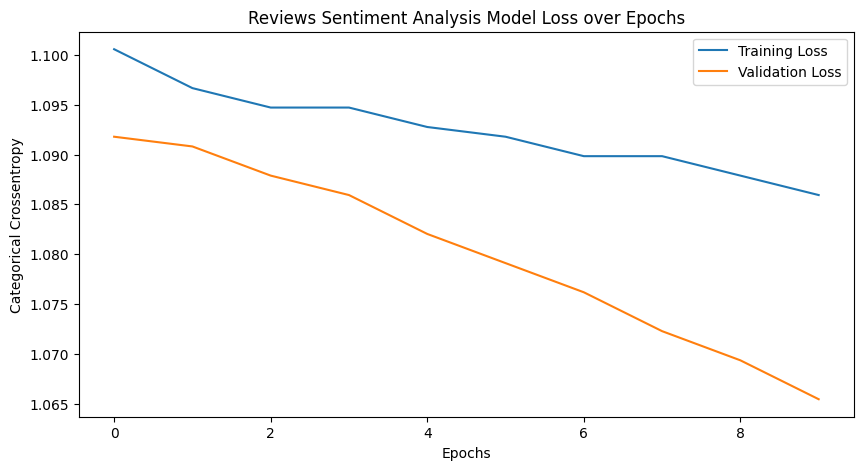

In [ ]:
# Plot loss
plt.figure(figsize=(10,5))
plt.plot(metrics_df.index, metrics_df.loss)
plt.plot(metrics_df.index, metrics_df.val_loss)
plt.title('Reviews Sentiment Analysis Model Loss over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Categorical Crossentropy')
plt.legend(['Training Loss', 'Validation Loss'])
plt.show()


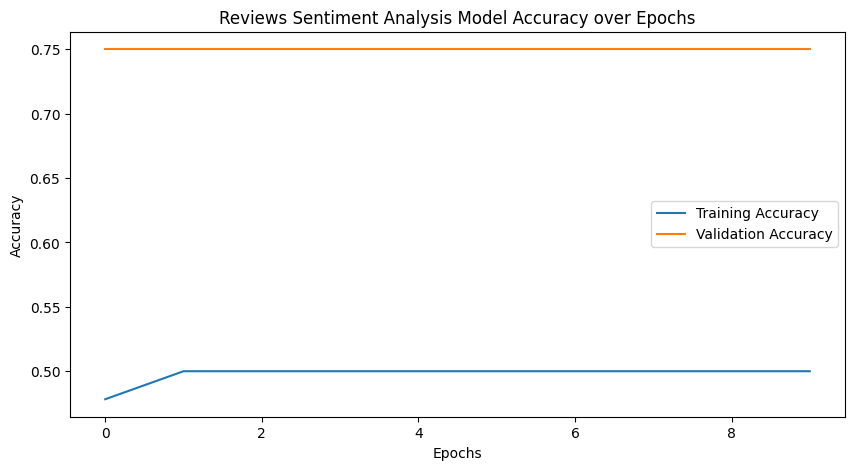

In [ ]:

# Plot accuracy
plt.figure(figsize=(10,5))
plt.plot(metrics_df.index, metrics_df.accuracy)
plt.plot(metrics_df.index, metrics_df.val_accuracy)
plt.title('Reviews Sentiment Analysis Model Accuracy over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend(['Training Accuracy', 'Validation Accuracy'])
plt.show()

<Axes: ylabel='count'>

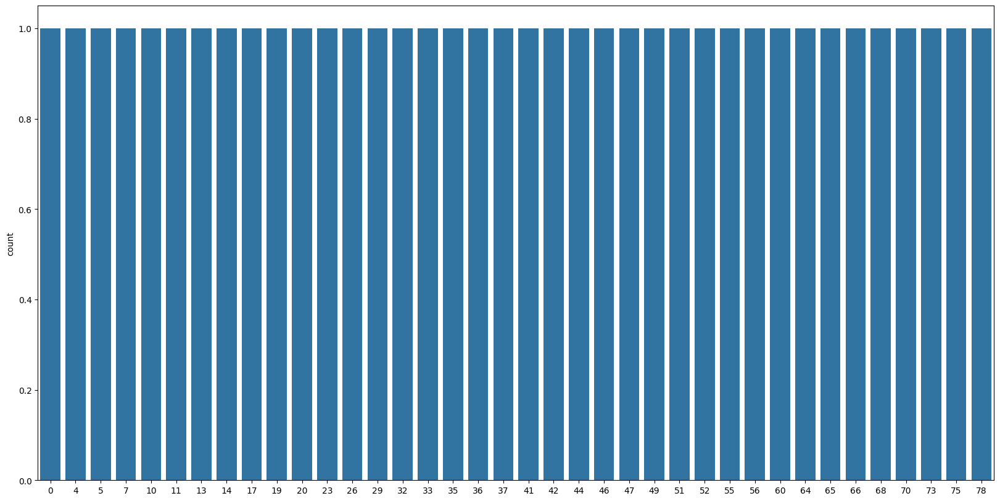

In [ ]:

# Prepare test dataset
X_test = test['fully_cleaned_text']
y_test = test['Interaction Category']


# Test data distribution for different sentiment types
sns.countplot(test['Interaction Category'])

In [ ]:
# Prepare test dataset
testsequences = tokenizer.texts_to_sequences(X_test)
testpadded = pad_sequences(testsequences, maxlen=sequence_length, padding='post', truncating='post')




In [ ]:



# Get predictions on test dataset
Y_pred = model.predict(testpadded, batch_size = 64)

1/1 [==============================] - 1s 558ms/step


In [ ]:
dfResults = pd.DataFrame(columns=['Model','Accuracy', 'Precision','Recall','F1 score','Confusion matrix'])
dfResults


,Model,Accuracy,Precision,Recall,F1 score,Confusion matrix


In [ ]:
# Evaluate the model performance on test dataset
from sklearn.metrics import confusion_matrix, precision_score, accuracy_score, recall_score, f1_score, roc_auc_score ,classification_report, RocCurveDisplay

y_pred = np.argmax(Y_pred, axis=1)
accuracy = accuracy_score(y_test, y_pred)
# print('Accuracy: {:.2f}%'.format(accuracy))
precision = precision_score(y_test, y_pred,average='weighted')
print('Precision: {:.2f}%'.format(precision))
recall = recall_score(y_test, y_pred, average='weighted')
print('Recall: {:.2f}%'.format( recall))
f1 = f1_score(y_test, y_pred,average='weighted')
print('F1 score: {:.2f}%'.format( f1))
print('Accuracy: {:.2f}%'.format(accuracy))
# print(classification_report(df_test['true'], df_test['pred']))


# confusion matrix
matrix = confusion_matrix(y_test, y_pred)
print("Confusion metrics \n",matrix)
print('**********************************************************')
print('*****************  Classification Report  ****************')
print('**********************************************************')
print(classification_report(y_test,y_pred))


Precision: 0.58%
Recall: 0.76%
F1 score: 0.66%
Accuracy: 0.76%
Confusion metrics 
 [[ 0  9]
 [ 0 29]]
**********************************************************
*****************  Classification Report  ****************
**********************************************************
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         9
           1       0.76      1.00      0.87        29

    accuracy                           0.76        38
   macro avg       0.38      0.50      0.43        38
weighted avg       0.58      0.76      0.66        38



In [ ]:

# Display the records for all the calssifiers
dfResults.head()

,Model,Accuracy,Precision,Recall,F1 score,Confusion matrix


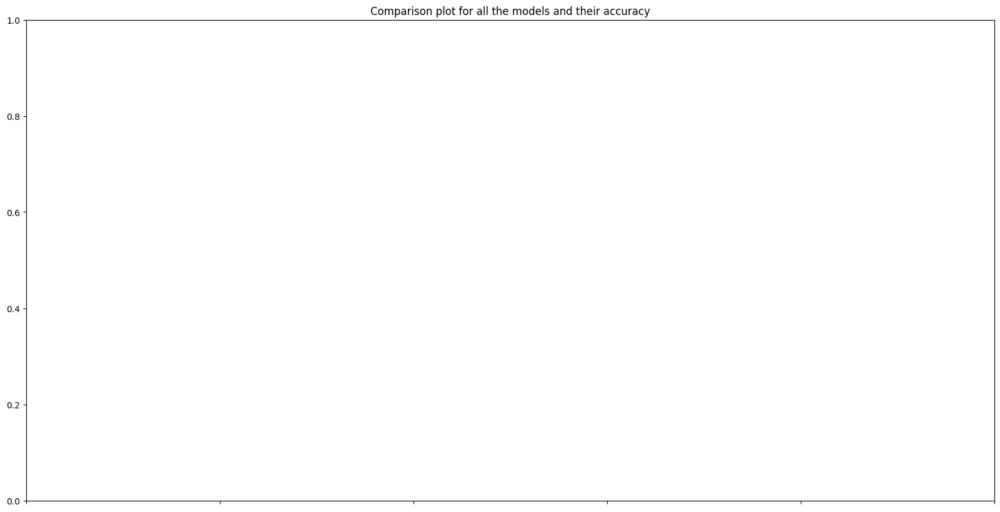

In [ ]:
# Visualize the matrics for all the models
plt.figure(figsize=(20,10))
ax= sns.barplot(x = dfResults.Model,y = dfResults.Accuracy, data=dfResults)

ax.set_xticklabels(dfResults.Model,rotation = 75)
ax.set_title('Comparison plot for all the models and their accuracy')
plt.show()

In [ ]:
from google.colab import files
uploaded=files.upload()


Saving All About GEP Schools.csv to All About GEP Schools.csv


In [ ]:
df10=pd.read_csv("All About GEP Schools.csv",encoding= 'unicode_escape')

In [ ]:
df10

,Unnamed: 0.1,Unnamed: 0,Thread,Post_user,Post_replies_ID,Forum_Sentiment,Included or Excluded from Analysis?,Interaction Type,Interaction Category,Relationship Type,Forum_Sentiment.1,Anonymized_Post_user,Anonymized_Post_replies_ID,Number_of_Posts_y
0,0,0,1,sleepy,NaN,Which is better?\nWhy?\nWhat do you think shou...,Included,Request,Request to Share Knowledge,Learner->Community,Which is better?\nWhy?\nWhat do you think shou...,A,NaN,3
1,1,1,2,lizawa,sleepy,If I understand correctly. all the GEP student...,Included,Response,Response to Share Knowledge,Learner->Learner,If I understand correctly. all the GEP student...,B,A,3
2,2,2,3,raysusan,lizawa,GEP test are carry out in whole singapore when...,Included,Request,Request to Share Knowledge Without Prompting,Learner->Learner,GEP test are carry out in whole singapore when...,C,B,1
3,3,3,4,lizawa,raysusan,"Yes, it's a GEP screening test that is opened ...",Included,Response,Response to Share Knowledge,Learner->Learner,"Yes, it's a GEP screening test that is opened ...",B,C,3
4,4,4,5,lambchop1976,NaN,correct me if im wrong but from my understandi...,Included,Response And Share,Response to Share Knowledge Without Prompting,Learner->Community,correct me if im wrong but from my understandi...,D,NaN,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
116,116,116,117,aspros_helios,NaN,"Hi,\n\npresuming I got 2 kids.\nScenario: If t...",Included,Request,Request to Share Knowledge Without Prompting,Learner->Learner,"Hi,\n\npresuming I got 2 kids.\nScenario: If t...",AH,NaN,1
117,117,117,118,jtoh,aspros_helios,1. Your elder kid would already by in School B...,Included,Response,Response to Construct Knowledge,Learner->Learner,1. Your elder kid would already by in School B...,Y,AH,10
118,118,118,119,grapevine,jtoh,Your kid will be phase 2A2 for school A. As si...,Included,Response,Response to Create Knowledge,Learner->Learner,Your kid will be phase 2A2 for school A. As si...,AE,Y,4
119,119,119,120,I2az,NaN,May I know how do the geppers progress to P5? ...,Included,Request,Request to Create Knowledge Without Prompting,Learner->Community,May I know how do the geppers progress to P5? ...,AI,NaN,1


In [ ]:
G10 = nx.from_pandas_edgelist(df10,
                            source='Anonymized_Post_user',
                            target='Anonymized_Post_replies_ID',

                            create_using=nx.DiGraph())

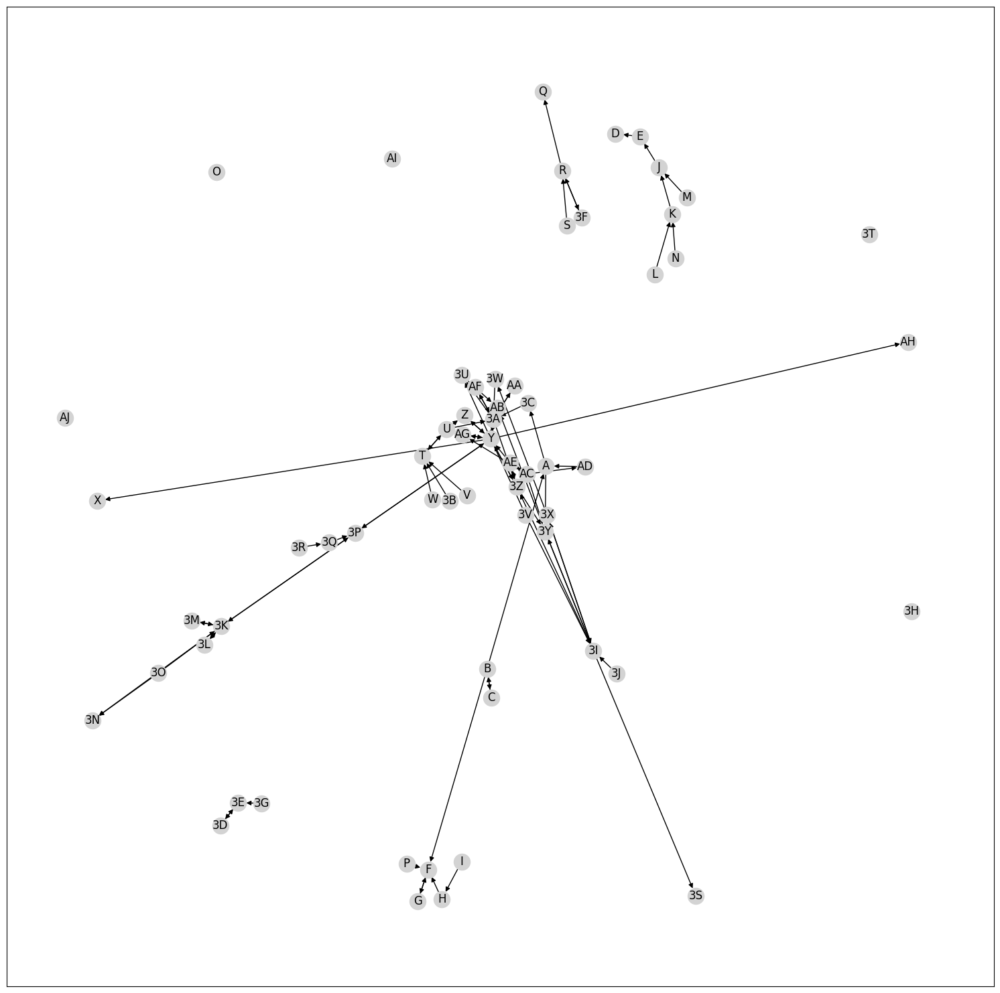

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt

# Assuming G10 is your NetworkX graph
# For illustration purposes, let's assume you want to remove nodes with no replies

# Identify nodes with no replies
nodes_with_replies = [node for node in G10.nodes() if G10.out_degree(node) > 0]

# Create a subgraph with only nodes that have replies
subgraph = G10.subgraph(nodes_with_replies)

# Larger figure size
plt.figure(figsize=(19, 19))  #21,21   23,23

# Draw the subgraph with adjusted node size and color
nx.draw_networkx(subgraph, node_size=300, node_color='lightgrey') #370   400

# Draw node labels with larger font size
node_labels = nx.get_node_attributes(subgraph, 'label')  # Assuming you have labels stored as node attributes
nx.draw_networkx_labels(subgraph, pos=nx.spring_layout(subgraph), labels=node_labels, font_size=1000)

# Show the plot
plt.show()


In [ ]:
import pandas as pd

# Initialize dictionary to store interaction counts
interaction_counts = {}

# Iterate through each row of the DataFrame
for index, row in df10.iterrows():
    user = row['Anonymized_Post_user']
    reply_id = row['Anonymized_Post_replies_ID']

    # Check if the reply ID is not empty
    if reply_id:
        # Increment the count for the user pair
        interaction_counts[(user, reply_id)] = interaction_counts.get((user, reply_id), 0) + 1

# Print the interaction counts
for user_pair, count in interaction_counts.items():
    print(f"Interaction between {user_pair[0]} and {user_pair[1]}: {count}")

Interaction between A and nan: 1
Interaction between B and A: 1
Interaction between C and B: 1
Interaction between B and C: 1
Interaction between D and nan: 1
Interaction between E and D: 1
Interaction between F and nan: 2
Interaction between G and F: 1
Interaction between F and G: 1
Interaction between B and F: 1
Interaction between H and F: 1
Interaction between I and H: 1
Interaction between J and E: 1
Interaction between K and J: 1
Interaction between L and K: 1
Interaction between M and J: 1
Interaction between N and K: 1
Interaction between O and nan: 2
Interaction between P and F: 1
Interaction between Q and nan: 1
Interaction between R and Q: 1
Interaction between S and R: 1
Interaction between T and nan: 1
Interaction between U and T: 2
Interaction between T and U: 1
Interaction between V and T: 1
Interaction between W and T: 1
Interaction between X and nan: 1
Interaction between Y and X: 1
Interaction between Z and Y: 1
Interaction between Y and Z: 1
Interaction between U and

In [ ]:
deg_cen_points = dict(G10.in_degree)
{k:deg_cen_points[k] for k in deg_cen_points if deg_cen_points[k]==max(deg_cen_points.values())}

{nan: 38}

In [ ]:
between = dict(nx.betweenness_centrality(G10,weight='points'))
{k:between[k] for k in between if between[k]==max(between.values())}

{'jtoh': 0.04305835010060362}

In [ ]:
#Calling the function to clean the dataset

#df6 = df6.values.tolist()
df10 = pd.DataFrame(df10)

df10['partially_cleaned_text'] = clean_text(df10['Forum_Sentiment'])

In [ ]:
# Assuming 'partially_clean_text' is the column you want to process
df10['fully_cleaned_text'] = df10['partially_cleaned_text'].apply(lemma_text)

In [ ]:
score_vec=df10['fully_cleaned_text']

KeyError: 'fully_cleaned_text'

In [ ]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
import string

# Download NLTK stopwords
import nltk
nltk.download('stopwords')

def generate_word_cloud(text):
    # Tokenize the text
    words = word_tokenize(text)

    # Remove stopwords and punctuation
    stop_words = set(stopwords.words('english'))
    words = [word.lower() for word in words if word.isalnum() and word.lower() not in stop_words]

    # Join the cleaned words back into a string
    cleaned_text = " ".join(words)

    # Generate a word cloud image
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(cleaned_text)

    # Display the generated image:
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.show()

# Assuming score_vec is a string containing the cleaned text
generate_word_cloud(" ".join(score_vec))


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


NameError: name 'score_vec' is not defined

In [ ]:
import string

def getMostCommonWords(reviews, n_most_common):
    # flatten review column into a list of words, and set each to lowercase
    flattened_reviews = [word for review in reviews for word in \
                         review.lower().split()]

                           # remove punctuation from reviews
    flattened_reviews = [''.join(char for char in review if \
                                 char not in string.punctuation) for \
                         review in flattened_reviews]


    # remove any empty strings that were created by this process
    flattened_reviews = [review for review in flattened_reviews if review]

    return Counter(flattened_reviews).most_common(n_most_common)

In [ ]:

getMostCommonWords(df10['fully_cleaned_text'],10)

[('school', 144),
 ('class', 85),
 ('that', 63),
 ('student', 59),
 ('they', 47),
 ('have', 45),
 ('will', 44),
 ('from', 41),
 ('kid', 38),
 ('with', 38)]

In [ ]:
#Print the top 10 words in the bigram frequency
common_words = get_top_n_ngram(df10['fully_cleaned_text'], 2, 10)
pd.DataFrame(common_words)

--1 [[5 1 1 ... 2 1 1]]


,0,1
0,intermingling class,16
1,meta class,12
2,mainstream class,10
3,high ability,9
4,screening test,6
5,primary school,6
6,school school,5
7,ability class,5
8,ability student,5
9,intermingling programme,5


In [ ]:
# Example usage
Stopwords = set(stopwords.words("english")) - set(["not"])
words = Gram_Analysis(df10["fully_cleaned_text"], 1, 10, Stopwords)

# Visualization
Trigram = pd.DataFrame(words, columns=["Words", "Counts"])
Trigram.groupby("Words").sum()["Counts"].sort_values().plot(
    kind="barh", color="green", figsize=(10, 5)
)
plt.title(
    "Bigram of Common Words",
    loc="center",
    fontsize=15,
    color="blue",
    pad=25,
)
plt.xlabel("Total Counts", color="magenta", fontsize=10, labelpad=15)
plt.xticks(rotation=0)
plt.ylabel("Top Words", color="cyan", fontsize=10, labelpad=15)
plt.show()

KeyError: 'fully_cleaned_text'

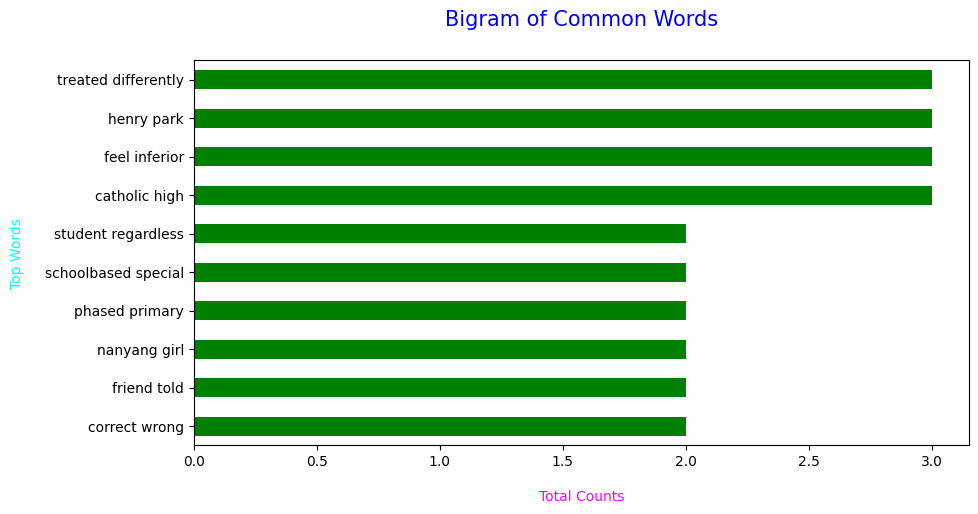

In [ ]:
# Example usage
Stopwords = set(stopwords.words("english")) - set(["not"])
words = Gram_Analysis(df10["fully_cleaned_text"], 2, 10, Stopwords)

# Visualization
Trigram = pd.DataFrame(words, columns=["Words", "Counts"])
Trigram.groupby("Words").sum()["Counts"].sort_values().plot(
    kind="barh", color="green", figsize=(10, 5)
)
plt.title(
    "Bigram of Common Words",
    loc="center",
    fontsize=15,
    color="blue",
    pad=25,
)
plt.xlabel("Total Counts", color="magenta", fontsize=10, labelpad=15)
plt.xticks(rotation=0)
plt.ylabel("Top Words", color="cyan", fontsize=10, labelpad=15)
plt.show()

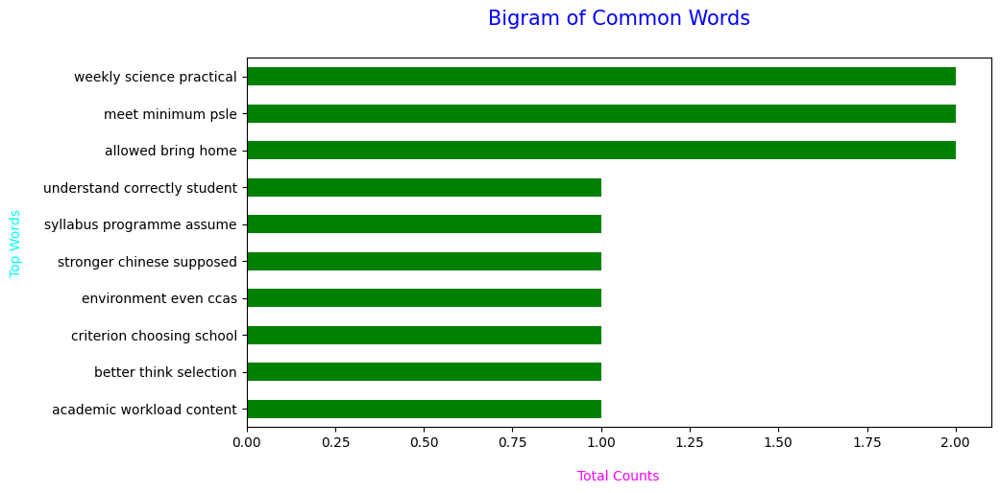

In [ ]:
# Example usage
Stopwords = set(stopwords.words("english")) - set(["not"])
words = Gram_Analysis(df10["fully_cleaned_text"], 3, 10, Stopwords)

# Visualization
Trigram = pd.DataFrame(words, columns=["Words", "Counts"])
Trigram.groupby("Words").sum()["Counts"].sort_values().plot(
    kind="barh", color="green", figsize=(10, 5)
)
plt.title(
    "Bigram of Common Words",
    loc="center",
    fontsize=15,
    color="blue",
    pad=25,
)
plt.xlabel("Total Counts", color="magenta", fontsize=10, labelpad=15)
plt.xticks(rotation=0)
plt.ylabel("Top Words", color="cyan", fontsize=10, labelpad=15)
plt.show()

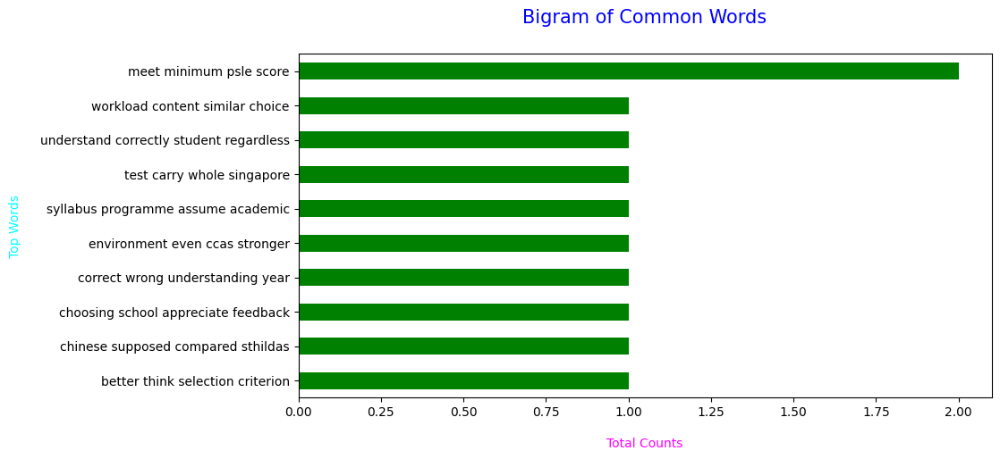

In [ ]:
# Example usage
Stopwords = set(stopwords.words("english")) - set(["not"])
words = Gram_Analysis(df10["fully_cleaned_text"], 4, 10, Stopwords)

# Visualization
Trigram = pd.DataFrame(words, columns=["Words", "Counts"])
Trigram.groupby("Words").sum()["Counts"].sort_values().plot(
    kind="barh", color="green", figsize=(10, 5)
)
plt.title(
    "Bigram of Common Words",
    loc="center",
    fontsize=15,
    color="blue",
    pad=25,
)
plt.xlabel("Total Counts", color="magenta", fontsize=10, labelpad=15)
plt.xticks(rotation=0)
plt.ylabel("Top Words", color="cyan", fontsize=10, labelpad=15)
plt.show()

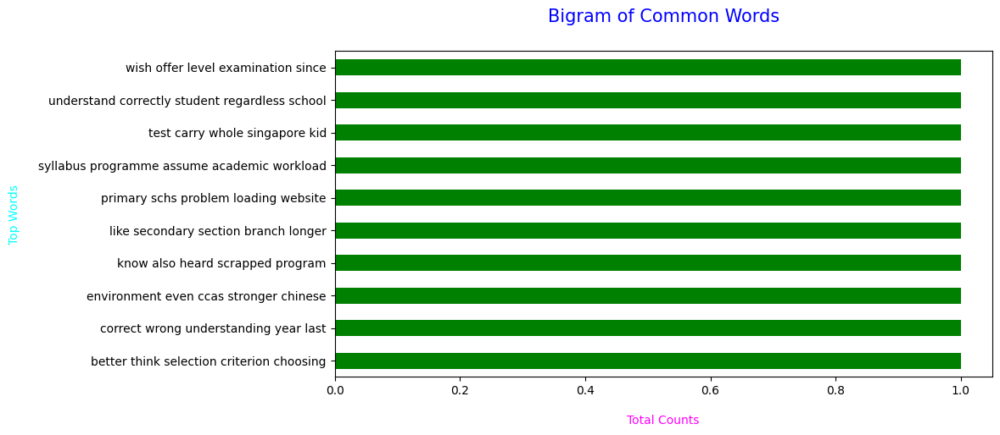

In [ ]:
# Example usage
Stopwords = set(stopwords.words("english")) - set(["not"])
words = Gram_Analysis(df10["fully_cleaned_text"], 5, 10, Stopwords)

# Visualization
Trigram = pd.DataFrame(words, columns=["Words", "Counts"])
Trigram.groupby("Words").sum()["Counts"].sort_values().plot(
    kind="barh", color="green", figsize=(10, 5)
)
plt.title(
    "Bigram of Common Words",
    loc="center",
    fontsize=15,
    color="blue",
    pad=25,
)
plt.xlabel("Total Counts", color="magenta", fontsize=10, labelpad=15)
plt.xticks(rotation=0)
plt.ylabel("Top Words", color="cyan", fontsize=10, labelpad=15)
plt.show()

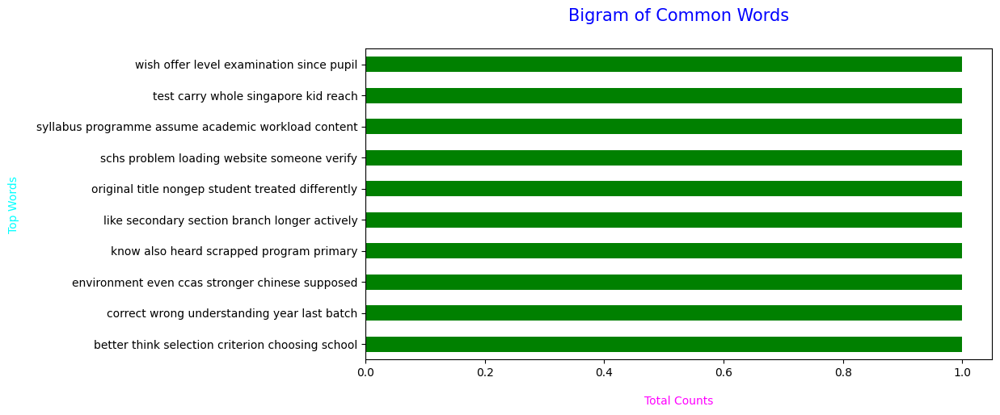

In [ ]:
# Example usage
Stopwords = set(stopwords.words("english")) - set(["not"])
words = Gram_Analysis(df10["fully_cleaned_text"], 6, 10, Stopwords)

# Visualization
Trigram = pd.DataFrame(words, columns=["Words", "Counts"])
Trigram.groupby("Words").sum()["Counts"].sort_values().plot(
    kind="barh", color="green", figsize=(10, 5)
)
plt.title(
    "Bigram of Common Words",
    loc="center",
    fontsize=15,
    color="blue",
    pad=25,
)
plt.xlabel("Total Counts", color="magenta", fontsize=10, labelpad=15)
plt.xticks(rotation=0)
plt.ylabel("Top Words", color="cyan", fontsize=10, labelpad=15)
plt.show()

In [ ]:
from google.colab import files
uploaded=files.upload()

Saving DSA_Via_Sports.csv to DSA_Via_Sports.csv


In [ ]:
df11=pd.read_csv("DSA_Via_Sports.csv",encoding= 'unicode_escape')

In [ ]:
df11

,Unnamed: 0,No,Thread,Post_user,Post_replies_ID,Forum_Sentiment,Included or Excluded from Analysis?,Interaction Type,Interaction Category,Relationship Type,Forum_Sentiment.1,Anonymized_Post_user,Anonymized_Post_replies_ID,Number_of_Posts
0,0,0,DSA via sports,ruohoo97,NaN,Dear All:\n\nI searched through the past threa...,Included,Request,Request to Share Knowledge,Learner->Community,Dear All:\n\nI searched through the past threa...,A,NaN,7
1,1,1,NaN,jtoh,ruohoo97,Which sport is your son planning to DSA with? ...,Included,Request,Request to Share Knowledge,Learner->Learner,Which sport is your son planning to DSA with? ...,B,A,4
2,2,2,NaN,ruohoo97,jtoh,"My DD, swimming. She has to choose between DSA...",Included,Request,Request to Share Knowledge,Learner->Learner,"My DD, swimming. She has to choose between DSA...",A,B,7
3,3,3,NaN,jtoh,ruohoo97,You can only indicate one DSA domain - academi...,Included,Response,Response to Construct Knowledge,Learner->Learner,You can only indicate one DSA domain - academi...,B,A,4
4,4,4,NaN,ks2011,ruohoo97,"Like jtoh said, if your dd is committed to swi...",Included,Response,Response to Construct Knowledge,Learner->Learner,"Like jtoh said, if your dd is committed to swi...",C,A,1
5,5,5,NaN,ruohoo97,ks2011,Thanks for reply. DD is committed to swim. The...,Included,Response,Response to Share Knowledge,Learner->Learner,Thanks for reply. DD is committed to swim. The...,A,C,7
6,6,6,NaN,jtoh,ruohoo97,Which school is your dd aiming for? Not all sc...,Included,Request,Request to Construct Knowledge,Learner->Learner,Which school is your dd aiming for? Not all sc...,B,A,4
7,7,7,NaN,ruohoo97,jtoh,She is aiming for RGS and NYGH.,Included,Response,Response to Share Knowledge,Learner->Learner,She is aiming for RGS and NYGH.,A,B,7
8,8,8,NaN,jtoh,ruohoo97,There are no dedicated sports classes in RGS. ...,Included,Response,Response to Construct Knowledge,Learner->Learner,There are no dedicated sports classes in RGS. ...,B,A,4
9,9,9,NaN,ruohoo97,jtoh,Thank You,Included,Response,Acknowledgement,Learner->Learner,Thank You,A,B,7


In [ ]:
G11 = nx.from_pandas_edgelist(df11,
                            source='Anonymized_Post_user',
                            target='Anonymized_Post_replies_ID',

                            create_using=nx.DiGraph())

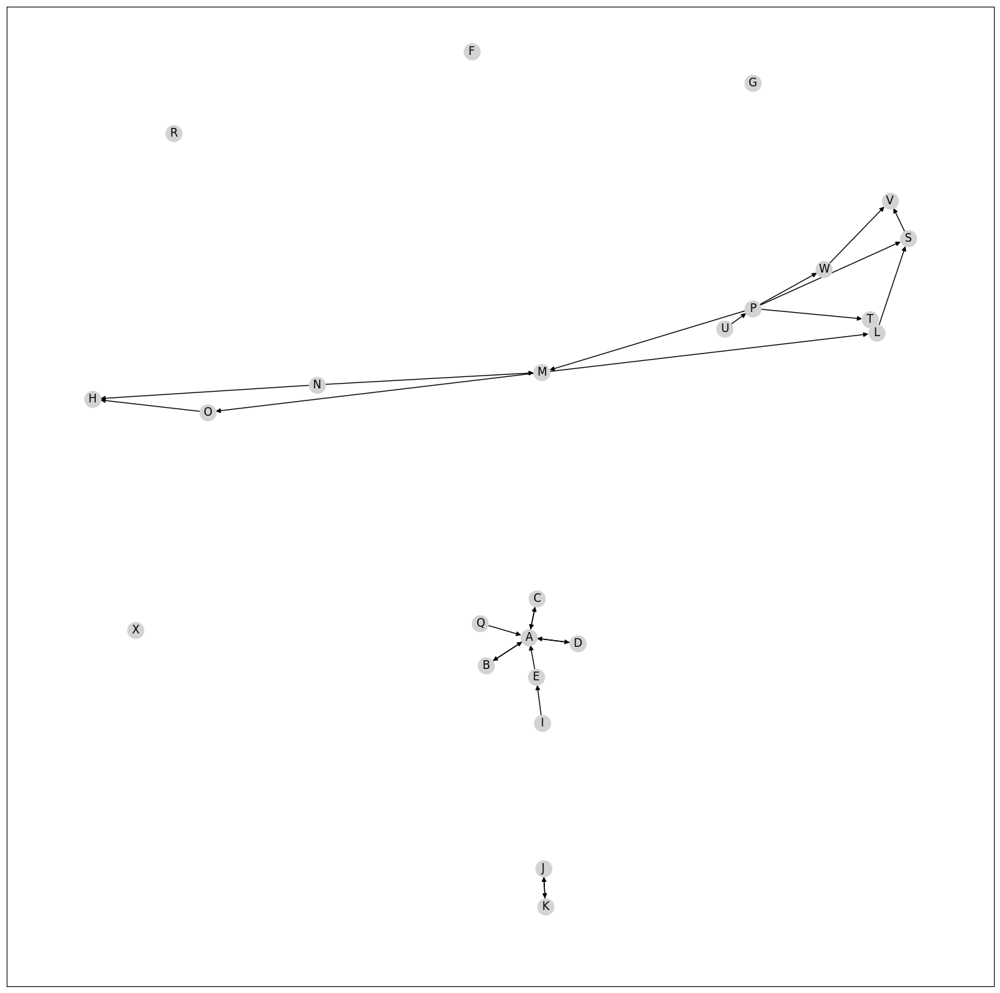

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt

# Assuming G11 is your NetworkX graph
# For illustration purposes, let's assume you want to remove nodes with no replies

# Identify nodes with no replies
nodes_with_replies = [node for node in G11.nodes() if G11.out_degree(node) > 0]

# Create a subgraph with only nodes that have replies
subgraph = G11.subgraph(nodes_with_replies)

# Larger figure size
plt.figure(figsize=(19, 19))  #21,21   23,23

# Draw the subgraph with adjusted node size and color
nx.draw_networkx(subgraph, node_size=300, node_color='lightgrey')

# Draw node labels with larger font size
node_labels = nx.get_node_attributes(subgraph, 'label')  # Assuming you have labels stored as node attributes
nx.draw_networkx_labels(subgraph, pos=nx.spring_layout(subgraph), labels=node_labels, font_size=30)

# Show the plot
plt.show()


In [ ]:
import pandas as pd



# Initialize dictionary to store interaction counts
interaction_counts = {}

# Iterate through each row of the DataFrame
for index, row in df11.iterrows():
    user = row['Anonymized_Post_user']
    reply_id = row['Anonymized_Post_replies_ID']

    # Check if the reply ID is not empty
    if reply_id:
        # Increment the count for the user pair
        interaction_counts[(user, reply_id)] = interaction_counts.get((user, reply_id), 0) + 1

# Print the interaction counts
for user_pair, count in interaction_counts.items():
    print(f"Interaction between {user_pair[0]} and {user_pair[1]}: {count}")



Interaction between A and nan: 2
Interaction between B and A: 4
Interaction between A and B: 3
Interaction between C and A: 1
Interaction between A and C: 1
Interaction between D and A: 1
Interaction between A and D: 1
Interaction between E and A: 1
Interaction between F and nan: 1
Interaction between G and nan: 1
Interaction between H and nan: 2
Interaction between I and E: 1
Interaction between J and nan: 1
Interaction between K and J: 2
Interaction between J and K: 1
Interaction between L and nan: 1
Interaction between M and L: 1
Interaction between N and M: 1
Interaction between N and H: 1
Interaction between O and H: 1
Interaction between M and O: 1
Interaction between P and M: 1
Interaction between Q and A: 1
Interaction between R and nan: 1
Interaction between S and nan: 1
Interaction between L and S: 1
Interaction between T and L: 1
Interaction between P and T: 1
Interaction between P and S: 1
Interaction between U and P: 1
Interaction between V and nan: 1
Interaction between W

In [ ]:
deg_cen_points = dict(G11.in_degree)
{k:deg_cen_points[k] for k in deg_cen_points if deg_cen_points[k]==max(deg_cen_points.values())}

{nan: 10}

In [ ]:
between = dict(nx.betweenness_centrality(G11,weight='points'))
{k:between[k] for k in between if between[k]==max(between.values())}

{'A': 0.03804347826086957}

In [ ]:
#Calling the function to clean the dataset

#df6 = df6.values.tolist()
df11 = pd.DataFrame(df11)

df11['partially_cleaned_text'] = clean_text(df11['Forum_Sentiment'])

In [ ]:
# Assuming 'partially_clean_text' is the column you want to process
df11['fully_cleaned_text'] = df11['partially_cleaned_text'].apply(lemma_text)

In [ ]:
score_vec=df11['fully_cleaned_text']

KeyError: 'fully_cleaned_text'

In [ ]:
score_vec

In [ ]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
import string

# Download NLTK stopwords
import nltk
nltk.download('stopwords')

def generate_word_cloud(text):
    # Tokenize the text
    words = word_tokenize(text)

    # Remove stopwords and punctuation
    stop_words = set(stopwords.words('english'))
    words = [word.lower() for word in words if word.isalnum() and word.lower() not in stop_words]

    # Join the cleaned words back into a string
    cleaned_text = " ".join(words)

    # Generate a word cloud image
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(cleaned_text)

    # Display the generated image:
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.show()

# Assuming score_vec is a string containing the cleaned text
generate_word_cloud(" ".join(score_vec))


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


NameError: name 'score_vec' is not defined

In [ ]:
getMostCommonWords(df11['fully_cleaned_text'],10)

In [ ]:
#Print the top 10 words in the bigram frequency
common_words = get_top_n_ngram(df11['fully_cleaned_text'], 2, 10)
pd.DataFrame(common_words)

--1 [[1 1 1 1 1 1 1 2 1 1 1 1 1 1 1 1 1 1 1 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 1
  1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 1 1 2 1 1 1 1 1 1 1 1 1 1
  1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
  1 1 1 1 1 1 4 1 1 1 1 1 1 1 1 1 1 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
  1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
  1 1 1 2 1 1 1 1 1 1 1 2 1 1 1 1 1 1 1 1 1 1 1 2 1 1 1 1 1 1 1 1 1 1 1 1
  1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 1 2 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 1 1 1 1
  1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 1 1 1 1 3 1 1 1
  1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 1 1 2 1 1 1 1 1 1 1 1 1
  1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
  1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2
  1 1 1 1 1 1 1 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
  1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 1 1 2 1 1 2 1 1 1 3 1 1 1 1 1 1 2 1
  1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 

,0,1
0,raffle girl,7
1,sport class,6
2,track field,6
3,spore sport,5
4,chong institution,4
5,girl sport,3
6,nanyang girl,3
7,secondary school,3
8,national level,2
9,medal winner,2


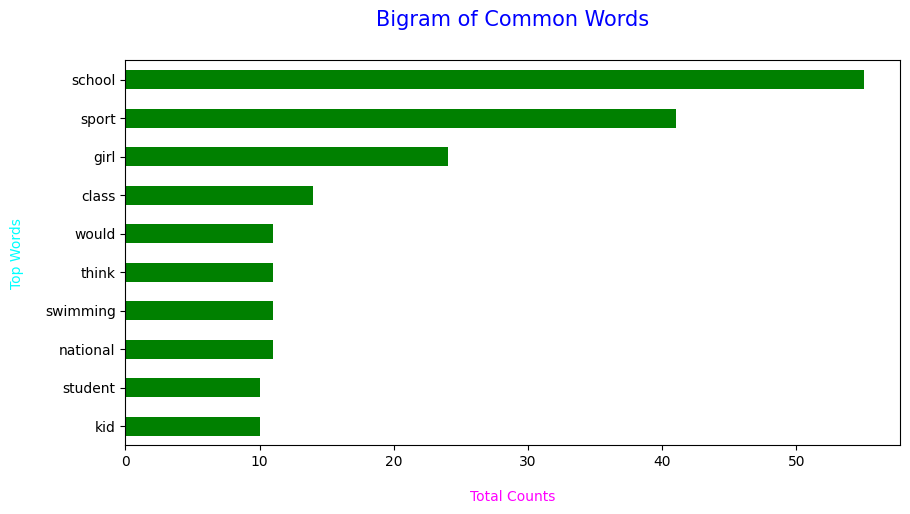

In [ ]:
# Example usage
Stopwords = set(stopwords.words("english")) - set(["not"])
words = Gram_Analysis(df11["fully_cleaned_text"], 1, 10, Stopwords)

# Visualization
Trigram = pd.DataFrame(words, columns=["Words", "Counts"])
Trigram.groupby("Words").sum()["Counts"].sort_values().plot(
    kind="barh", color="green", figsize=(10, 5)
)
plt.title(
    "Bigram of Common Words",
    loc="center",
    fontsize=15,
    color="blue",
    pad=25,
)
plt.xlabel("Total Counts", color="magenta", fontsize=10, labelpad=15)
plt.xticks(rotation=0)
plt.ylabel("Top Words", color="cyan", fontsize=10, labelpad=15)
plt.show()

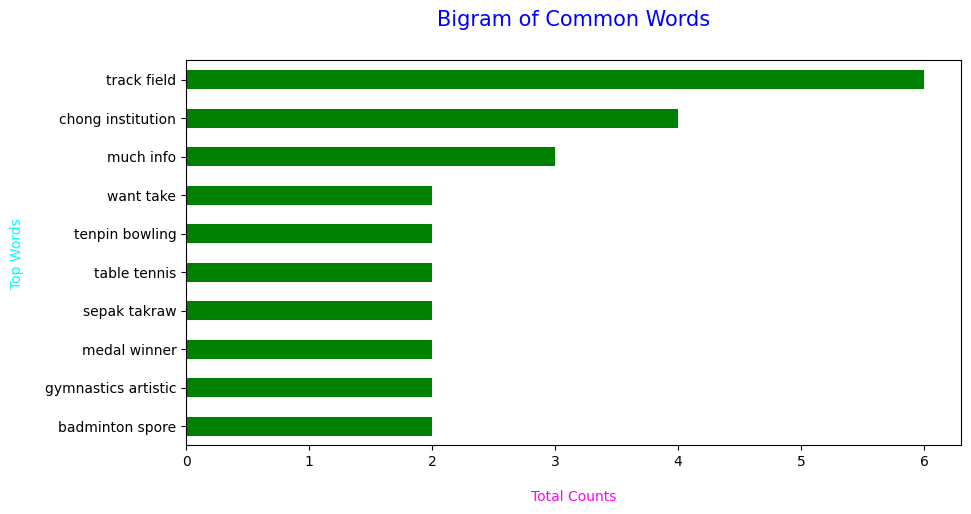

In [ ]:
# Example usage
Stopwords = set(stopwords.words("english")) - set(["not"])
words = Gram_Analysis(df11["fully_cleaned_text"], 2, 10, Stopwords)

# Visualization
Trigram = pd.DataFrame(words, columns=["Words", "Counts"])
Trigram.groupby("Words").sum()["Counts"].sort_values().plot(
    kind="barh", color="green", figsize=(10, 5)
)
plt.title(
    "Bigram of Common Words",
    loc="center",
    fontsize=15,
    color="blue",
    pad=25,
)
plt.xlabel("Total Counts", color="magenta", fontsize=10, labelpad=15)
plt.xticks(rotation=0)
plt.ylabel("Top Words", color="cyan", fontsize=10, labelpad=15)
plt.show()

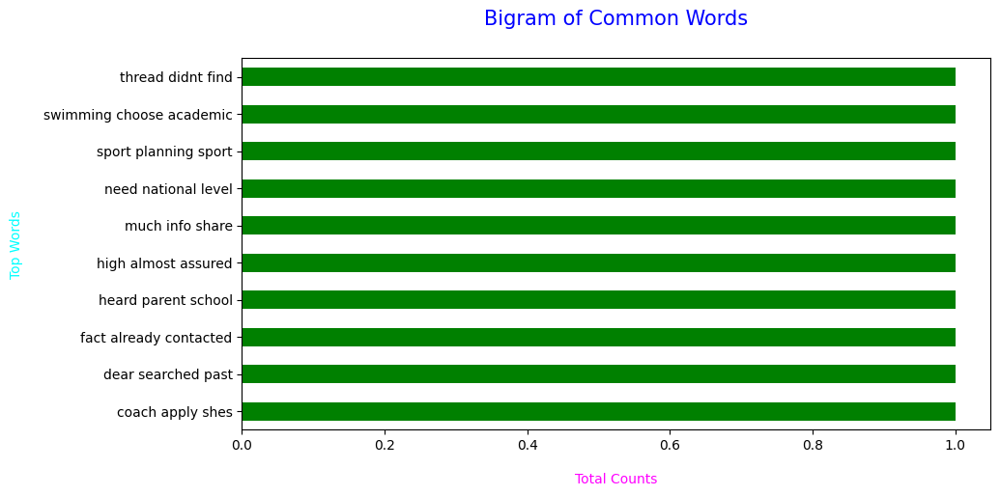

In [ ]:
# Example usage
Stopwords = set(stopwords.words("english")) - set(["not"])
words = Gram_Analysis(df11["fully_cleaned_text"], 3, 10, Stopwords)

# Visualization
Trigram = pd.DataFrame(words, columns=["Words", "Counts"])
Trigram.groupby("Words").sum()["Counts"].sort_values().plot(
    kind="barh", color="green", figsize=(10, 5)
)
plt.title(
    "Bigram of Common Words",
    loc="center",
    fontsize=15,
    color="blue",
    pad=25,
)
plt.xlabel("Total Counts", color="magenta", fontsize=10, labelpad=15)
plt.ylabel("Top Words", color="cyan", fontsize=10, labelpad=15)
plt.show()

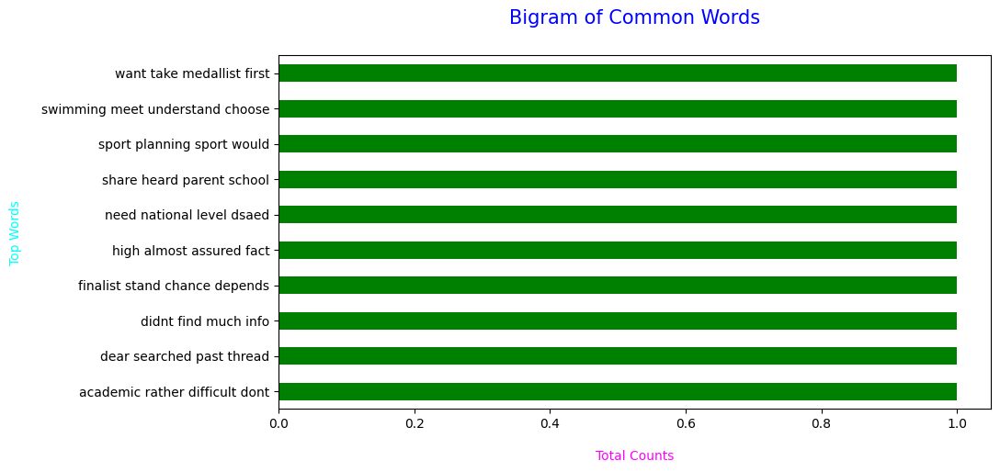

In [ ]:
# Example usage
Stopwords = set(stopwords.words("english")) - set(["not"])
words = Gram_Analysis(df11["fully_cleaned_text"], 4, 10, Stopwords)

# Visualization
Trigram = pd.DataFrame(words, columns=["Words", "Counts"])
Trigram.groupby("Words").sum()["Counts"].sort_values().plot(
    kind="barh", color="green", figsize=(10, 5)
)
plt.title(
    "Bigram of Common Words",
    loc="center",
    fontsize=15,
    color="blue",
    pad=25,
)
plt.xlabel("Total Counts", color="magenta", fontsize=10, labelpad=15)
plt.ylabel("Top Words", color="cyan", fontsize=10, labelpad=15)
plt.show()

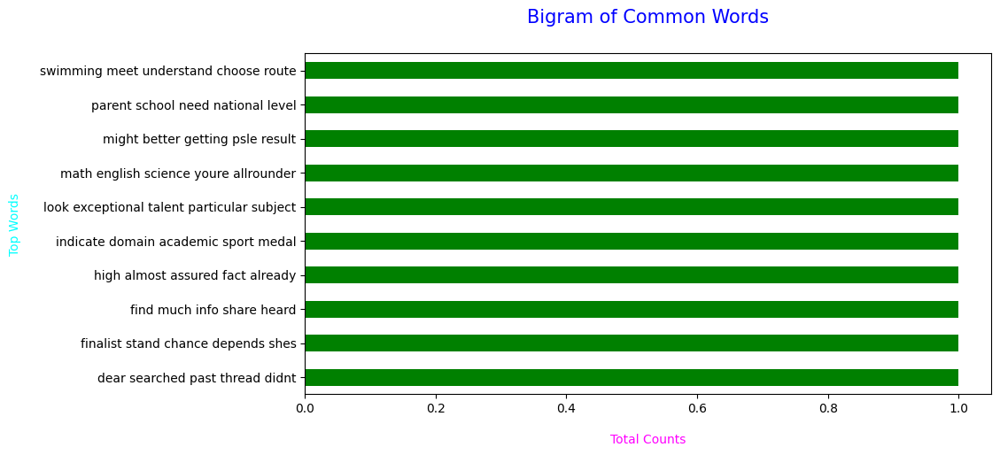

In [ ]:
# Example usage
Stopwords = set(stopwords.words("english")) - set(["not"])
words = Gram_Analysis(df11["fully_cleaned_text"], 5, 10, Stopwords)

# Visualization
Trigram = pd.DataFrame(words, columns=["Words", "Counts"])
Trigram.groupby("Words").sum()["Counts"].sort_values().plot(
    kind="barh", color="green", figsize=(10, 5)
)
plt.title(
    "Bigram of Common Words",
    loc="center",
    fontsize=15,
    color="blue",
    pad=25,
)
plt.xlabel("Total Counts", color="magenta", fontsize=10, labelpad=15)
plt.xticks(rotation=0)
plt.ylabel("Top Words", color="cyan", fontsize=10, labelpad=15)
plt.show()

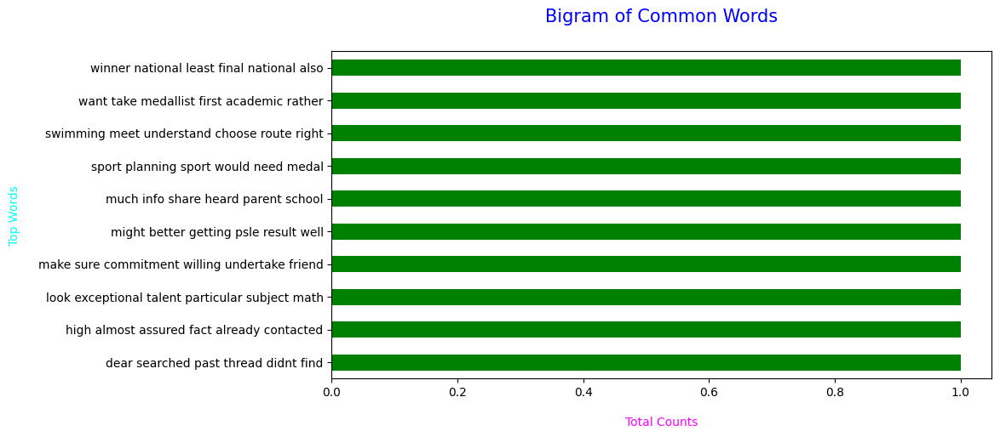

In [ ]:
# Example usage
Stopwords = set(stopwords.words("english")) - set(["not"])
words = Gram_Analysis(df11["fully_cleaned_text"], 6, 10, Stopwords)

# Visualization
Trigram = pd.DataFrame(words, columns=["Words", "Counts"])
Trigram.groupby("Words").sum()["Counts"].sort_values().plot(
    kind="barh", color="green", figsize=(10, 5)
)
plt.title(
    "Bigram of Common Words",
    loc="center",
    fontsize=15,
    color="blue",
    pad=25,
)
plt.xlabel("Total Counts", color="magenta", fontsize=10, labelpad=15)
plt.xticks(rotation=0)
plt.ylabel("Top Words", color="cyan", fontsize=10, labelpad=15)
plt.show()

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import TruncatedSVD
from sklearn.preprocessing import Normalizer

# Example dataset (replace with your own documents)
dataset = ["doc1 text", "doc2 text", "doc3 text"]

# Create a TF-IDF vectorizer
vectorizer = TfidfVectorizer(max_df=0.5, stop_words='english')
X = vectorizer.fit_transform(dataset)

# Perform LSA (SVD decomposition)
lsa = TruncatedSVD()
X = lsa.fit_transform(X)

# Normalize the resulting matrix
X = Normalizer(copy=False).fit_transform(X)


In [ ]:
from google.colab import files
uploaded=files.upload()

Saving kiasu_Parents_Combined.csv to kiasu_Parents_Combined.csv


In [ ]:
df12=pd.read_csv("kiasu_Parents_Combined.csv",encoding= 'unicode_escape')

In [ ]:
df12

,Thread,Post_user,Post_replies_ID,Forum_Sentiment,Included or Excluded from Analysis?,Interaction Type,Interaction Category,Relationship Type,partially_cleaned_text
0,1,sleepy,NaN,Which is better?\nWhy?\nWhat do you think shou...,Included,Request,Request to Share Knowledge,Learner->Community,which is better\nwhy\nwhat do you think should...
1,2,lizawa,sleepy,If I understand correctly. all the GEP student...,Included,Response,Response to Share Knowledge,Learner->Learner,if i understand correctly all the gep students...
2,3,raysusan,lizawa,GEP test are carry out in whole singapore when...,Included,Request,Request to Share Knowledge Without Prompting,Learner->Learner,gep test are carry out in whole singapore when...
3,4,lizawa,raysusan,"Yes, it's a GEP screening test that is opened ...",Included,Response,Response to Share Knowledge,Learner->Learner,yes its a gep screening test that is opened to...
4,5,lambchop1976,NaN,correct me if im wrong but from my understandi...,Included,Response,Response to Share Knowledge Without Prompting,Learner->Community,correct me if im wrong but from my understandi...
...,...,...,...,...,...,...,...,...,...
159,121,iceteasu,NaN,"If a P6 kid's school result is good, sport's r...",Included,Request,Request to Construct Knowledge,Learner->Community,if a kids school result is good sports result...
160,121,Zappy,iceteasu,"With that kind of sports/ academic results, I ...",Included,Response,Response to Share Knowledge Without Prompting,Learner->Learner,with that kind of sports academic results i am...
161,121,zac's mum,iceteasu,Erm...examine the reason why he cannot handle ...,Included,Request,Request to Share Knowledge,Learner->Learner,ermexamine the reason why he cannot handle int...
162,121,floppy,iceteasu,"Unless the child says really, really dumb thin...",Included,Response,Response to Create Knowledge,Learner->Learner,unless the child says really really dumb thing...


In [ ]:
df12 = pd.DataFrame(df12)

df12['partially_cleaned_text'] = clean_text(df12['Forum_Sentiment'])

In [ ]:
#Calling the function to clean the dataset


df12 = pd.DataFrame(df12)

df12['partially_cleaned_text'] = clean_text(df12['Forum_Sentiment'])

In [ ]:

# Assuming 'partially_clean_text' is the column you want to process
df12['fully_cleaned_text'] = df12['partially_cleaned_text'].apply(lemma_text)

In [ ]:
df12["Relationship Type"].value_counts()

Relationship Type
Learner->Learner      115
Learner->Community     49
Name: count, dtype: int64

In [ ]:
Encoder = LabelEncoder()
df12["Relationship Type"] = Encoder.fit_transform(df12["Relationship Type"])
df12["Relationship Type"].value_counts()

Relationship Type
1    115
0     49
Name: count, dtype: int64

In [ ]:
#LSTM
#Read the data

dfreviews12_LSTM=df12[['fully_cleaned_text','Relationship Type']]
dfreviews12_LSTM.head()

,fully_cleaned_text,Relationship Type
0,which better what think should selection crite...,0
1,understand correctly student regardless which ...,1
2,test carry whole singapore when kid reach right,1
3,screening test that opened student compulsory ...,1
4,correct wrong from understanding this year wil...,0


In [ ]:
from keras import mixed_precision
import warnings
warnings.filterwarnings('ignore')

policy = mixed_precision.Policy('mixed_float16')
mixed_precision.set_global_policy(policy)

In [ ]:
dfreviews12_LSTM['fully_cleaned_text'] = dfreviews12_LSTM['fully_cleaned_text'].apply(lambda x: ' '.join([word for word in x]))


In [ ]:
#neutral_review = train['Interaction Category'] == 0
#neutral_reviewnum_to_oversample = (train['Interaction Category'] == 1).sum() - neutral_review.sum()
#df_neutral_oversample = train[neutral_review].sample(n=neutral_reviewnum_to_oversample, replace=True, random_state=42)


#df_train_oversample = pd.concat([train, df_neutral_oversample])
#df_train_oversample['Interaction Category'].value_counts()

#df_train_oversample=train

In [ ]:
X = dfreviews12_LSTM['fully_cleaned_text']
y = dfreviews12_LSTM['Relationship Type']



In [ ]:
y.value_counts()

Relationship Type
1    115
0     49
Name: count, dtype: int64

In [ ]:
X_train_lstm, X_val_lstm, y_train_lstm, y_val_lstm = train_test_split(X,y, test_size=0.2, shuffle=True, stratify=y, random_state=42)


In [ ]:
y_train_lstm.head()

70    0
12    1
35    0
52    1
21    1
Name: Relationship Type, dtype: int64

In [ ]:
#LSTM Model
from keras.preprocessing.text import Tokenizer
from keras.layers import LSTM, Dense, Embedding, Bidirectional


vocab_size = 10000
oov_tok = ""
tokenizer = Tokenizer(num_words=vocab_size, oov_token=oov_tok)

In [ ]:
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences

# Assuming X_train_lstm is a pandas Series containing your text data

# Tokenize the text
tokenizer = Tokenizer(num_words=vocab_size, oov_token=oov_tok)
tokenizer.fit_on_texts(X_train_lstm)

# Convert text to sequences
train_sequences = tokenizer.texts_to_sequences(X_train_lstm)

# Check for any None values in train_sequences
print(any(seq is None for seq in train_sequences))

# Check lengths of sequences in train_sequences
sequence_lengths = [len(seq) for seq in train_sequences]
print(sequence_lengths)

# Find the index of the sequence with None value
none_index = next((i for i, seq in enumerate(train_sequences) if seq is None), None)
print("Index with None value:", none_index)

# Check the content of the first sequence
print("First sequence:", train_sequences[0])

# Continue with padding if everything seems fine


False
[58, 294, 102, 171, 63, 195, 18, 244, 92, 61, 29, 149, 105, 16, 12, 230, 8, 436, 407, 393, 177, 50, 39, 101, 108, 254, 43, 507, 161, 550, 147, 71, 74, 49, 176, 47, 17, 5, 55, 81, 113, 177, 112, 139, 164, 240, 95, 717, 148, 46, 49, 667, 84, 193, 916, 13, 76, 74, 99, 141, 89, 10, 103, 234, 168, 6, 156, 29, 81, 233, 5, 240, 47, 192, 0, 129, 299, 119, 24, 54, 189, 113, 59, 86, 56, 122, 644, 21, 69, 57, 10, 85, 26, 100, 230, 28, 183, 27, 5, 35, 329, 64, 162, 102, 162, 283, 661, 217, 32, 154, 65, 170, 84, 200, 1323, 107, 100, 143, 104, 87, 222, 134, 98, 53, 11, 0, 265, 21, 230, 49, 231]
Index with None value: None
First sequence: [3, 11, 5, 8, 3, 11, 7, 2, 6, 13, 5, 9, 19, 4, 8, 12, 11, 4, 4, 10, 14, 4, 7, 2, 5, 9, 19, 4, 17, 7, 4, 15, 7, 6, 14, 14, 2, 3, 2, 8, 3, 8, 2, 10, 2, 12, 3, 5, 4, 9, 7, 2, 6, 13, 3, 11, 2, 14]


In [ ]:
from keras.utils import pad_sequences
from keras import mixed_precision
import warnings
warnings.filterwarnings('ignore')

# Continue with padding if everything seems fine
sequence_length = 200
train_padded = pad_sequences(train_sequences, maxlen=sequence_length, padding='post', truncating='post')

In [ ]:
# pre-processing on the test data
test_sequences = tokenizer.texts_to_sequences(X_val_lstm)
test_padded = pad_sequences(test_sequences, maxlen=sequence_length, padding='post', truncating='post')

In [ ]:
import keras
from keras.preprocessing import sequence
from keras.models import Sequential
from keras import layers
from keras.optimizers import Adam
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from tqdm import tqdm_notebook as tqdm
from keras.utils import pad_sequences
from keras import mixed_precision
import warnings
warnings.filterwarnings('ignore')


CLASSES = [0,1]
model = Sequential()

# Firstly, we will add an embedding layer which will convert each word into a dense vector of embedding dimensions.
embedding_dim = 16
model.add(Embedding(vocab_size, embedding_dim, input_length=sequence_length))
lstm_out = 32

# Specify the Bidirectional() layer and the LSTM layer with a specified unit size
model.add(Bidirectional(LSTM(lstm_out)))

# Add a fully connected layer having 10 units and ‘relu’ activation
model.add(Dense(len(CLASSES), activation='relu'))

# Add an output layer having only 9 units and 'softmax' activation.
model.add(Dense(2, activation='softmax'))


In [ ]:
print(model.summary())

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_3 (Embedding)     (None, 200, 16)           160000    
                                                                 
 bidirectional_3 (Bidirecti  (None, 64)                12544     
 onal)                                                           
                                                                 
 dense_6 (Dense)             (None, 2)                 130       
                                                                 
 dense_7 (Dense)             (None, 2)                 6         
                                                                 
Total params: 172680 (674.53 KB)
Trainable params: 172680 (674.53 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
None


In [ ]:
model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

In [ ]:
import numpy as np

# Check the shape of train_padded
print("Shape of train_padded:", train_padded.shape)

# Check the shape of y_train
print("Shape of y_train:", y_train_lstm.shape)

# Check the length of train_padded (if train_p


Shape of train_padded: (131, 200)
Shape of y_train: (131,)


In [ ]:


history = model.fit(train_padded, y_train_lstm, epochs=20, validation_data=(test_padded, y_val_lstm), shuffle=True, batch_size = 8)

Epoch 1/20
17/17 [==============================] - 16s 662ms/step - loss: 0.6634 - accuracy: 0.7023 - val_loss: 0.6242 - val_accuracy: 0.6970
Epoch 2/20
17/17 [==============================] - 10s 603ms/step - loss: 0.6183 - accuracy: 0.7023 - val_loss: 0.6013 - val_accuracy: 0.6970
Epoch 3/20
17/17 [==============================] - 9s 541ms/step - loss: 0.6105 - accuracy: 0.7023 - val_loss: 0.6087 - val_accuracy: 0.6970
Epoch 4/20
17/17 [==============================] - 7s 439ms/step - loss: 0.6181 - accuracy: 0.7023 - val_loss: 0.6137 - val_accuracy: 0.6970
Epoch 5/20
17/17 [==============================] - 9s 513ms/step - loss: 0.6075 - accuracy: 0.7023 - val_loss: 0.6141 - val_accuracy: 0.6970
Epoch 6/20
17/17 [==============================] - 8s 482ms/step - loss: 0.6077 - accuracy: 0.7023 - val_loss: 0.6206 - val_accuracy: 0.6970
Epoch 7/20
17/17 [==============================] - 8s 441ms/step - loss: 0.6019 - accuracy: 0.7023 - val_loss: 0.6253 - val_accuracy: 0.6970
Epoc

In [ ]:
# Train metrics per epoch
metrics_df = pd.DataFrame(history.history)
print(metrics_df)


        loss  accuracy  val_loss  val_accuracy
0   0.663373   0.70229  0.624201       0.69697
1   0.618317   0.70229  0.601326       0.69697
2   0.610534   0.70229  0.608717       0.69697
3   0.618084   0.70229  0.613733       0.69697
4   0.607491   0.70229  0.614065       0.69697
5   0.607707   0.70229  0.620591       0.69697
6   0.601918   0.70229  0.625266       0.69697
7   0.595759   0.70229  0.627515       0.69697
8   0.593206   0.70229  0.628625       0.69697
9   0.592982   0.70229  0.634514       0.69697
10  0.595114   0.70229  0.642075       0.69697
11  0.588010   0.70229  0.636793       0.69697
12  0.573352   0.70229  0.653024       0.69697
13  0.564418   0.70229  0.645774       0.69697
14  0.553662   0.70229  0.675696       0.69697
15  0.536996   0.70229  0.692583       0.69697
16  0.516097   0.70229  0.653098       0.69697
17  0.524761   0.70229  0.693637       0.69697
18  0.511982   0.70229  0.673610       0.69697
19  0.506763   0.70229  0.649566       0.69697


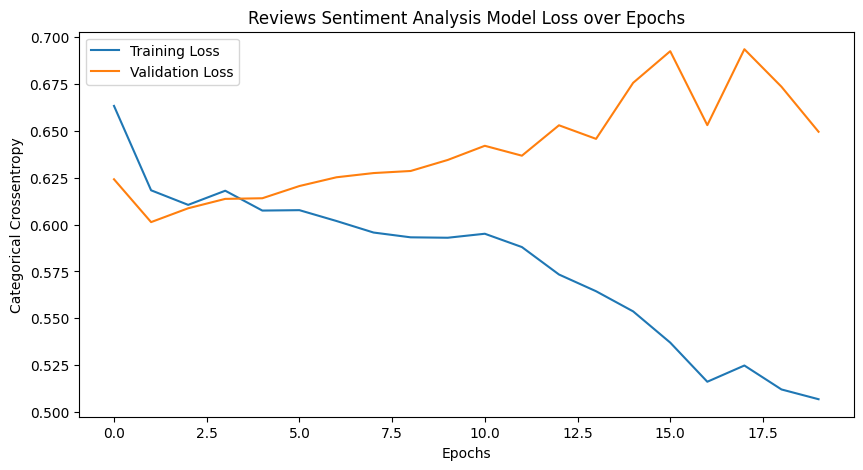

In [ ]:
# Plot loss
plt.figure(figsize=(10,5))
plt.plot(metrics_df.index, metrics_df.loss)
plt.plot(metrics_df.index, metrics_df.val_loss)
plt.title('Reviews Sentiment Analysis Model Loss over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Categorical Crossentropy')
plt.legend(['Training Loss', 'Validation Loss'])
plt.show()

In [ ]:
# Prepare test dataset
X_test = X_val_lstm
y_test = y_val_lstm




In [ ]:
# Get predictions on test dataset
y_pred = model.predict(test_padded, batch_size = 64)

1/1 [==============================] - 1s 1s/step


In [ ]:
y_pred

array([[0.13  , 0.87  ],
       [0.4326, 0.567 ],
       [0.3955, 0.6045],
       [0.432 , 0.5684],
       [0.4875, 0.5127],
       [0.3977, 0.6025],
       [0.4893, 0.5107],
       [0.288 , 0.712 ],
       [0.2876, 0.7124],
       [0.1387, 0.8613],
       [0.2678, 0.7324],
       [0.4893, 0.5107],
       [0.3042, 0.6963],
       [0.1305, 0.869 ],
       [0.404 , 0.596 ],
       [0.4382, 0.5615],
       [0.2542, 0.7466],
       [0.4893, 0.5107],
       [0.1841, 0.816 ],
       [0.269 , 0.731 ],
       [0.3967, 0.6035],
       [0.1876, 0.812 ],
       [0.1771, 0.823 ],
       [0.4893, 0.5107],
       [0.3066, 0.6934],
       [0.1971, 0.803 ],
       [0.4287, 0.5713],
       [0.3123, 0.6875],
       [0.4893, 0.5107],
       [0.2378, 0.7617],
       [0.2137, 0.7866],
       [0.3806, 0.619 ],
       [0.2137, 0.7866]], dtype=float16)

In [ ]:
y_test

78     1
141    1
64     1
109    1
31     0
137    1
7      1
144    1
108    0
95     1
9      1
131    0
5      1
51     0
49     1
68     0
136    1
122    1
116    1
36     0
163    0
83     0
158    1
132    1
46     1
73     0
2      1
81     1
71     1
125    1
10     1
65     0
60     1
Name: Relationship Type, dtype: int64

In [ ]:
# Evaluate the model performance on test dataset
from sklearn.metrics import confusion_matrix, precision_score, accuracy_score, recall_score, f1_score, roc_auc_score ,classification_report, RocCurveDisplay

y_pred = np.argmax(y_pred, axis=1)
accuracy = accuracy_score(y_test, y_pred)
# print('Accuracy: {:.2f}%'.format(accuracy))
precision = precision_score(y_test, y_pred,average='weighted')
print('Precision: {:.2f}%'.format(precision))
recall = recall_score(y_test, y_pred, average='weighted')
print('Recall: {:.2f}%'.format( recall))
f1 = f1_score(y_test, y_pred,average='weighted')
print('F1 score: {:.2f}%'.format( f1))
print('Accuracy: {:.2f}%'.format(accuracy))
# print(classification_report(df_test['true'], df_test['pred']))


# confusion matrix
matrix = confusion_matrix(y_test, y_pred)
print("Confusion metrics \n",matrix)
print('**********************************************************')
print('*****************  Classification Report  ****************')
print('**********************************************************')
print(classification_report(y_test,y_pred))


Precision: 0.49%
Recall: 0.70%
F1 score: 0.57%
Accuracy: 0.70%
Confusion metrics 
 [[ 0 10]
 [ 0 23]]
**********************************************************
*****************  Classification Report  ****************
**********************************************************
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        10
           1       0.70      1.00      0.82        23

    accuracy                           0.70        33
   macro avg       0.35      0.50      0.41        33
weighted avg       0.49      0.70      0.57        33



In [ ]:
dfResults = pd.DataFrame(columns=['Model','Accuracy', 'Precision','Recall','F1 score','Confusion matrix'])
dfResults

,Model,Accuracy,Precision,Recall,F1 score,Confusion matrix


In [ ]:
# confusion matrix
matrix = confusion_matrix(y_test, y_pred)
print("Confusion metrics \n",matrix)
print('**********************************************************')
print('*****************  Classification Report  ****************')
print('**********************************************************')
print(classification_report(y_test,y_pred))

Confusion metrics 
 [[ 0 10]
 [ 0 23]]
**********************************************************
*****************  Classification Report  ****************
**********************************************************
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        10
           1       0.70      1.00      0.82        23

    accuracy                           0.70        33
   macro avg       0.35      0.50      0.41        33
weighted avg       0.49      0.70      0.57        33



In [ ]:
# Display the records for all the calssifiers
dfResults.head()

,Model,Accuracy,Precision,Recall,F1 score,Confusion matrix
